In [455]:
import os
import numpy as np
import json
import random
import math
import string
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import FuncFormatter

from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score as f1_metric
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import FeatureUnion
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColumnDataSource, ColorBar, HoverTool
from bokeh.transform import linear_cmap

from scipy.stats import gaussian_kde

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as ImbPipeline

from gensim.models import LdaModel
from gensim.models import HdpModel
from gensim.matutils import Sparse2Corpus
from gensim.corpora.dictionary import Dictionary
from gensim.models.coherencemodel import CoherenceModel

import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import random_split
import torch.nn as nn
import torch.nn.functional as F

### 2022

In [2]:
with open("C:/V/Notes/Dissertation/nvdcve-1.1-2022/nvdcve-1.1-2022.json", 'r', encoding = 'utf-8') as json_file:

    data = json.load(json_file)

In [3]:
df_flat = pd.json_normalize(data, record_path = ['CVE_Items'], meta = ['CVE_data_timestamp']) #normalizing it, atleast trying

In [4]:
#problemtype and description still had lists inside columns so had to normalize it
problemtype_data = df_flat['cve.problemtype.problemtype_data']
problemtype_flattened = []
for item in problemtype_data:
    if isinstance(item, list):
        for subitem in item:
            problemtype_flattened.append(subitem)
    else:
        problemtype_flattened.append(item)

df_problemtype = pd.json_normalize(problemtype_flattened)
df_problemtype.columns = [f'problemtype.{col}' for col in df_problemtype.columns]

description_data = df_flat['cve.description.description_data']
description_flattened = []
for item in description_data:
    if isinstance(item, list):
        for subitem in item:
            description_flattened.append(subitem)
    else:
        description_flattened.append(item)

df_description = pd.json_normalize(description_flattened)
df_description.columns = [f'description.{col}' for col in df_description.columns]

df_flat = pd.concat([df_flat.drop(['cve.problemtype.problemtype_data', 'cve.description.description_data'], axis = 1), df_problemtype, df_description], axis = 1)

In [5]:
cols = ["publishedDate", "lastModifiedDate", "cve.CVE_data_meta.ID", "problemtype.description", "description.value", "impact.baseMetricV3.cvssV3.baseScore", "impact.baseMetricV3.cvssV3.baseSeverity"]
df_super = df_flat.loc[:, cols].copy() #took only the columns i needed, though i did not end up using problemtype and basescore

In [6]:
problemtype_data_new = df_super['problemtype.description']
problemtype_flattened_new = []
for item in problemtype_data_new:
    if isinstance(item, list) and len(item) > 0:
        problemtype_flattened_new.append(item[0])
    else:
        problemtype_flattened_new.append({})

df_problemtype_new = pd.json_normalize(problemtype_flattened_new)
df_problemtype_new.columns = [f'problemtype.{col}' for col in df_problemtype_new.columns]

In [7]:
df_super['problemtype.description'] = df_super['problemtype.description'].apply(lambda x: x[0]['value'] if isinstance(x, list) and len(x) > 0 else '')

df_problemtype_new = pd.DataFrame(df_super['problemtype.description'], columns = ['problemtype.description'])

In [8]:
df_super = df_super.rename(columns = {'impact.baseMetricV3.cvssV3.baseScore': 'BaseScore_V3'}) 
df_super = df_super.rename(columns = {'impact.baseMetricV3.cvssV3.baseSeverity': 'BaseSeverity_V3'}) 
df_super = df_super.rename(columns = {'description.value': 'description'}) 
df_super = df_super.rename(columns = {'problemtype.description': 'problemtype'}) 
df_super = df_super.rename(columns = {'cve.CVE_data_meta.ID': 'CVE_ID'}) 

In [9]:
df_super.isnull().sum() #so there are 732 nulls

publishedDate         0
lastModifiedDate      0
CVE_ID                0
problemtype           0
description           0
BaseScore_V3        732
BaseSeverity_V3     732
dtype: int64

In [10]:
df_super.dropna(inplace = True) #dropped

In [11]:
df_super.duplicated().sum() #no duplicates

0

In [12]:
#fixing the columns with date-time
pub_date = df_super["publishedDate"]

date_list = []
time_list = []

for x in pub_date:
    dat = x.split('T')[0]
    tim = x.split("T")[1]
    date_list.append(dat)
    time_list.append(tim)
    
df_super["Published_Date"] = date_list

In [13]:
mod_date = df_super["lastModifiedDate"]

date_list_1 = []
time_list_1 = []

for x in mod_date:
    dat_1 = x.split('T')[0]
    tim_1 = x.split("T")[1]
    date_list_1.append(dat_1)
    time_list_1.append(tim_1)
    
df_super["Modified_Date"] = date_list_1

In [14]:
df_super = df_super.drop(["publishedDate", "lastModifiedDate"], axis = 1)

In [15]:
exp_1 = df_super["Published_Date"]

date_month = []
for x in exp_1:
    y = x[:-3]
    date_month.append(y)
    
df_super["Published_date"]= date_month

In [16]:
exp_2 = df_super["Published_Date"]

date_month_2 = []
for x in exp_2:
    y = x[:-3]
    date_month_2.append(y)
    
df_super["Modified_date"]= date_month_2

In [17]:
df_super = df_super.drop(["Modified_Date", "Published_Date"], axis = 1)

In [18]:
df_super = df_super.drop(["Modified_date"], axis = 1)

In [19]:
df_super.head() #cleaned dataframe

,CVE_ID,problemtype,description,BaseScore_V3,BaseSeverity_V3,Published_date
0,CVE-2022-0001,NVD-CWE-noinfo,Non-transparent sharing of branch predictor se...,6.5,MEDIUM,2022-03
1,CVE-2022-0002,NVD-CWE-noinfo,Non-transparent sharing of branch predictor wi...,6.5,MEDIUM,2022-03
2,CVE-2022-0004,NVD-CWE-noinfo,Hardware debug modes and processor INIT settin...,6.8,MEDIUM,2022-05
3,CVE-2022-0005,CWE-668,Sensitive information accessible by physical p...,2.4,LOW,2022-05
4,CVE-2022-0010,CWE-532,Insertion of Sensitive Information into Log Fi...,5.5,MEDIUM,2023-05


In [528]:
print(df_super.shape)

(22981, 6)


In [20]:
df_super_v = df_super.drop(df_super[df_super["Published_date"].astype(str).str.contains("2023")].index)

In [533]:
print(df_super_v.shape)

(19797, 6)


In [21]:
severity_counts_v = df_super_v['BaseSeverity_V3'].value_counts()
severity_counts_v = severity_counts_v.sort_index()

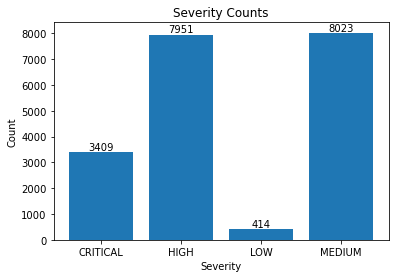

In [22]:
plt.bar(severity_counts_v.index, severity_counts_v)
plt.xlabel('Severity')
plt.ylabel('Count')
plt.title('Severity Counts')

for index, count in enumerate(severity_counts_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [23]:
month_counts_v = df_super_v['Published_date'].value_counts()
month_counts_v = month_counts_v.sort_index()

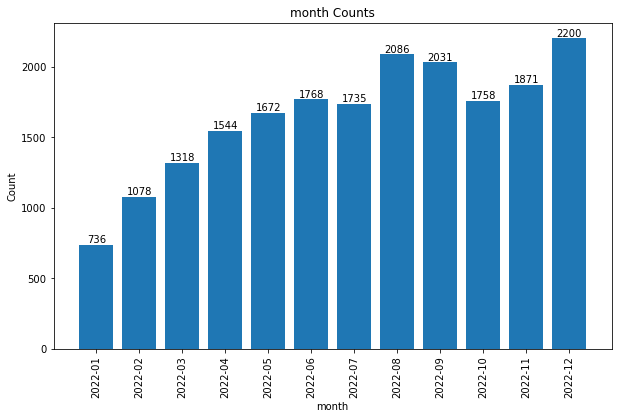

In [24]:
plt.figure(figsize = (10, 6))
plt.bar(month_counts_v.index, month_counts_v)
plt.xlabel('month')
plt.ylabel('Count')
plt.title('month Counts')
plt.xticks(rotation=90)

for index, count in enumerate(month_counts_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

### 2021

In [25]:
with open("C:/V/Notes/Dissertation/nvdcve-1.1-2021/nvdcve-1.1-2021.json", 'r', encoding = 'utf-8') as json_file:
    data1 = json.load(json_file)

In [26]:
df_flat_21 = pd.json_normalize(data1, record_path = ['CVE_Items'], meta = ['CVE_data_timestamp'])

In [27]:
problemtype_data = df_flat_21['cve.problemtype.problemtype_data']
problemtype_flattened = []
for item in problemtype_data:
    if isinstance(item, list):
        for subitem in item:
            problemtype_flattened.append(subitem)
    else:
        problemtype_flattened.append(item)

df_problemtype = pd.json_normalize(problemtype_flattened)
df_problemtype.columns = [f'problemtype.{col}' for col in df_problemtype.columns]

description_data = df_flat_21['cve.description.description_data']
description_flattened = []
for item in description_data:
    if isinstance(item, list):
        for subitem in item:
            description_flattened.append(subitem)
    else:
        description_flattened.append(item)

df_description = pd.json_normalize(description_flattened)
df_description.columns = [f'description.{col}' for col in df_description.columns]

df_flat_21 = pd.concat([df_flat_21.drop(['cve.problemtype.problemtype_data', 'cve.description.description_data'], axis = 1), df_problemtype, df_description], axis = 1)

In [28]:
cols = ["publishedDate", "lastModifiedDate", "cve.CVE_data_meta.ID", "problemtype.description", "description.value", "impact.baseMetricV3.cvssV3.baseScore", "impact.baseMetricV3.cvssV3.baseSeverity"]
df_super_21 = df_flat_21.loc[:, cols].copy()

In [29]:
problemtype_data_new = df_super_21['problemtype.description']
problemtype_flattened_new = []
for item in problemtype_data_new:
    if isinstance(item, list) and len(item) > 0:
        problemtype_flattened_new.append(item[0])
    else:
        problemtype_flattened_new.append({})

df_problemtype_new = pd.json_normalize(problemtype_flattened_new)
df_problemtype_new.columns = [f'problemtype.{col}' for col in df_problemtype_new.columns]

In [30]:
df_super_21['problemtype.description'] = df_super_21['problemtype.description'].apply(lambda x: x[0]['value'] if isinstance(x, list) and len(x) > 0 else '')

df_problemtype_new = pd.DataFrame(df_super_21['problemtype.description'], columns=['problemtype.description'])

In [31]:
df_super_21 = df_super_21.rename(columns = {'impact.baseMetricV3.cvssV3.baseScore': 'BaseScore_V3'}) 
df_super_21 = df_super_21.rename(columns = {'impact.baseMetricV3.cvssV3.baseSeverity': 'BaseSeverity_V3'}) 
df_super_21 = df_super_21.rename(columns = {'description.value': 'description'}) 
df_super_21 = df_super_21.rename(columns = {'problemtype.description': 'problemtype'}) 
df_super_21 = df_super_21.rename(columns = {'cve.CVE_data_meta.ID': 'CVE_ID'}) 

In [32]:
df_super_21.isnull().sum()

publishedDate         0
lastModifiedDate      0
CVE_ID                0
problemtype           0
description           0
BaseScore_V3        698
BaseSeverity_V3     698
dtype: int64

In [33]:
df_super_21.dropna(inplace = True)

In [34]:
df_super_21.duplicated().sum()

0

In [35]:
pub_date_21 = df_super_21["publishedDate"]

date_list_21 = []
time_list_21 = []

for x in pub_date_21:
    dat = x.split('T')[0]
    tim = x.split("T")[1]
    date_list_21.append(dat)
    time_list_21.append(tim)
    
df_super_21["Published_Date"] = date_list_21

In [36]:
mod_date_21 = df_super_21["lastModifiedDate"]

date_list_1_21 = []
time_list_1_21 = []

for x in mod_date_21:
    dat_1 = x.split('T')[0]
    tim_1 = x.split("T")[1]
    date_list_1_21.append(dat_1)
    time_list_1_21.append(tim_1)
    
df_super_21["Modified_Date"] = date_list_1_21

In [37]:
df_super_21 = df_super_21.drop(["publishedDate", "lastModifiedDate"], axis = 1)

In [38]:
exp_1_21 = df_super_21["Published_Date"]

date_month_21 = []
for x in exp_1_21:
    y = x[:-3]
    date_month_21.append(y)
    
df_super_21["Published_date"]= date_month_21

In [39]:
df_super_21 = df_super_21.drop(["Modified_Date", "Published_Date"], axis = 1)

In [40]:
df_super_21_v = df_super_21[df_super_21['Published_date'].str.startswith('2021')]

In [530]:
print(df_super_21.shape)

(21045, 6)


In [534]:
print(df_super_21_v.shape)

(16207, 6)


In [41]:
severity_counts_21_v = df_super_21_v['BaseSeverity_V3'].value_counts()
severity_counts_21_v = severity_counts_21_v.sort_index()

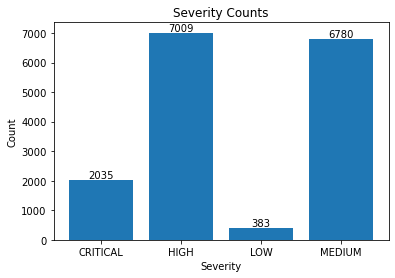

In [42]:
plt.bar(severity_counts_21_v.index, severity_counts_21_v)
plt.xlabel('Severity')
plt.ylabel('Count')
plt.title('Severity Counts')

for index, count in enumerate(severity_counts_21_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [43]:
month_counts_21_v = df_super_21_v['Published_date'].value_counts()
month_counts_21_v = month_counts_21_v.sort_index()

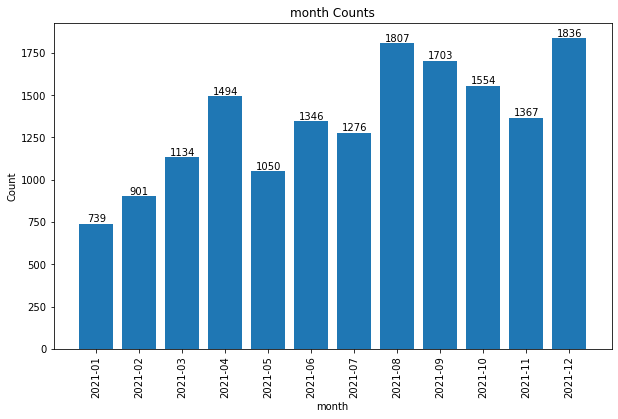

In [44]:
plt.figure(figsize = (10, 6))
plt.bar(month_counts_21_v.index, month_counts_21_v)
plt.xlabel('month')
plt.ylabel('Count')
plt.title('month Counts')
plt.xticks(rotation=90)

for index, count in enumerate(month_counts_21_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

### 2020

In [45]:
with open("C:/V/Notes/Dissertation/nvdcve-1.1-2020/nvdcve-1.1-2020.json", 'r', encoding = 'utf-8') as json_file:
    data2 = json.load(json_file)

In [46]:
df_flat_20 = pd.json_normalize(data2, record_path = ['CVE_Items'], meta = ['CVE_data_timestamp'])

In [47]:
problemtype_data = df_flat_20['cve.problemtype.problemtype_data']
problemtype_flattened = []
for item in problemtype_data:
    if isinstance(item, list):
        for subitem in item:
            problemtype_flattened.append(subitem)
    else:
        problemtype_flattened.append(item)

df_problemtype = pd.json_normalize(problemtype_flattened)
df_problemtype.columns = [f'problemtype.{col}' for col in df_problemtype.columns]

description_data = df_flat_20['cve.description.description_data']
description_flattened = []
for item in description_data:
    if isinstance(item, list):
        for subitem in item:
            description_flattened.append(subitem)
    else:
        description_flattened.append(item)

df_description = pd.json_normalize(description_flattened)
df_description.columns = [f'description.{col}' for col in df_description.columns]

df_flat_20 = pd.concat([df_flat_20.drop(['cve.problemtype.problemtype_data', 'cve.description.description_data'], axis = 1), df_problemtype, df_description], axis = 1)

In [48]:
cols = ["publishedDate", "lastModifiedDate", "cve.CVE_data_meta.ID", "problemtype.description", "description.value", "impact.baseMetricV3.cvssV3.baseScore", "impact.baseMetricV3.cvssV3.baseSeverity"]
df_super_20 = df_flat_20.loc[:, cols].copy()

In [49]:
problemtype_data_new = df_super_20['problemtype.description']
problemtype_flattened_new = []
for item in problemtype_data_new:
    if isinstance(item, list) and len(item) > 0:
        problemtype_flattened_new.append(item[0])
    else:
        problemtype_flattened_new.append({})

df_problemtype_new = pd.json_normalize(problemtype_flattened_new)
df_problemtype_new.columns = [f'problemtype.{col}' for col in df_problemtype_new.columns]

In [50]:
df_super_20['problemtype.description'] = df_super_20['problemtype.description'].apply(lambda x: x[0]['value'] if isinstance(x, list) and len(x) > 0 else '')

df_problemtype_new = pd.DataFrame(df_super_20['problemtype.description'], columns = ['problemtype.description'])

In [51]:
df_super_20 = df_super_20.rename(columns = {'impact.baseMetricV3.cvssV3.baseScore': 'BaseScore_V3'}) 
df_super_20 = df_super_20.rename(columns = {'impact.baseMetricV3.cvssV3.baseSeverity': 'BaseSeverity_V3'}) 
df_super_20 = df_super_20.rename(columns = {'description.value': 'description'}) 
df_super_20 = df_super_20.rename(columns = {'problemtype.description': 'problemtype'}) 
df_super_20 = df_super_20.rename(columns = {'cve.CVE_data_meta.ID': 'CVE_ID'})

In [52]:
df_super_20.isnull().sum()

publishedDate          0
lastModifiedDate       0
CVE_ID                 0
problemtype            0
description            0
BaseScore_V3        1629
BaseSeverity_V3     1629
dtype: int64

In [53]:
df_super_20.dropna(inplace = True)

In [54]:
df_super_20.duplicated().sum()

0

In [55]:
pub_date_20 = df_super_20["publishedDate"]

date_list_20 = []
time_list_20 = []

for x in pub_date_20:
    dat = x.split('T')[0]
    tim = x.split("T")[1]
    date_list_20.append(dat)
    time_list_20.append(tim)
    
df_super_20["Published_Date"] = date_list_20

In [56]:
df_super_20 = df_super_20.drop(["publishedDate", "lastModifiedDate"], axis = 1)

In [57]:
exp_1_20 = df_super_20["Published_Date"]

date_month_20 = []
for x in exp_1_20:
    y = x[:-3]
    date_month_20.append(y)
    
df_super_20["Published_date"] = date_month_20

In [58]:
df_super_20 = df_super_20.drop(["Published_Date"], axis = 1)

In [59]:
df_super_20_v = df_super_20[df_super_20['Published_date'].str.startswith('2020')]

In [531]:
print(df_super_20.shape)

(18663, 6)


In [535]:
print(df_super_20_v.shape)

(14264, 6)


In [60]:
severity_counts_20_v = df_super_20_v['BaseSeverity_V3'].value_counts()
severity_counts_20_v = severity_counts_20_v.sort_index()

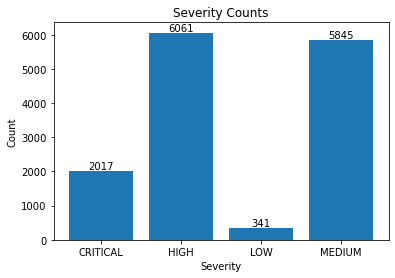

In [61]:
plt.bar(severity_counts_20_v.index, severity_counts_20_v)
plt.xlabel('Severity')
plt.ylabel('Count')
plt.title('Severity Counts')

for index, count in enumerate(severity_counts_20_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [62]:
month_counts_20_v = df_super_20_v['Published_date'].value_counts()
month_counts_20_v = month_counts_20_v.sort_index()

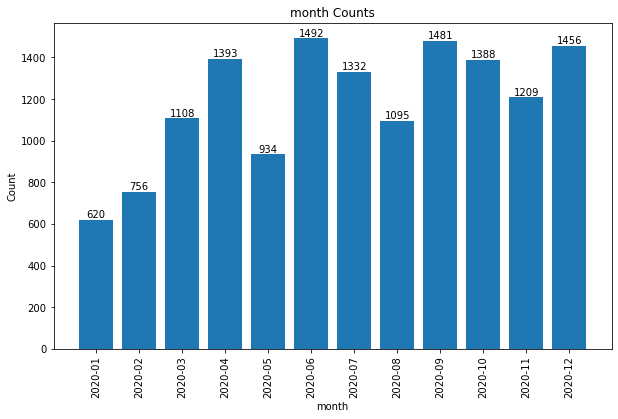

In [63]:
plt.figure(figsize = (10, 6))
plt.bar(month_counts_20_v.index, month_counts_20_v)
plt.xlabel('month')
plt.ylabel('Count')
plt.title('month Counts')
plt.xticks(rotation = 90)

for index, count in enumerate(month_counts_20_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

### 2019

In [64]:
with open("C:/V/Notes/Dissertation/nvdcve-1.1-2019/nvdcve-1.1-2019.json", 'r', encoding = 'utf-8') as json_file:
    data3 = json.load(json_file)

In [65]:
df_flat_19 = pd.json_normalize(data3, record_path = ['CVE_Items'], meta = ['CVE_data_timestamp'])

In [66]:
problemtype_data = df_flat_19['cve.problemtype.problemtype_data']
problemtype_flattened = []
for item in problemtype_data:
    if isinstance(item, list):
        for subitem in item:
            problemtype_flattened.append(subitem)
    else:
        problemtype_flattened.append(item)

df_problemtype = pd.json_normalize(problemtype_flattened)
df_problemtype.columns = [f'problemtype.{col}' for col in df_problemtype.columns]

description_data = df_flat_19['cve.description.description_data']
description_flattened = []
for item in description_data:
    if isinstance(item, list):
        for subitem in item:
            description_flattened.append(subitem)
    else:
        description_flattened.append(item)

df_description = pd.json_normalize(description_flattened)
df_description.columns = [f'description.{col}' for col in df_description.columns]

df_flat_19 = pd.concat([df_flat_19.drop(['cve.problemtype.problemtype_data', 'cve.description.description_data'], axis = 1), df_problemtype, df_description], axis = 1)

In [67]:
cols = ["publishedDate", "lastModifiedDate", "cve.CVE_data_meta.ID", "problemtype.description", "description.value", "impact.baseMetricV3.cvssV3.baseScore", "impact.baseMetricV3.cvssV3.baseSeverity"]
df_super_19 = df_flat_19.loc[:, cols].copy()

In [68]:
problemtype_data_new = df_super_19['problemtype.description']
problemtype_flattened_new = []
for item in problemtype_data_new:
    if isinstance(item, list) and len(item) > 0:
        problemtype_flattened_new.append(item[0])
    else:
        problemtype_flattened_new.append({})

df_problemtype_new = pd.json_normalize(problemtype_flattened_new)
df_problemtype_new.columns = [f'problemtype.{col}' for col in df_problemtype_new.columns]

In [69]:
df_super_19['problemtype.description'] = df_super_19['problemtype.description'].apply(lambda x: x[0]['value'] if isinstance(x, list) and len(x) > 0 else '')

df_problemtype_new = pd.DataFrame(df_super_19['problemtype.description'], columns = ['problemtype.description'])

In [70]:
df_super_19 = df_super_19.rename(columns = {'impact.baseMetricV3.cvssV3.baseScore': 'BaseScore_V3'}) 
df_super_19 = df_super_19.rename(columns = {'impact.baseMetricV3.cvssV3.baseSeverity': 'BaseSeverity_V3'}) 
df_super_19 = df_super_19.rename(columns = {'description.value': 'description'}) 
df_super_19 = df_super_19.rename(columns = {'problemtype.description': 'problemtype'}) 
df_super_19 = df_super_19.rename(columns = {'cve.CVE_data_meta.ID': 'CVE_ID'})

In [71]:
df_super_19.isnull().sum()

publishedDate          0
lastModifiedDate       0
CVE_ID                 0
problemtype            0
description            0
BaseScore_V3        1415
BaseSeverity_V3     1415
dtype: int64

In [72]:
df_super_19.dropna(inplace = True)

In [73]:
df_super_19.duplicated().sum()

0

In [74]:
pub_date_19 = df_super_19["publishedDate"]

date_list_19 = []
time_list_19 = []

for x in pub_date_19:
    dat = x.split('T')[0]
    tim = x.split("T")[1]
    date_list_19.append(dat)
    time_list_19.append(tim)
    
df_super_19["Published_Date"] = date_list_19

In [75]:
df_super_19 = df_super_19.drop(["publishedDate", "lastModifiedDate"], axis = 1)

In [76]:
exp_1_19 = df_super_19["Published_Date"]

date_month_19 = []
for x in exp_1_19:
    y = x[:-3]
    date_month_19.append(y)
    
df_super_19["Published_date"] = date_month_19

In [77]:
df_super_19 = df_super_19.drop(["Published_Date"], axis = 1)

In [78]:
df_super_19_v = df_super_19[df_super_19['Published_date'].str.startswith('2019')]

In [532]:
print(df_super_19.shape)

(15495, 6)


In [536]:
print(df_super_19_v.shape)

(12804, 6)


In [79]:
severity_counts_19_v = df_super_19_v['BaseSeverity_V3'].value_counts()
severity_counts_19_v = severity_counts_19_v.sort_index()

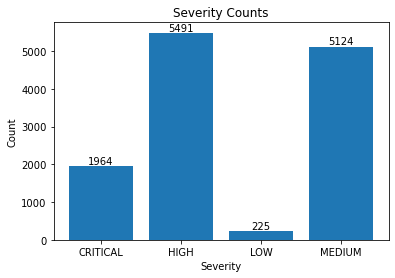

In [80]:
plt.bar(severity_counts_19_v.index, severity_counts_19_v)
plt.xlabel('Severity')
plt.ylabel('Count')
plt.title('Severity Counts')

for index, count in enumerate(severity_counts_19_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [81]:
month_counts_19_v = df_super_19_v['Published_date'].value_counts()
month_counts_19_v = month_counts_19_v.sort_index()

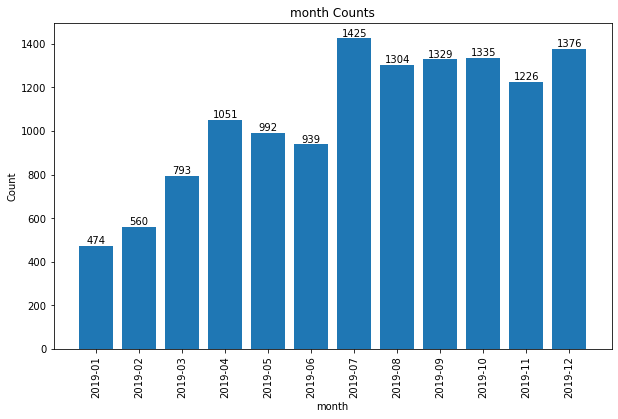

In [82]:
plt.figure(figsize = (10, 6))
plt.bar(month_counts_19_v.index, month_counts_19_v)
plt.xlabel('month')
plt.ylabel('Count')
plt.title('month Counts')
plt.xticks(rotation = 90)

for index, count in enumerate(month_counts_19_v):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

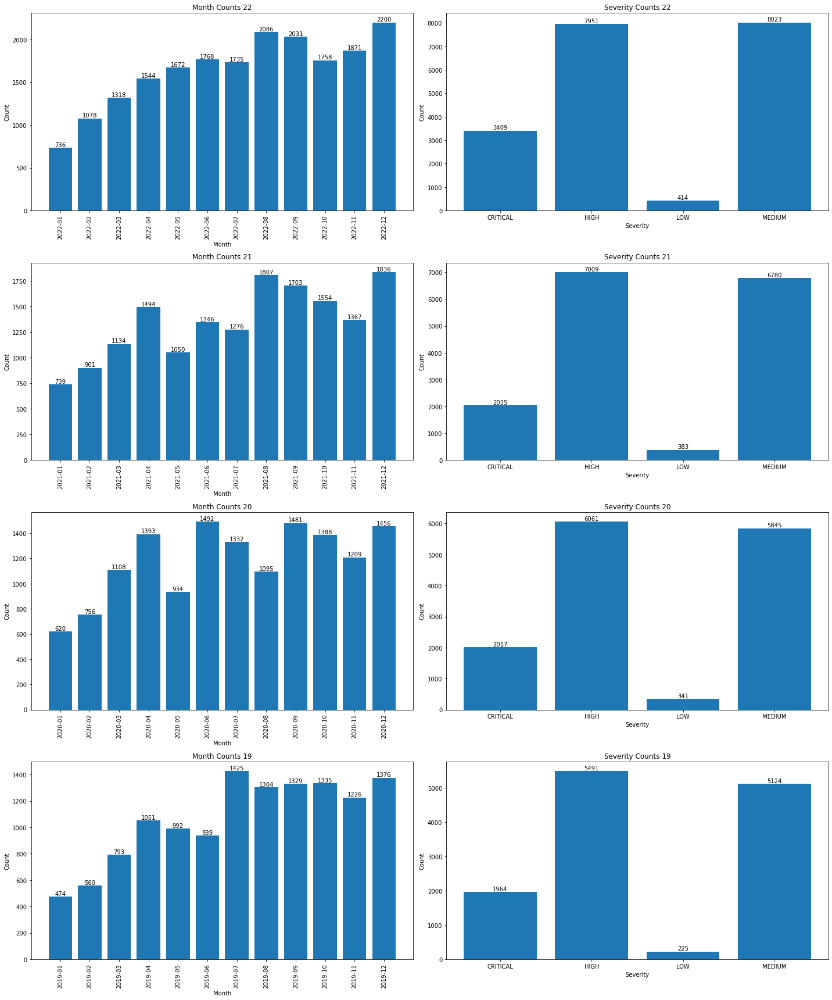

In [83]:
fig, axes = plt.subplots(4, 2, figsize = (20, 24))  

month_data = [month_counts_v, month_counts_21_v, month_counts_20_v, month_counts_19_v]
severity_data = [severity_counts_v, severity_counts_21_v, severity_counts_20_v, severity_counts_19_v]
titles_months = ['Month Counts 22', 'Month Counts 21', 'Month Counts 20', 'Month Counts 19']
titles_severity = ['Severity Counts 22', 'Severity Counts 21', 'Severity Counts 20', 'Severity Counts 19']

for i in range(4):
    
    axes[i, 0].bar(month_data[i].index, month_data[i])
    axes[i, 0].set_title(titles_months[i])
    axes[i, 0].set_xlabel('Month')
    axes[i, 0].set_ylabel('Count')
    axes[i, 0].tick_params(axis = 'x', rotation = 90)

    for index, count in enumerate(month_data[i]):
        axes[i, 0].text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)
    
    
    axes[i, 1].bar(severity_data[i].index, severity_data[i])
    axes[i, 1].set_title(titles_severity[i])
    axes[i, 1].set_xlabel('Severity')
    axes[i, 1].set_ylabel('Count')
    axes[i, 1].tick_params(axis = 'x')

    for index, count in enumerate(severity_data[i]):
        axes[i, 1].text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.tight_layout()
plt.show()

### together

In [84]:
df_mega = pd.concat([df_super, df_super_21, df_super_20, df_super_19], ignore_index = True)

In [537]:
print(df_mega.shape)

(74265, 6)


In [86]:
df_mega = df_mega.drop(df_mega[df_mega["Published_date"].astype(str).str.contains("2023")].index)

In [930]:
df_mega.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74265 entries, 0 to 78183
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CVE_ID           74265 non-null  object 
 1   problemtype      74265 non-null  object 
 2   description      74265 non-null  object 
 3   BaseScore_V3     74265 non-null  float64
 4   BaseSeverity_V3  74265 non-null  object 
 5   Published_date   74265 non-null  object 
dtypes: float64(1), object(5)
memory usage: 4.0+ MB


In [929]:
df_mega.head()

,CVE_ID,problemtype,description,BaseScore_V3,BaseSeverity_V3,Published_date
0,CVE-2022-0001,NVD-CWE-noinfo,Non-transparent sharing of branch predictor se...,6.5,MEDIUM,2022-03
1,CVE-2022-0002,NVD-CWE-noinfo,Non-transparent sharing of branch predictor wi...,6.5,MEDIUM,2022-03
2,CVE-2022-0004,NVD-CWE-noinfo,Hardware debug modes and processor INIT settin...,6.8,MEDIUM,2022-05
3,CVE-2022-0005,CWE-668,Sensitive information accessible by physical p...,2.4,LOW,2022-05
5,CVE-2022-0011,CWE-436,PAN-OS software provides options to exclude sp...,6.5,MEDIUM,2022-02


In [545]:
df_mega_2 = df_mega.copy()

In [547]:
df_mega_2['Year'] = pd.DatetimeIndex(df_mega_2['Published_date']).year


grouped_by_year_severity = df_mega_2.groupby(['Year', 'BaseSeverity_V3']).size().reset_index(name = 'Counts')


df_mega_2['Month'] = pd.DatetimeIndex(df_mega_2['Published_date']).month
grouped_by_year_month = df_mega_2.groupby(['Year', 'Month']).size().reset_index(name = 'Counts')

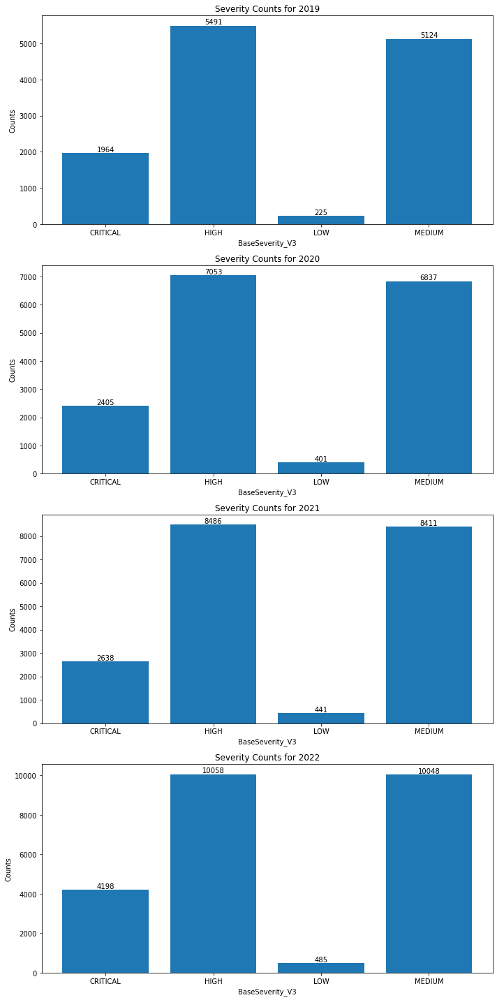

In [564]:
unique_years = grouped_by_year_severity['Year'].unique()

fig, axes = plt.subplots(len(unique_years), 1, figsize = (10, 5 * len(unique_years)))

for i, year in enumerate(unique_years):
    ax = axes[i]
    subset_data = grouped_by_year_severity[grouped_by_year_severity['Year'] == year]
    bars = ax.bar(subset_data['BaseSeverity_V3'], subset_data['Counts'])
    ax.set_title(f'Severity Counts for {year}')
    ax.set_xlabel('BaseSeverity_V3')
    ax.set_ylabel('Counts')
    
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha = 'center', va = 'bottom')

plt.tight_layout()
plt.show()

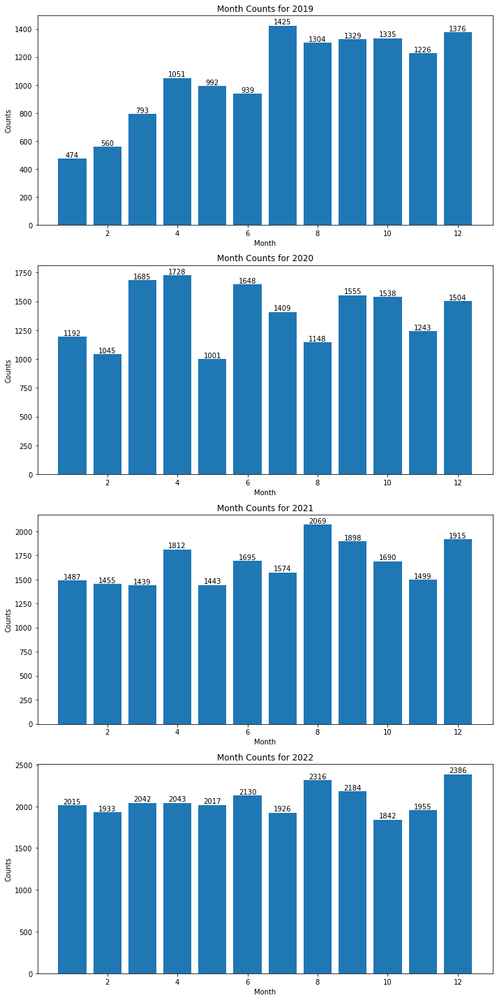

In [565]:
fig, axes = plt.subplots(len(unique_years), 1, figsize=(10, 5 * len(unique_years)))

for i, year in enumerate(unique_years):
    ax = axes[i]
    subset_data = grouped_by_year_month[grouped_by_year_month['Year'] == year]
    bars = ax.bar(subset_data['Month'], subset_data['Counts'])
    ax.set_title(f'Month Counts for {year}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Counts')
    
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha = 'center', va = 'bottom')
        
plt.tight_layout()
plt.show()

In [87]:
severity_counts_mega = df_mega['BaseSeverity_V3'].value_counts()
severity_counts_mega = severity_counts_mega.sort_index()

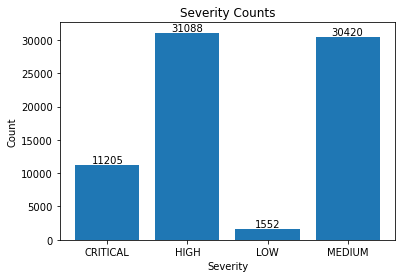

In [88]:
plt.bar(severity_counts_mega.index, severity_counts_mega)
plt.xlabel('Severity')
plt.ylabel('Count')
plt.title('Severity Counts')

for index, count in enumerate(severity_counts_mega):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [89]:
month_counts_mega = df_mega['Published_date'].value_counts()
month_counts_mega = month_counts_mega.sort_index()

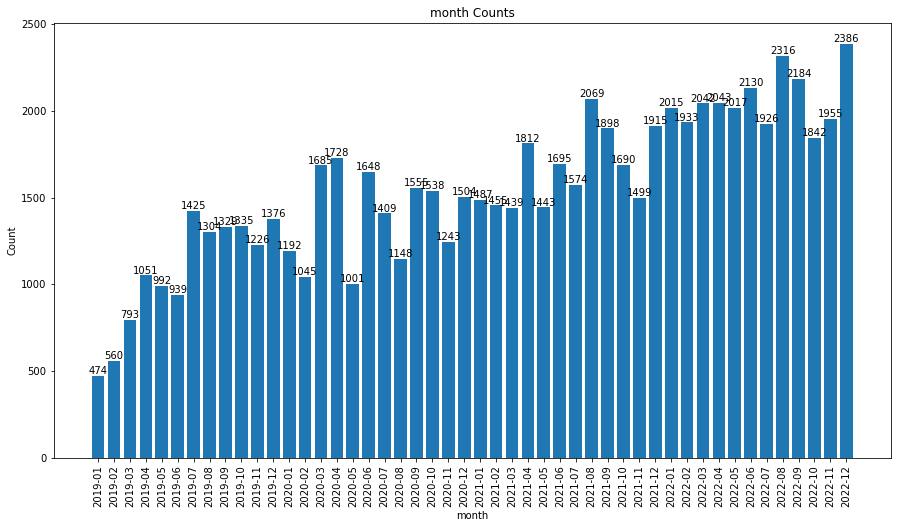

In [90]:
plt.figure(figsize = (15, 8))
plt.bar(month_counts_mega.index, month_counts_mega)
plt.xlabel('month')
plt.ylabel('Count')
plt.title('month Counts')
plt.xticks(rotation = 90)

for index, count in enumerate(month_counts_mega):
    plt.text(index, count, str(count), ha = 'center', va = 'bottom', fontsize = 10)

plt.show()

In [567]:
df_mega_2 = df_mega.copy()

### text

In [568]:
def preprocess_text(text):
    stop_words = set(stopwords.words('english'))
    
    stop_words.add('could') #because it came up as one of the topics
    
    text = text.lower()

    text = ''.join(char for char in text if char.isalnum() or char.isspace())
    
    text = text.replace('vulnerability', '') 
    
    tokens = word_tokenize(text)
    tokens = [token for token in tokens if token.isalpha() and token not in stop_words]  

    word_freq = Counter(tokens)

    cleaned_tokens = [token for token in tokens if word_freq[token] >= 3] # reducing the noise

    cleaned_text = ' '.join(cleaned_tokens)
    
    return cleaned_text, cleaned_tokens

In [569]:
def preprocess_text_2(text):   #just to give me clean sentences, like readable clean ones
    stop_words = set(stopwords.words('english'))
    
    stop_words.add('could')
    
    text = text.lower()

    text = ''.join(char for char in text if char.isalnum() or char.isspace())
    
    text = text.replace('vulnerability', '')
    
    tokens = word_tokenize(text)
    
    tokens = [token for token in tokens if token.isalnum() and token not in stop_words]

    cleaned_text = ' '.join(tokens)
    return cleaned_text

In [570]:
df_mega_2["clean_description"],df_mega_2["tokens"]  = zip(*df_mega_2["description"].apply(preprocess_text))

In [571]:
df_mega_2["clean_desc"] = df_mega_2["description"].apply(preprocess_text_2)

In [572]:
label_encoder = LabelEncoder()

df_mega_2['label'] = label_encoder.fit_transform(df_mega_2['BaseSeverity_V3'])

In [576]:
df_mega_2.head()

,CVE_ID,problemtype,description,BaseScore_V3,BaseSeverity_V3,Published_date,clean_description,tokens,clean_desc,label
0,CVE-2022-0001,NVD-CWE-noinfo,Non-transparent sharing of branch predictor se...,6.5,MEDIUM,2022-03,,[],nontransparent sharing branch predictor select...,3
1,CVE-2022-0002,NVD-CWE-noinfo,Non-transparent sharing of branch predictor wi...,6.5,MEDIUM,2022-03,,[],nontransparent sharing branch predictor within...,3
2,CVE-2022-0004,NVD-CWE-noinfo,Hardware debug modes and processor INIT settin...,6.8,MEDIUM,2022-05,intelr intelr intelr,"[intelr, intelr, intelr]",hardware debug modes processor init setting al...,3
3,CVE-2022-0005,CWE-668,Sensitive information accessible by physical p...,2.4,LOW,2022-05,,[],sensitive information accessible physical prob...,2
5,CVE-2022-0011,CWE-436,PAN-OS software provides options to exclude sp...,6.5,MEDIUM,2022-02,panos url category url category url category l...,"[panos, url, category, url, category, url, cat...",panos software provides options exclude specif...,3


## Grouping

In [98]:
df_mega_2['Year'] = pd.to_datetime(df_mega_2['Published_date']).dt.year

grouped_by_year = df_mega_2.groupby("Year")

dataframes_by_year = [group for _, group in grouped_by_year]

In [577]:
dataframe_by_severity = df_mega_2.groupby("BaseSeverity_V3")

In [99]:
def LDA_gen(desc, num, num_words = 6, vectorizer_type = 'count'): #good for small data
    
    if vectorizer_type == 'count':
        vectorizer_desc = CountVectorizer()
    elif vectorizer_type == 'tfidf':
        vectorizer_desc = TfidfVectorizer()
    else:
        raise ValueError("Invalid vectorizer_type. Choose 'count' or 'tfidf'.")

    # Making DTM
    dtm_desc = vectorizer_desc.fit_transform(desc)

    id2word_desc = {v: k for k, v in vectorizer_desc.vocabulary_.items()}

    corpus_desc = Sparse2Corpus(dtm_desc.T)

    # LDA
    lda_model_desc = LdaModel(corpus = corpus_desc, num_topics = num, id2word = id2word_desc, passes = 15)

    # Most likely term in each topic
    topic_terms_desc = lda_model_desc.print_topics(num_topics = num, num_words = num_words)
    
    return lda_model_desc, topic_terms_desc, corpus_desc, id2word_desc

In [100]:
def LDA_gen_2(desc, num, num_words = 6, vectorizer_type = 'count'): #good for bigger data
    
    texts = [text.split() for text in desc]
    
    gensim_dict = Dictionary(texts)

    corpus_desc = [gensim_dict.doc2bow(text) for text in texts]

    lda_model_desc = LdaModel(corpus=corpus_desc, num_topics = num, id2word = gensim_dict, passes = 15)

    topic_terms_desc = lda_model_desc.print_topics(num_topics = num, num_words = num_words)
    
    return lda_model_desc, topic_terms_desc, corpus_desc, gensim_dict

In [ ]:
def compute_coherence_for_each_topic(model, texts, dictionary, coherence = 'c_v'):
    """
    Compute c_v coherence for each topic using the HDP model.
    """
    topic_weights = model.get_topics()
    topic_terms = [sorted(enumerate(topic), key = lambda x: x[1], reverse = True) for topic in topic_weights]
    
    topics = []
    for topic in topic_terms:
        topics.append([(dictionary[id], weight) for id, weight in topic])
    
    coherence_values = []

    for topic in topics:
        topic = [word for word, _ in topic]
        cm = CoherenceModel(topics = [topic], texts = texts, dictionary = dictionary, coherence = coherence)
        coherence_values.append(cm.get_coherence())
        
    return coherence_values

In [ ]:
def format_topics_sentences(ldamodel, corpus, texts):

    sent_topics_df = pd.DataFrame(columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords'])

    # Getting main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key = lambda x: x[1], reverse = True)
        
        # Getting the Dominant topic, Perc Contribution, and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df.loc[i] = [int(topic_num), round(prop_topic, 4), topic_keywords]  
            else:
                break

    # Addding og text to the end of the output
    contents = pd.Series(texts).reset_index(drop = True)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis = 1).rename(columns = {0: 'Original_Text'})
    return sent_topics_df

In [ ]:
def topics_per_document(model, corpus, start = 0, end = 6):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    
    for i, corp in enumerate(corpus_sel):
        topic_percs = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse = True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
        
    return(dominant_topics, topic_percentages)

In [ ]:
def convert_to_gensim_dictionary(id2word_desc):
    
    word2id_desc = {v: k for k, v in id2word_desc.items()}
    gensim_dict = Dictionary()
    gensim_dict.token2id = word2id_desc
    
    return gensim_dict

### Critical

In [623]:
crtical = dataframe_by_severity.get_group("CRITICAL")

In [624]:
crit_model_desc, crit_model_terms, crit_corpus_dec, crit_id2word_desc = LDA_gen(crtical["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [625]:
crit_model_terms

[(0,
  '0.533*"earlier" + 0.035*"application" + 0.033*"docker" + 0.026*"system" + 0.020*"tibco" + 0.011*"session"'),
 (1,
  '0.336*"snapdragon" + 0.122*"sd" + 0.061*"iot" + 0.039*"user" + 0.038*"authentication" + 0.031*"windows"'),
 (2,
  '0.041*"security" + 0.033*"cloud" + 0.025*"fixed" + 0.025*"gateway" + 0.023*"storage" + 0.022*"packet"'),
 (3,
  '0.086*"file" + 0.066*"version" + 0.062*"access" + 0.043*"function" + 0.022*"users" + 0.022*"oracle"'),
 (4,
  '0.053*"password" + 0.052*"firmware" + 0.034*"php" + 0.032*"apache" + 0.025*"arbitrary" + 0.023*"java"'),
 (5,
  '0.068*"execute" + 0.059*"code" + 0.029*"series" + 0.023*"document" + 0.022*"video" + 0.021*"upload"'),
 (6,
  '0.132*"server" + 0.087*"oracle" + 0.067*"sql" + 0.057*"issue" + 0.050*"weblogic" + 0.039*"database"'),
 (7,
  '0.112*"attacker" + 0.040*"firefox" + 0.040*"affected" + 0.035*"data" + 0.028*"device" + 0.027*"remote"'),
 (8,
  '0.150*"versions" + 0.097*"prior" + 0.030*"update" + 0.024*"vulnerabilities" + 0.019*"ar

In [752]:
log_perplexity = crit_model_desc.log_perplexity(crit_corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.624648361447555
Perplexity: 394.709754100668


In [807]:
coherence_model_lda = CoherenceModel(model = crit_model_desc, texts = crit_texts, dictionary = gensim_dict_crit, coherence = 'c_v')
coherence_lda = coherence_model_lda.get_coherence()

In [808]:
coherence_lda

0.4513595952526558

In [809]:
topics = crit_model_desc.show_topics(formatted=False)

coherence_values_per_topic = []

for i, topic in topics:
    cm = CoherenceModel(topics=[dict(crit_model_desc.show_topic(i, topn=20))], corpus=crit_corpus_dec,texts = crit_texts, dictionary=gensim_dict_crit, coherence='c_v')
    coherence_values_per_topic.append((i, cm.get_coherence()))

print(f'Coherence Scores per Topic: {coherence_values_per_topic}')

Coherence Scores per Topic: [(0, 0.481978413588374), (1, 0.4075522175755141), (2, 0.4276400879290259), (3, 0.4888939101939306), (4, 0.4783849846241446), (5, 0.3872786729005907), (6, 0.5227942145819554), (7, 0.47385492764027803), (8, 0.44536403568527094), (9, 0.39985448780747274)]


In [626]:
gensim_dict_crit = convert_to_gensim_dictionary(crit_id2word_desc)

In [627]:
crit_hdp = HdpModel(crit_corpus_dec, gensim_dict_crit)

In [628]:
crit_all_topics = crit_hdp.get_topics()
crit_num_of_topics = crit_all_topics.shape[0]
print(f"Total number of topics: {crit_num_of_topics}")


Total number of topics: 150


In [629]:
for topic_info in crit_hdp.print_topics(num_topics = 15, num_words = 5):
    print(topic_info)

(0, '0.004*request + 0.004*chips + 0.004*radsecproxy + 0.004*atom + 0.003*hardcoded')
(1, '0.006*dataease + 0.005*symbia + 0.004*copy + 0.004*without + 0.004*chassis')
(2, '0.005*bucket + 0.005*starting + 0.005*versions + 0.004*get + 0.004*ids')
(3, '0.005*mode + 0.004*ak + 0.004*factorytalk + 0.004*gorm + 0.004*tvm')
(4, '0.005*project + 0.005*nutch + 0.005*monitor + 0.004*resources + 0.004*mdc')
(5, '0.004*bmc + 0.004*kirby + 0.004*unlocked + 0.004*incorrect + 0.004*wasm')
(6, '0.005*webex + 0.005*ad + 0.004*copy + 0.004*accessadmin + 0.004*endpoint')
(7, '0.005*binary + 0.005*jsonxx + 0.004*strings + 0.004*solaris + 0.004*ecostruxure')
(8, '0.005*gift + 0.005*commerce + 0.004*bm + 0.004*apex + 0.004*springboot')
(9, '0.005*tim + 0.005*ipm + 0.005*monitor + 0.004*dialog + 0.004*algorithms')
(10, '0.005*centum + 0.005*transfer + 0.004*postgres + 0.004*qfx + 0.004*command')
(11, '0.006*certificate + 0.005*arbitrary + 0.004*following + 0.004*nfvis + 0.004*ipsec')
(12, '0.005*vsrx + 0.00

In [630]:
crit_texts = crtical['clean_desc'].apply(lambda x: x.split()).tolist()

In [631]:
crit_coherence_model_hdp = CoherenceModel(model = crit_hdp, texts = crit_texts, dictionary = gensim_dict_crit, coherence = 'c_v')
crit_coherence_hdp = crit_coherence_model_hdp.get_coherence()

In [632]:
print('Coherence Score:', crit_coherence_hdp)

Coherence Score: 0.6918028986415938


In [633]:
crit_coherence_values = compute_coherence_for_each_topic(crit_hdp, crit_texts, gensim_dict_crit)

crit_top_topics = sorted(range(len(crit_coherence_values)), key = lambda i: crit_coherence_values[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores:")
for idx in crit_top_topics:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, crit_coherence_values[idx]))

Top 10 Topics based on Coherence Scores:
Topic 100: Coherence Score: 0.7713
Topic 73: Coherence Score: 0.7667
Topic 128: Coherence Score: 0.7567
Topic 103: Coherence Score: 0.7549
Topic 52: Coherence Score: 0.7538
Topic 147: Coherence Score: 0.7535
Topic 55: Coherence Score: 0.7530
Topic 13: Coherence Score: 0.7529
Topic 42: Coherence Score: 0.7520
Topic 119: Coherence Score: 0.7516


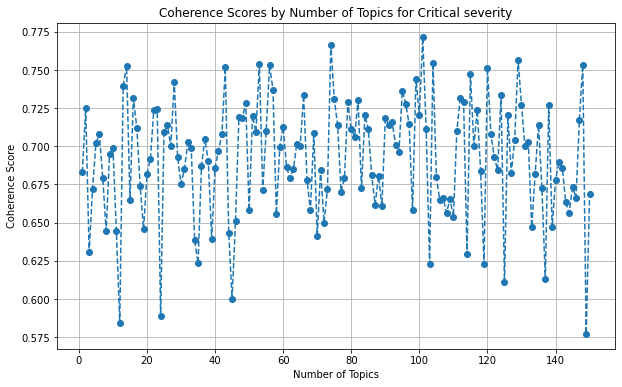

In [634]:
#sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(crit_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, crit_coherence_values, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics for Critical severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

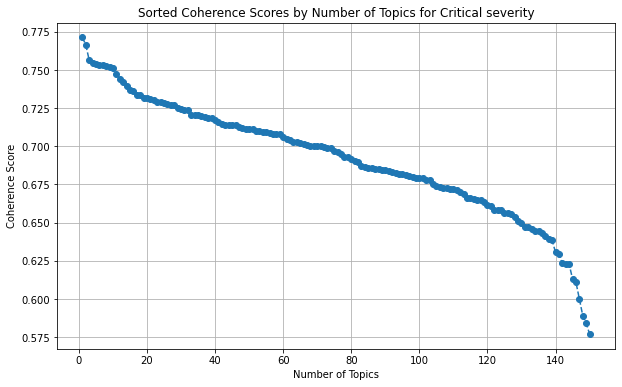

In [635]:
crit_sorted_coherence_values = sorted(crit_coherence_values, reverse=True)

topics_range = range(1, len(crit_sorted_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, crit_sorted_coherence_values, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics for Critical severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [827]:
df_topic_sents_keywords = format_topics_sentences(ldamodel = crit_model_desc, corpus = crit_corpus_dec, texts = crtical["clean_desc"].tolist())

In [637]:
df_topic_sents_keywords

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.10,"earlier, application, docker, system, tibco, s...",mruby vulnerable heapbased buffer overflow
1,0,0.10,"earlier, application, docker, system, tibco, s...",uppy vulnerable serverside request forgery ssrf
2,0,0.10,"earlier, application, docker, system, tibco, s...",inappropriate implementation devtools google c...
3,0,0.10,"earlier, application, docker, system, tibco, s...",use free github repository radareorgradare2 pr...
4,0,0.10,"earlier, application, docker, system, tibco, s...",visual form builder wordpress plugin 308 vulne...
...,...,...,...,...
11200,0,0.10,"earlier, application, docker, system, tibco, s...",urllib python 2x 2716 supports localfile schem...
11201,2,0.55,"security, cloud, fixed, gateway, storage, pack...",western digital cloud cloud mirror gen2 cloud ...
11202,2,0.55,"security, cloud, fixed, gateway, storage, pack...",western digital cloud cloud mirror gen2 cloud ...
11203,0,0.10,"earlier, application, docker, system, tibco, s...",downloadzip function applicationcontrollersadm...


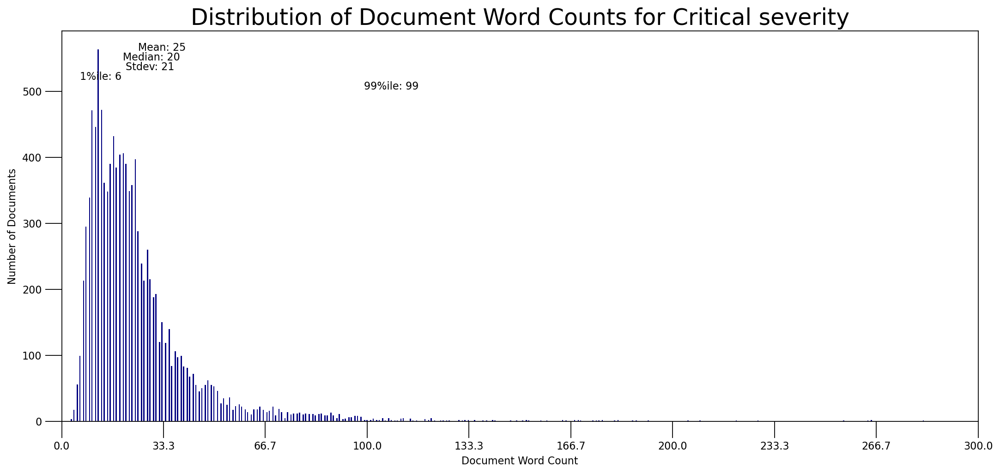

In [638]:
doc_lens = [len(d.split()) for d in df_topic_sents_keywords.Original_Text]

mean_val = round(np.mean(doc_lens))
median_val = round(np.median(doc_lens))
std_val = round(np.std(doc_lens))
quantile_01_val = round(np.quantile(doc_lens, q = 0.01))
quantile_99_val = round(np.quantile(doc_lens, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val, y_pos, "Mean: " + str(mean_val))
plt.text(median_val, y_pos - spacing, "Median: " + str(median_val))
plt.text(std_val, y_pos - 2 * spacing, "Stdev: " + str(std_val))
plt.text(quantile_01_val, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val))
plt.text(quantile_99_val, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts for Critical severity', fontdict = dict(size = 22))
plt.show()

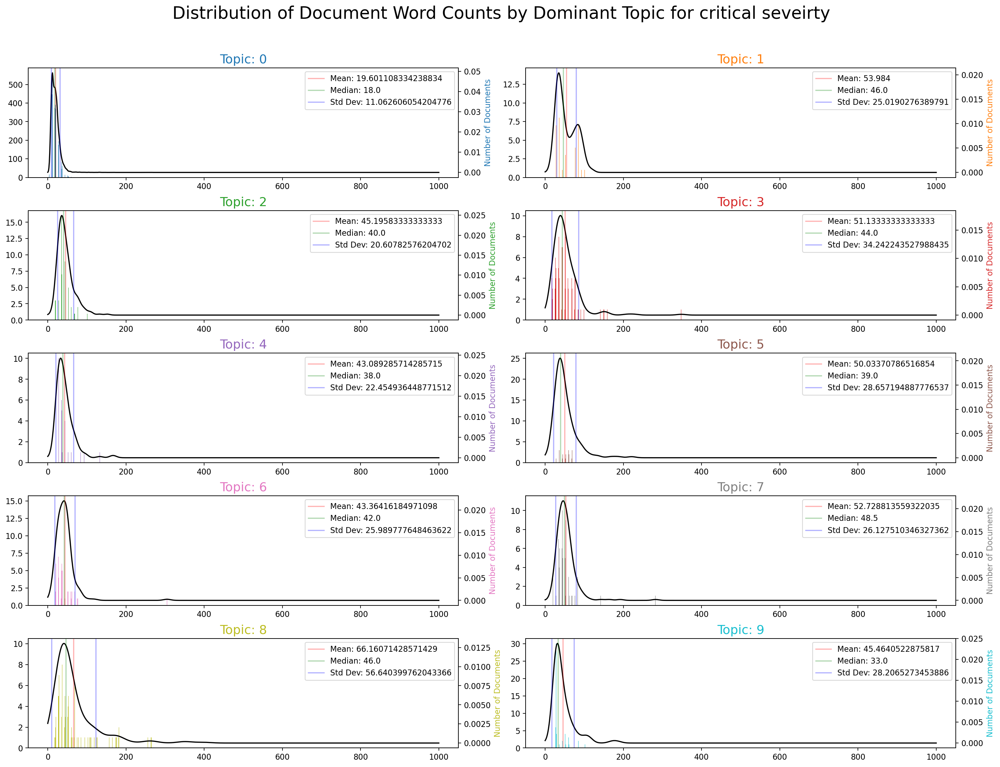

In [828]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for critical seveirty', fontsize=22)
plt.show()

In [640]:
topics = crit_model_desc.show_topics(formatted = False)
data_flat = [w for desc in crtical["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

In [641]:
df.head()

,word,topic_id,importance,word_count
0,earlier,0,0.532772,1360
1,application,0,0.035390,599
2,docker,0,0.033068,112
3,system,0,0.026373,1595
4,tibco,0,0.020390,169


<ipython-input-648-8d4ef34e94ae>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')


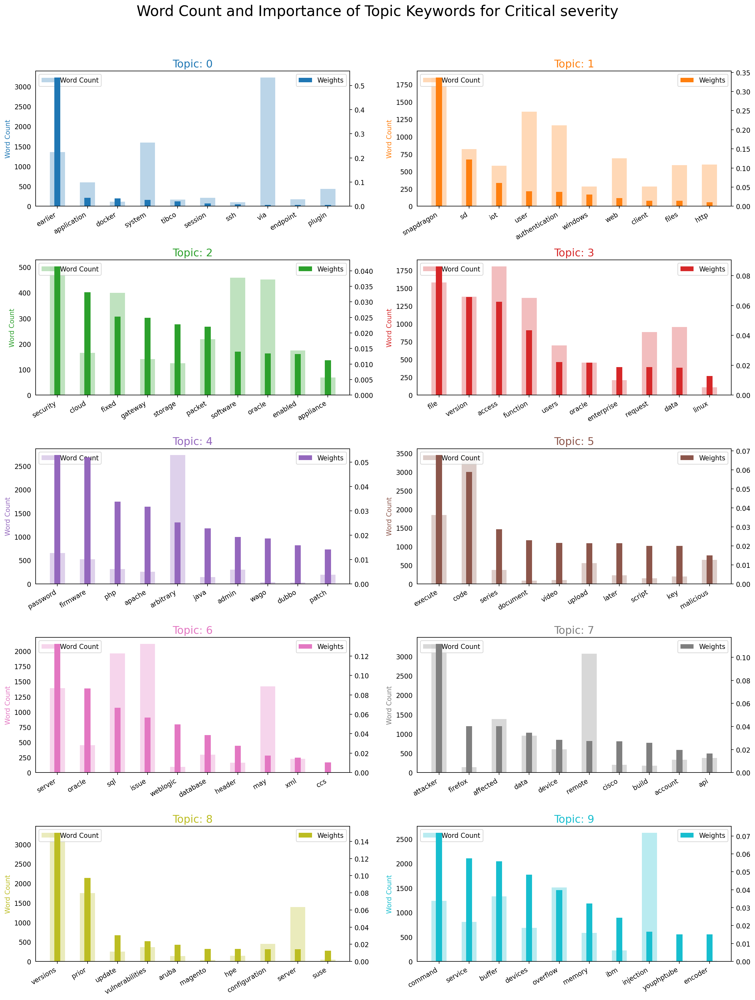

In [648]:
fig, axes = plt.subplots(5, 2, figsize = (16,20),dpi=160) 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

for i, ax in enumerate(axes.flatten()):
    if i >= len(topics):  #just so it doesnt go beyond
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x= 'word', height = "importance", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i])
    ax.set_title('Topic: ' + str(i), color = cols[i], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords for Critical severity', fontsize = 22, y = 1.05)    
plt.show()

In [649]:
dominant_topics, topic_percentages = topics_per_document(model = crit_model_desc, corpus = crit_corpus_dec, end = -1)

In [650]:
df_2 = pd.DataFrame(dominant_topics, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df_2.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name = 'count').reset_index()

In [651]:
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name = 'count').reset_index()

In [652]:
topic_top3words = [(i, topic) for i, topics in crit_model_desc.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns = ['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(','.join)
df_top3words.reset_index(level = 0,inplace = True)

In [653]:
df_top3words

,topic_id,words
0,0,"earlier,application,docker"
1,1,"snapdragon,sd,iot"
2,2,"security,cloud,fixed"
3,3,"file,version,access"
4,4,"password,firmware,php"
5,5,"execute,code,series"
6,6,"server,oracle,sql"
7,7,"attacker,firefox,affected"
8,8,"versions,prior,update"
9,9,"command,service,buffer"


In [834]:
topic_weights = []

for row_list in crit_model_desc[crit_corpus_dec]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights.append(weights)

In [835]:
arr = pd.DataFrame(topic_weights).fillna(0).values

#kepping only things over 0.35
arr = arr[np.amax(arr, axis = 1) > 0.35]

In [836]:
topic_num = np.argmax(arr, axis = 1) #dominant topic for each document

In [837]:
# t-SNE Model
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2028 samples in 0.008s...
[t-SNE] Computed neighbors for 2028 samples in 0.137s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2028
[t-SNE] Computed conditional probabilities for sample 2000 / 2028
[t-SNE] Computed conditional probabilities for sample 2028 / 2028
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.902309
[t-SNE] KL divergence after 1000 iterations: 0.101676


In [838]:
n_topics = 10 
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda[:, 0],
    y = tsne_lda[:, 1],
    topic = topic_num,
    color = [mycolors_hex[i] for i in topic_num]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num), high = max(topic_num))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics for critical severity".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

### High

In [659]:
high = dataframe_by_severity.get_group("HIGH")

In [660]:
hig_model_desc, hig_model_terms, hig_corpus_dec, hig_id2word_desc = LDA_gen(high["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [661]:
hig_model_terms

[(0,
  '0.074*"issue" + 0.066*"tensorflow" + 0.048*"interface" + 0.033*"remote" + 0.027*"webex" + 0.026*"information"'),
 (1,
  '0.046*"enterprise" + 0.042*"ibm" + 0.038*"session" + 0.034*"request" + 0.029*"privilege" + 0.023*"java"'),
 (2,
  '0.114*"versions" + 0.076*"system" + 0.031*"application" + 0.029*"users" + 0.025*"files" + 0.020*"simatic"'),
 (3,
  '0.107*"user" + 0.055*"code" + 0.023*"privileges" + 0.022*"email" + 0.020*"overflow" + 0.018*"api"'),
 (4,
  '0.388*"earlier" + 0.066*"oracle" + 0.056*"access" + 0.047*"data" + 0.023*"attacks" + 0.020*"management"'),
 (5,
  '0.216*"attacker" + 0.098*"device" + 0.084*"affected" + 0.049*"vulnerabilities" + 0.027*"firefox" + 0.021*"exploit"'),
 (6,
  '0.181*"prior" + 0.105*"magento" + 0.071*"versions" + 0.046*"function" + 0.029*"web" + 0.021*"series"'),
 (7,
  '0.073*"service" + 0.063*"server" + 0.039*"tibco" + 0.034*"devices" + 0.030*"update" + 0.024*"dns"'),
 (8,
  '0.306*"windows" + 0.056*"oracle" + 0.055*"vm" + 0.051*"virtualbox" +

In [753]:
log_perplexity = hig_model_desc.log_perplexity(hig_corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.433478384626545
Perplexity: 345.72434425240135


In [662]:
gensim_dict_hig = convert_to_gensim_dictionary(hig_id2word_desc)

In [663]:
hig_hdp = HdpModel(hig_corpus_dec, gensim_dict_hig)

In [664]:
hig_all_topics = hig_hdp.get_topics()
hig_num_of_topics = hig_all_topics.shape[0]
print(f"Total number of topics: {hig_num_of_topics}")


Total number of topics: 150


In [665]:
for topic_info in hig_hdp.print_topics(num_topics = 15, num_words = 5):
    print(topic_info)

(0, '0.003*headers + 0.003*raw + 0.002*pxc + 0.002*multiple + 0.002*single')
(1, '0.003*data + 0.003*one + 0.003*private + 0.003*fluentd + 0.003*solidusauthdevise')
(2, '0.003*electric + 0.002*xor + 0.002*artifacts + 0.002*container + 0.002*gpu')
(3, '0.002*collaborative + 0.002*trust + 0.002*cisco + 0.002*scale + 0.002*complex')
(4, '0.003*world + 0.003*introduced + 0.002*registered + 0.002*omniauthapple + 0.002*symbol')
(5, '0.003*imageassist + 0.003*ii + 0.003*modauthopenidc + 0.002*poolupgrade + 0.002*traversal')
(6, '0.003*site + 0.003*book + 0.002*another + 0.002*kit + 0.002*crossreference')
(7, '0.003*geotools + 0.002*otrs + 0.002*array + 0.002*update + 0.002*kctf')
(8, '0.003*transport + 0.002*inc + 0.002*specify + 0.002*lake + 0.002*write')
(9, '0.003*uri + 0.003*aim + 0.003*sanity + 0.002*coupler + 0.002*graylog')
(10, '0.003*energy + 0.003*vsrx + 0.003*strategy + 0.002*apisnapshotskey + 0.002*sbc')
(11, '0.003*documentdomain + 0.002*aurelia + 0.002*actions + 0.002*configset 

In [666]:
hig_texts = high['clean_desc'].apply(lambda x: x.split()).tolist()

In [667]:
hig_coherence_model_hdp = CoherenceModel(model = hig_hdp, texts = hig_texts, dictionary = gensim_dict_hig, coherence = 'c_v')
hig_coherence_hdp = hig_coherence_model_hdp.get_coherence()

In [668]:
print('Coherence Score:', hig_coherence_hdp)

Coherence Score: 0.6722375550887734


In [669]:
hig_coherence_values = compute_coherence_for_each_topic(hig_hdp, hig_texts, gensim_dict_hig)

hig_top_topics = sorted(range(len(hig_coherence_values)), key = lambda i: hig_coherence_values[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores:")
for idx in hig_top_topics:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, hig_coherence_values[idx]))

Top 10 Topics based on Coherence Scores:
Topic 75: Coherence Score: 0.7623
Topic 84: Coherence Score: 0.7572
Topic 29: Coherence Score: 0.7507
Topic 43: Coherence Score: 0.7461
Topic 126: Coherence Score: 0.7451
Topic 55: Coherence Score: 0.7435
Topic 14: Coherence Score: 0.7376
Topic 10: Coherence Score: 0.7368
Topic 130: Coherence Score: 0.7343
Topic 69: Coherence Score: 0.7333


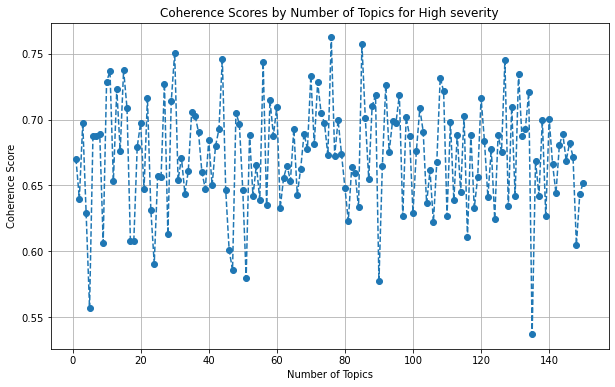

In [670]:
#sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(hig_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, hig_coherence_values, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics for High severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

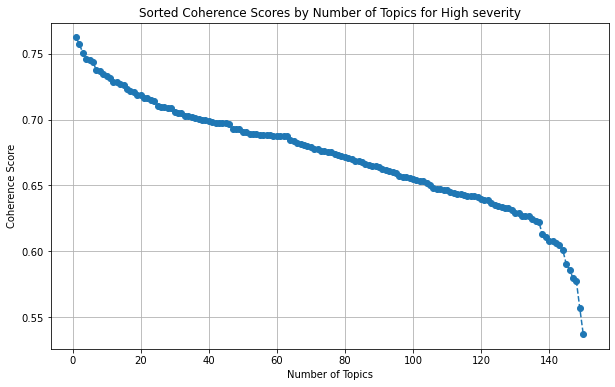

In [671]:
hig_sorted_coherence_values = sorted(hig_coherence_values, reverse=True)

topics_range = range(1, len(hig_sorted_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, hig_sorted_coherence_values, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics for High severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [829]:
df_topic_sents_keywords = format_topics_sentences(ldamodel = hig_model_desc, corpus = hig_corpus_dec, texts = high["clean_desc"].tolist())

In [673]:
df_topic_sents_keywords

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,1,0.6038,"enterprise, ibm, session, request, privilege, ...",improper link resolution file access exists pa...
1,1,0.6038,"enterprise, ibm, session, request, privilege, ...",untrusted search path exists palo alto network...
2,1,0.6703,"enterprise, ibm, session, request, privilege, ...",local privilege escalation pe exists palo alto...
3,9,0.6242,"snapdragon, file, app, sd, version, preinstall...",improper handling exceptional conditions exist...
4,9,0.5573,"snapdragon, file, app, sd, version, preinstall...",improper link resolution file access link foll...
...,...,...,...,...
31083,0,0.1000,"issue, tensorflow, interface, remote, webex, i...",phonesystem terminal 3cx phone system debian b...
31084,0,0.1000,"issue, tensorflow, interface, remote, webex, i...",phonesystem terminal 3cx phone system debian b...
31085,3,0.5500,"user, code, privileges, email, overflow, api, ...",dasan h660rm devices firmware 1030022 use hard...
31086,0,0.1000,"issue, tensorflow, interface, remote, webex, i...",boa server configuration dasan h660rm devices ...


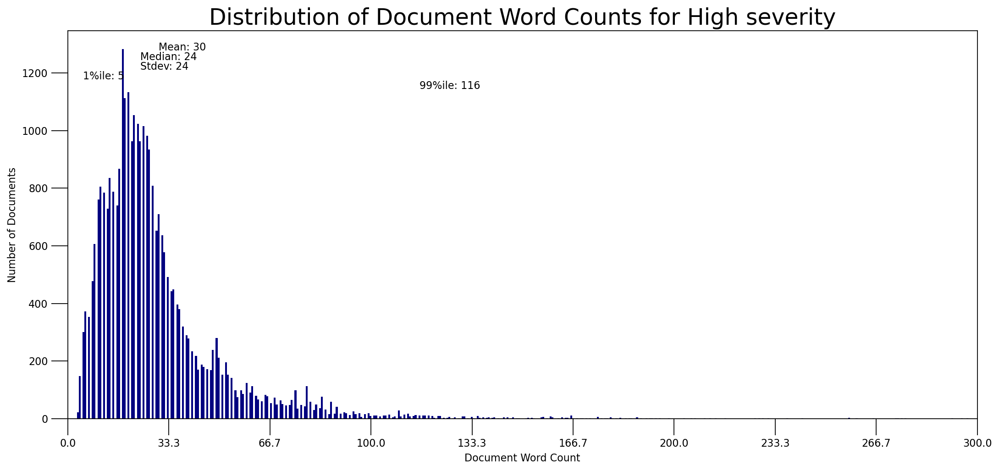

In [674]:
doc_lens = [len(d.split()) for d in df_topic_sents_keywords.Original_Text]

mean_val = round(np.mean(doc_lens))
median_val = round(np.median(doc_lens))
std_val = round(np.std(doc_lens))
quantile_01_val = round(np.quantile(doc_lens, q = 0.01))
quantile_99_val = round(np.quantile(doc_lens, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val, y_pos, "Mean: " + str(mean_val))
plt.text(median_val, y_pos - spacing, "Median: " + str(median_val))
plt.text(std_val, y_pos - 2 * spacing, "Stdev: " + str(std_val))
plt.text(quantile_01_val, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val))
plt.text(quantile_99_val, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts for High severity', fontdict = dict(size = 22))
plt.show()

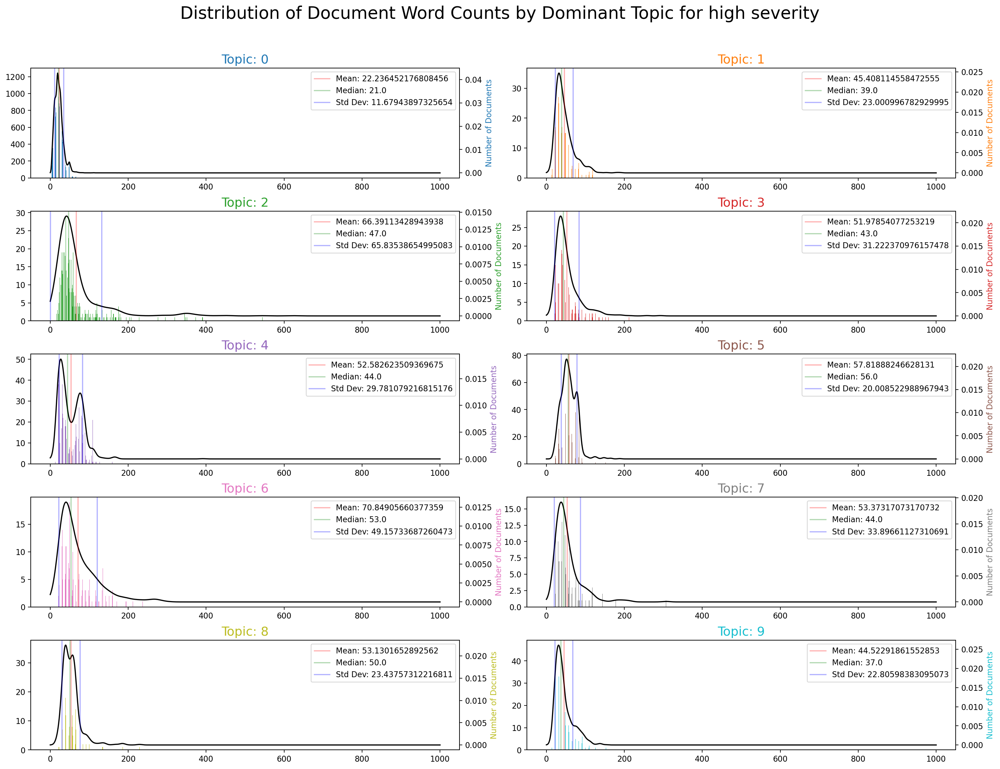

In [830]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for high severity', fontsize=22)
plt.show()

In [676]:
topics = hig_model_desc.show_topics(formatted = False)
data_flat = [w for desc in high["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

In [677]:
df.head()

,word,topic_id,importance,word_count
0,issue,0,0.074288,7202
1,tensorflow,0,0.066175,1051
2,interface,0,0.047985,1369
3,remote,0,0.033481,7418
4,webex,0,0.026800,133


<ipython-input-679-3eb2e40b7108>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')


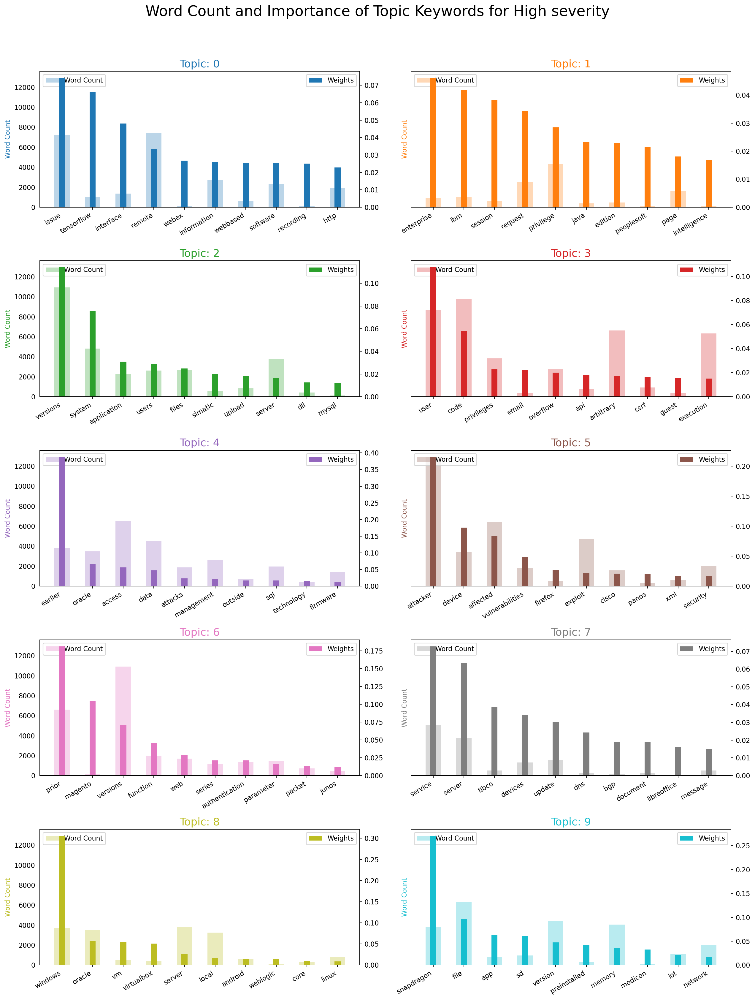

In [679]:
fig, axes = plt.subplots(5, 2, figsize = (16,20), sharey=True, dpi=160) 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

for i, ax in enumerate(axes.flatten()):
    if i >= len(topics):  #just so it doesnt go beyond
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x= 'word', height = "importance", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i])
    ax.set_title('Topic: ' + str(i), color = cols[i], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords for High severity', fontsize = 22, y = 1.05)    
plt.show()

In [680]:
dominant_topics, topic_percentages = topics_per_document(model = hig_model_desc, corpus = hig_corpus_dec, end = -1)

In [681]:
df_2 = pd.DataFrame(dominant_topics, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df_2.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name = 'count').reset_index()

In [682]:
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name = 'count').reset_index()

In [683]:
topic_top3words = [(i, topic) for i, topics in hig_model_desc.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns = ['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(','.join)
df_top3words.reset_index(level = 0,inplace = True)

In [684]:
df_top3words

,topic_id,words
0,0,"issue,tensorflow,interface"
1,1,"enterprise,ibm,session"
2,2,"versions,system,application"
3,3,"user,code,privileges"
4,4,"earlier,oracle,access"
5,5,"attacker,device,affected"
6,6,"prior,magento,versions"
7,7,"service,server,tibco"
8,8,"windows,oracle,vm"
9,9,"snapdragon,file,app"


In [839]:
topic_weights = []

for row_list in hig_model_desc[hig_corpus_dec]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights.append(weights)

In [840]:
arr = pd.DataFrame(topic_weights).fillna(0).values

#kepping only things over 0.35
arr = arr[np.amax(arr, axis = 1) > 0.35]

In [841]:
topic_num = np.argmax(arr, axis = 1) #dominant topic for each document

In [842]:
# t-SNE Model
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6615 samples in 0.016s...
[t-SNE] Computed neighbors for 6615 samples in 0.624s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6615
[t-SNE] Computed conditional probabilities for sample 2000 / 6615
[t-SNE] Computed conditional probabilities for sample 3000 / 6615
[t-SNE] Computed conditional probabilities for sample 4000 / 6615
[t-SNE] Computed conditional probabilities for sample 5000 / 6615
[t-SNE] Computed conditional probabilities for sample 6000 / 6615
[t-SNE] Computed conditional probabilities for sample 6615 / 6615
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.054401
[t-SNE] KL divergence after 1000 iterations: 0.245814


In [843]:
n_topics = 10 
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda[:, 0],
    y = tsne_lda[:, 1],
    topic = topic_num,
    color = [mycolors_hex[i] for i in topic_num]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num), high = max(topic_num))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics for high severity".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

### Low

In [690]:
low = dataframe_by_severity.get_group("LOW")

In [691]:
low_model_desc, low_model_terms, low_corpus_dec, low_id2word_desc = LDA_gen(low["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [692]:
low_model_terms

[(0,
  '0.118*"imagemagick" + 0.024*"shell" + 0.019*"device" + 0.016*"peoplesoft" + 0.016*"directory" + 0.015*"attacker"'),
 (1,
  '0.083*"access" + 0.046*"jenkins" + 0.029*"hyperion" + 0.027*"users" + 0.017*"financial" + 0.012*"evolution"'),
 (2,
  '0.155*"oracle" + 0.122*"earlier" + 0.058*"vm" + 0.050*"virtualbox" + 0.047*"solaris" + 0.034*"enterprise"'),
 (3,
  '0.120*"prior" + 0.109*"cluster" + 0.100*"mysql" + 0.042*"version" + 0.028*"panos" + 0.018*"suse"'),
 (4,
  '0.211*"server" + 0.189*"mysql" + 0.049*"user" + 0.017*"nextcloud" + 0.012*"address" + 0.012*"bar"'),
 (5,
  '0.129*"information" + 0.066*"ibm" + 0.036*"session" + 0.027*"group" + 0.022*"webex" + 0.019*"file"'),
 (6,
  '0.145*"issue" + 0.141*"versions" + 0.030*"starting" + 0.030*"visualization" + 0.030*"teamcenter" + 0.018*"kernel"'),
 (7,
  '0.271*"app" + 0.044*"nextcloud" + 0.031*"android" + 0.020*"user" + 0.019*"disclosure" + 0.016*"authentication"'),
 (8,
  '0.234*"java" + 0.145*"se" + 0.046*"embedded" + 0.030*"core

In [754]:
log_perplexity = low_model_desc.log_perplexity(low_corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -6.7540782056179305
Perplexity: 107.93943313460382


In [693]:
gensim_dict_low = convert_to_gensim_dictionary(low_id2word_desc)

In [694]:
low_hdp = HdpModel(low_corpus_dec, gensim_dict_low)

In [695]:
low_all_topics = low_hdp.get_topics()
low_num_of_topics = low_all_topics.shape[0]
print(f"Total number of topics: {low_num_of_topics}")

Total number of topics: 150


In [696]:
for topic_info in low_hdp.print_topics(num_topics = 15, num_words = 5):
    print(topic_info)

(0, '0.020*rekor + 0.015*vulnerable + 0.011*homeserver + 0.010*metadata + 0.010*request')
(1, '0.014*ifilter + 0.013*okta + 0.012*using + 0.011*point + 0.010*port')
(2, '0.014*users + 0.013*file + 0.013*recording + 0.012*within + 0.012*app')
(3, '0.016*url + 0.014*hyperion + 0.011*adf + 0.011*files + 0.011*backend')
(4, '0.015*octokit + 0.015*secret + 0.015*sound + 0.013*compliance + 0.012*crime')
(5, '0.016*greater + 0.015*role + 0.012*hashed + 0.011*systems + 0.011*chunks')
(6, '0.015*eccube + 0.014*imagemagick + 0.014*app + 0.012*manager + 0.011*java')
(7, '0.015*old + 0.014*pro + 0.012*apport + 0.011*vaadin + 0.010*usb')
(8, '0.013*system + 0.013*recording + 0.012*process + 0.012*eappwd + 0.011*nextcloud')
(9, '0.020*message + 0.018*business + 0.012*opensuse + 0.011*red + 0.011*read')
(10, '0.017*cups + 0.016*regular + 0.015*devices + 0.014*private + 0.014*content')
(11, '0.017*plugin + 0.012*port + 0.012*verified + 0.012*patch + 0.011*inventory')
(12, '0.024*load + 0.021*users + 0

In [697]:
low_texts = low['clean_desc'].apply(lambda x: x.split()).tolist()

In [698]:
low_coherence_model_hdp = CoherenceModel(model = low_hdp, texts = low_texts, dictionary = gensim_dict_low, coherence = 'c_v')
low_coherence_hdp = low_coherence_model_hdp.get_coherence()

In [699]:
print('Coherence Score:', low_coherence_hdp)

Coherence Score: 0.6964467672946525


In [700]:
low_coherence_values = compute_coherence_for_each_topic(low_hdp, low_texts, gensim_dict_low)

low_top_topics = sorted(range(len(low_coherence_values)), key = lambda i: low_coherence_values[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores:")
for idx in low_top_topics:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, low_coherence_values[idx]))

Top 10 Topics based on Coherence Scores:
Topic 77: Coherence Score: 0.7868
Topic 130: Coherence Score: 0.7780
Topic 96: Coherence Score: 0.7759
Topic 128: Coherence Score: 0.7748
Topic 75: Coherence Score: 0.7650
Topic 29: Coherence Score: 0.7602
Topic 4: Coherence Score: 0.7595
Topic 48: Coherence Score: 0.7587
Topic 64: Coherence Score: 0.7556
Topic 38: Coherence Score: 0.7549


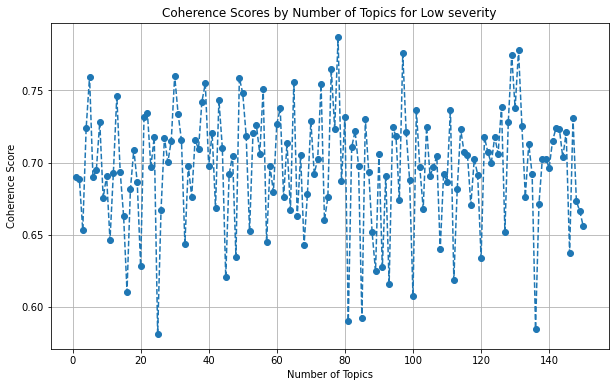

In [701]:
#sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(low_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, low_coherence_values, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics for Low severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

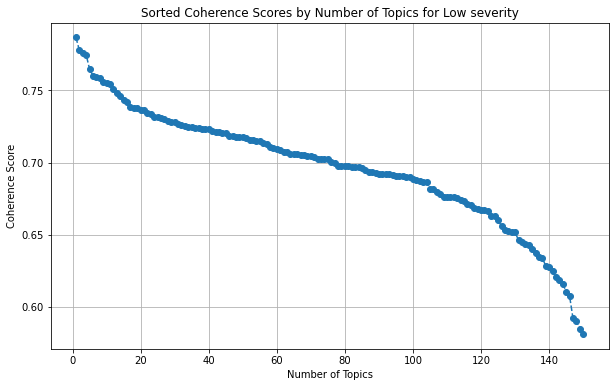

In [702]:
low_sorted_coherence_values = sorted(low_coherence_values, reverse=True)

topics_range = range(1, len(low_sorted_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, low_sorted_coherence_values, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics for Low severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [831]:
df_topic_sents_keywords = format_topics_sentences(ldamodel = low_model_desc, corpus = low_corpus_dec, texts = low["clean_desc"].tolist())

In [704]:
df_topic_sents_keywords

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",sensitive information accessible physical prob...
1,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",jimoty app android versions prior 3742 uses ha...
2,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",vim vulnerable heapbased buffer overflow
3,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",anycomment wordpress plugin 0218 affected race...
4,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",improper input validation goattestation 033 al...
...,...,...,...,...
1547,9,0.7202,"data, file, database, vault, attacker, protect...",implementations eappwd hostapd wpasupplicant v...
1548,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",web interface vertiv avocent umg4000 version 4...
1549,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",norton password manager prior 6302082 may susc...
1550,0,0.1000,"imagemagick, shell, device, peoplesoft, direct...",vanilla 264 flaw exists within getsingleindex ...


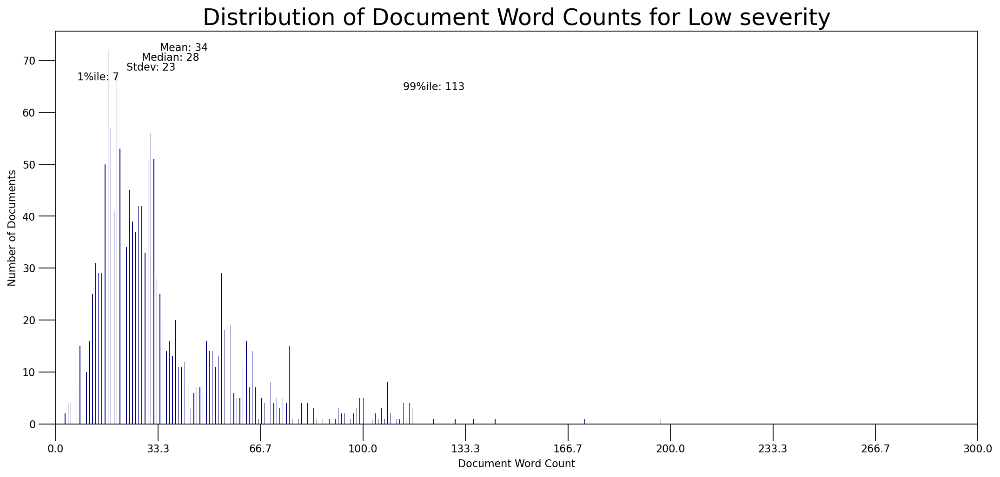

In [705]:
doc_lens = [len(d.split()) for d in df_topic_sents_keywords.Original_Text]

mean_val = round(np.mean(doc_lens))
median_val = round(np.median(doc_lens))
std_val = round(np.std(doc_lens))
quantile_01_val = round(np.quantile(doc_lens, q = 0.01))
quantile_99_val = round(np.quantile(doc_lens, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val, y_pos, "Mean: " + str(mean_val))
plt.text(median_val, y_pos - spacing, "Median: " + str(median_val))
plt.text(std_val, y_pos - 2 * spacing, "Stdev: " + str(std_val))
plt.text(quantile_01_val, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val))
plt.text(quantile_99_val, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts for Low severity', fontdict = dict(size = 22))
plt.show()

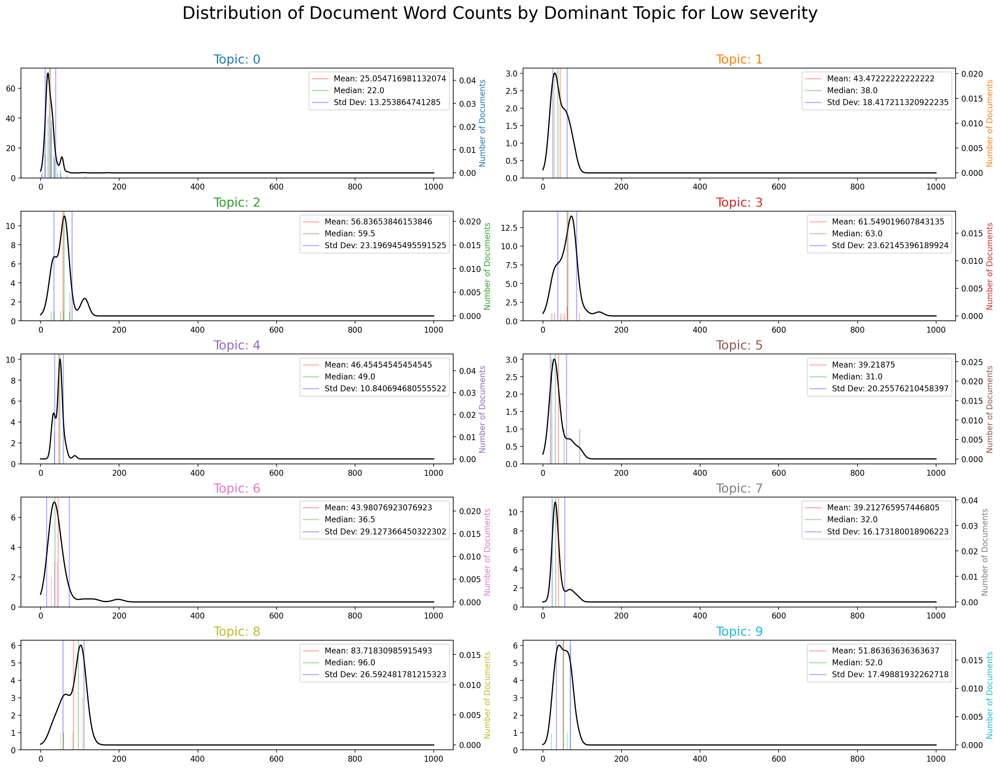

In [832]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for Low severity', fontsize=22)
plt.show()

In [707]:
topics = low_model_desc.show_topics(formatted = False)
data_flat = [w for desc in low["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

In [708]:
df.head()

,word,topic_id,importance,word_count
0,imagemagick,0,0.118411,55
1,shell,0,0.023587,17
2,device,0,0.018603,162
3,peoplesoft,0,0.016273,16
4,directory,0,0.015585,54


<ipython-input-709-b7f41b17c445>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')


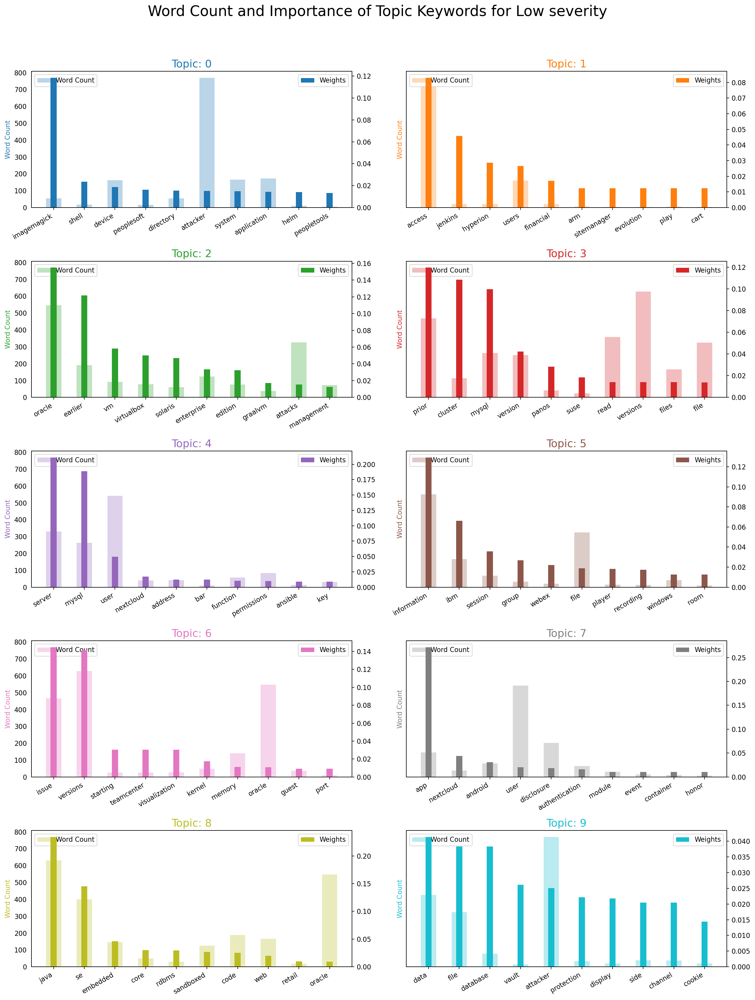

In [709]:
fig, axes = plt.subplots(5, 2, figsize = (16,20), sharey=True, dpi=160) 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

for i, ax in enumerate(axes.flatten()):
    if i >= len(topics):  #just so it doesnt go beyond
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x= 'word', height = "importance", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i])
    ax.set_title('Topic: ' + str(i), color = cols[i], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords for Low severity', fontsize = 22, y = 1.05)    
plt.show()

In [710]:
dominant_topics, topic_percentages = topics_per_document(model = low_model_desc, corpus = low_corpus_dec, end = -1)

In [711]:
df_2 = pd.DataFrame(dominant_topics, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df_2.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name = 'count').reset_index()

In [712]:
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name = 'count').reset_index()

In [713]:
topic_top3words = [(i, topic) for i, topics in low_model_desc.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns = ['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(','.join)
df_top3words.reset_index(level = 0,inplace = True)

In [714]:
df_top3words

,topic_id,words
0,0,"imagemagick,shell,device"
1,1,"access,jenkins,hyperion"
2,2,"oracle,earlier,vm"
3,3,"prior,cluster,mysql"
4,4,"server,mysql,user"
5,5,"information,ibm,session"
6,6,"issue,versions,starting"
7,7,"app,nextcloud,android"
8,8,"java,se,embedded"
9,9,"data,file,database"


In [844]:
topic_weights = []

for row_list in low_model_desc[low_corpus_dec]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights.append(weights)

In [845]:
arr = pd.DataFrame(topic_weights).fillna(0).values

#kepping only things over 0.35
arr = arr[np.amax(arr, axis = 1) > 0.35]

In [846]:
topic_num = np.argmax(arr, axis = 1) #dominant topic for each document

In [847]:
# t-SNE Model
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 524 samples in 0.008s...
[t-SNE] Computed neighbors for 524 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 524 / 524
[t-SNE] Mean sigma: 0.000039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 38.193596
[t-SNE] KL divergence after 1000 iterations: -0.020547


In [848]:
n_topics = 10 
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda[:, 0],
    y = tsne_lda[:, 1],
    topic = topic_num,
    color = [mycolors_hex[i] for i in topic_num]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num), high = max(topic_num))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics for low severity".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

#### Medium

In [720]:
med = dataframe_by_severity.get_group("MEDIUM")

In [721]:
med_model_desc, med_model_terms, med_corpus_dec, med_id2word_desc = LDA_gen(med["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [722]:
med_model_terms

[(0,
  '0.069*"oracle" + 0.066*"access" + 0.058*"file" + 0.058*"snapdragon" + 0.037*"tibco" + 0.028*"attacks"'),
 (1,
  '0.086*"image" + 0.084*"email" + 0.049*"parameter" + 0.048*"service" + 0.043*"sd" + 0.028*"cisco"'),
 (2,
  '0.219*"attacker" + 0.078*"interface" + 0.070*"affected" + 0.065*"device" + 0.051*"information" + 0.034*"exploit"'),
 (3,
  '0.253*"server" + 0.240*"mysql" + 0.040*"android" + 0.034*"memory" + 0.024*"url" + 0.021*"firefox"'),
 (4,
  '0.117*"prior" + 0.102*"versions" + 0.092*"issue" + 0.054*"app" + 0.052*"magento" + 0.026*"otrs"'),
 (5,
  '0.086*"oracle" + 0.065*"user" + 0.056*"sharepoint" + 0.045*"vm" + 0.043*"virtualbox" + 0.038*"web"'),
 (6,
  '0.222*"earlier" + 0.048*"tensorflow" + 0.047*"java" + 0.027*"se" + 0.023*"solaris" + 0.023*"oracle"'),
 (7,
  '0.114*"version" + 0.064*"security" + 0.060*"peoplesoft" + 0.046*"enterprise" + 0.039*"peopletools" + 0.028*"password"'),
 (8,
  '0.139*"windows" + 0.131*"ibm" + 0.053*"application" + 0.030*"update" + 0.027*"jen

In [755]:
log_perplexity = med_model_desc.log_perplexity(med_corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.322703708252977
Perplexity: 320.1720828025616


In [723]:
gensim_dict_med = convert_to_gensim_dictionary(med_id2word_desc)

In [724]:
med_hdp = HdpModel(med_corpus_dec, gensim_dict_med)

In [725]:
med_all_topics = med_hdp.get_topics()
med_num_of_topics = med_all_topics.shape[0]
print(f"Total number of topics: {med_num_of_topics}")

Total number of topics: 150


In [726]:
for topic_info in med_hdp.print_topics(num_topics = 15, num_words = 5):
    print(topic_info)

(0, '0.003*opensearch + 0.003*additional + 0.003*agent + 0.003*bridge + 0.002*pydio')
(1, '0.003*guardian + 0.003*qtiworks + 0.003*redirects + 0.002*menu + 0.002*brizy')
(2, '0.003*bvms + 0.002*inform + 0.002*jace + 0.002*tip + 0.002*unplugged')
(3, '0.003*nvrs + 0.003*column + 0.003*inputstream + 0.002*bookkeeper + 0.002*apk')
(4, '0.004*incorrect + 0.003*sharpcompress + 0.003*ucs + 0.002*tuleap + 0.002*music')
(5, '0.004*framework + 0.003*mobilehmi + 0.003*juniper + 0.003*ckeditor + 0.002*pay')
(6, '0.004*airpods + 0.003*lamps + 0.003*asterisk + 0.003*webassembly + 0.002*mit')
(7, '0.003*clinic + 0.002*ls + 0.002*exif + 0.002*column + 0.002*two')
(8, '0.004*filename + 0.003*bundles + 0.003*traefik + 0.002*telegram + 0.002*analyzer')
(9, '0.003*mode + 0.003*terminal + 0.002*layer + 0.002*heap + 0.002*keys')
(10, '0.003*aos + 0.003*hpe + 0.003*usb + 0.003*multiservice + 0.002*ootbi')
(11, '0.003*rpki + 0.002*dependencies + 0.002*eium + 0.002*three + 0.002*productsgenericsetup')
(12, '0

In [727]:
med_texts = med['clean_desc'].apply(lambda x: x.split()).tolist()

In [728]:
med_coherence_model_hdp = CoherenceModel(model = med_hdp, texts = med_texts, dictionary = gensim_dict_med, coherence = 'c_v')
med_coherence_hdp = med_coherence_model_hdp.get_coherence()

In [729]:
print('Coherence Score:', med_coherence_hdp)

Coherence Score: 0.6768137707315712


In [730]:
med_coherence_values = compute_coherence_for_each_topic(med_hdp, med_texts, gensim_dict_med)

med_top_topics = sorted(range(len(med_coherence_values)), key = lambda i: med_coherence_values[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores:")
for idx in med_top_topics:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, med_coherence_values[idx]))

Top 10 Topics based on Coherence Scores:
Topic 81: Coherence Score: 0.7430
Topic 68: Coherence Score: 0.7415
Topic 60: Coherence Score: 0.7392
Topic 107: Coherence Score: 0.7378
Topic 18: Coherence Score: 0.7369
Topic 6: Coherence Score: 0.7369
Topic 10: Coherence Score: 0.7344
Topic 100: Coherence Score: 0.7310
Topic 55: Coherence Score: 0.7303
Topic 54: Coherence Score: 0.7294


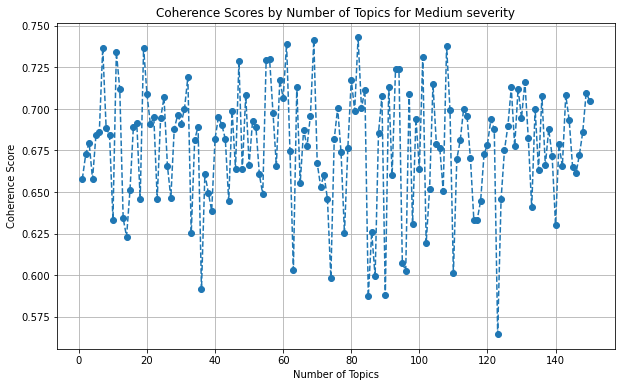

In [731]:
#sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(med_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, med_coherence_values, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics for Medium severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

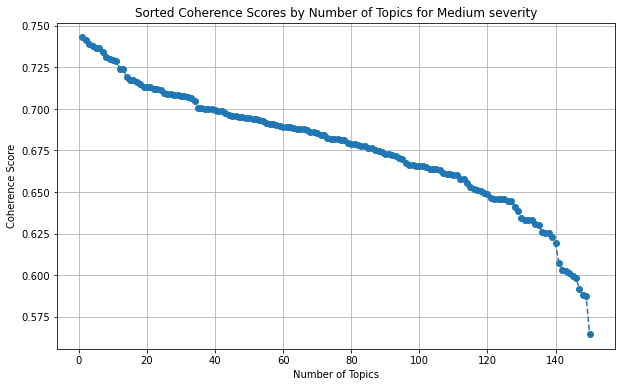

In [732]:
med_sorted_coherence_values = sorted(med_coherence_values, reverse=True)

topics_range = range(1, len(med_sorted_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, med_sorted_coherence_values, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics for Medium severity')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [817]:
df_topic_sents_keywords = format_topics_sentences(ldamodel = med_model_desc, corpus = med_corpus_dec, texts = med["clean_desc"].tolist())

In [734]:
df_topic_sents_keywords

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"oracle, access, file, snapdragon, tibco, attac...",nontransparent sharing branch predictor select...
1,0,0.1000,"oracle, access, file, snapdragon, tibco, attac...",nontransparent sharing branch predictor within...
2,0,0.5500,"oracle, access, file, snapdragon, tibco, attac...",hardware debug modes processor init setting al...
3,0,0.4925,"oracle, access, file, snapdragon, tibco, attac...",panos software provides options exclude specif...
4,8,0.6001,"windows, ibm, application, update, jenkins, pa...",file information exposure exists palo alto net...
...,...,...,...,...
30415,4,0.4436,"prior, versions, issue, app, magento, otrs, xs...",stored xss within quadbase espressreport es er...
30416,0,0.1000,"oracle, access, file, snapdragon, tibco, attac...",jpxstreaminit function poppler 0780 earlier do...
30417,0,0.1000,"oracle, access, file, snapdragon, tibco, attac...",crosssite scripting xss ressource view coremod...
30418,0,0.1000,"oracle, access, file, snapdragon, tibco, attac...",open whisper signal aka signaldesktop 1231 sig...


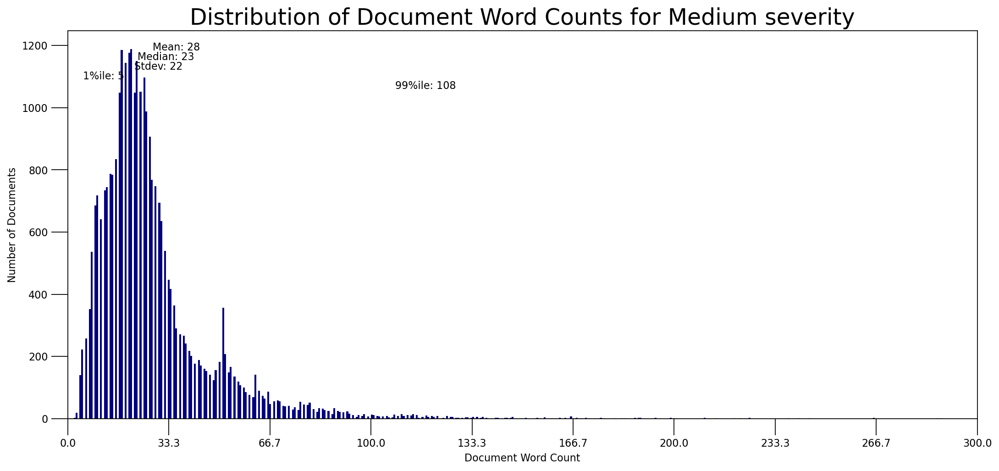

In [735]:
doc_lens = [len(d.split()) for d in df_topic_sents_keywords.Original_Text]

mean_val = round(np.mean(doc_lens))
median_val = round(np.median(doc_lens))
std_val = round(np.std(doc_lens))
quantile_01_val = round(np.quantile(doc_lens, q = 0.01))
quantile_99_val = round(np.quantile(doc_lens, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val, y_pos, "Mean: " + str(mean_val))
plt.text(median_val, y_pos - spacing, "Median: " + str(median_val))
plt.text(std_val, y_pos - 2 * spacing, "Stdev: " + str(std_val))
plt.text(quantile_01_val, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val))
plt.text(quantile_99_val, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts for Medium severity', fontdict = dict(size = 22))
plt.show()

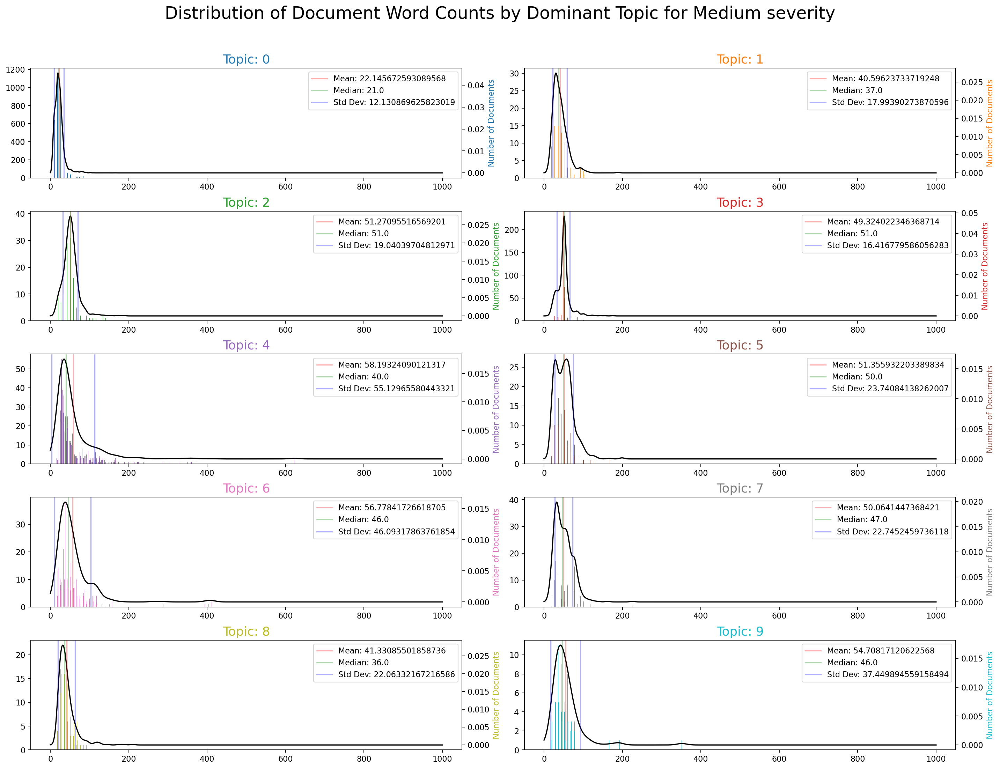

In [818]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for Medium severity', fontsize=22)
plt.show()

In [737]:
topics = med_model_desc.show_topics(formatted = False)
data_flat = [w for desc in med["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

In [738]:
df.head()

,word,topic_id,importance,word_count
0,oracle,0,0.069338,3953
1,access,0,0.065543,7435
2,file,0,0.058142,4122
3,snapdragon,0,0.057718,923
4,tibco,0,0.036565,287


<ipython-input-739-ff460f316dfc>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')


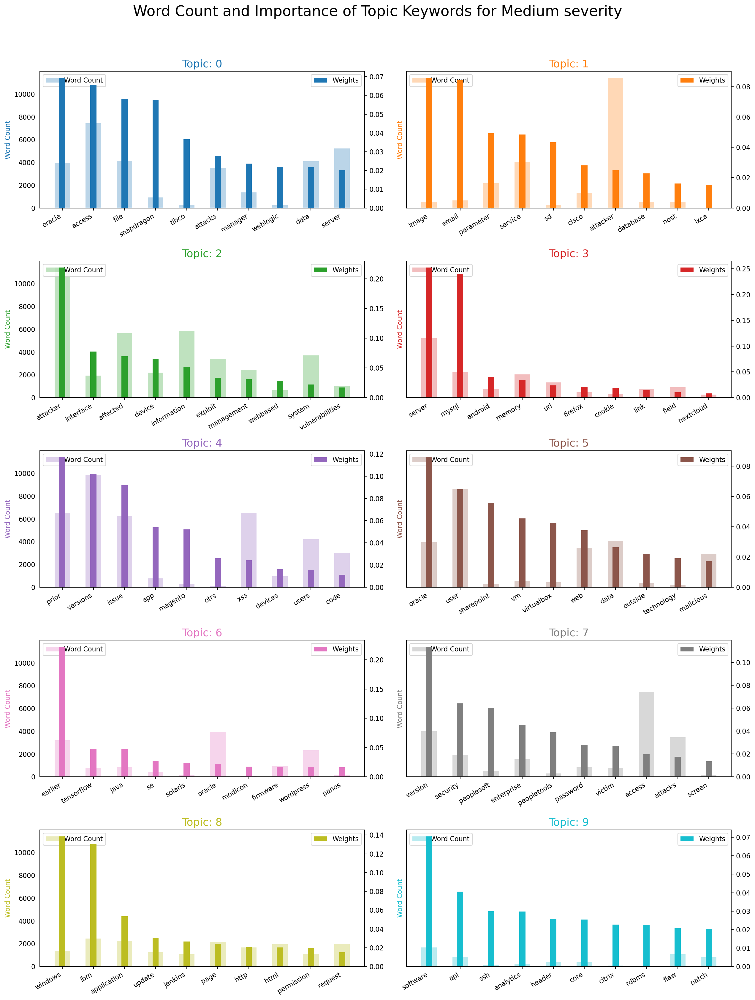

In [739]:
fig, axes = plt.subplots(5,2, figsize = (16,20), sharey=True, dpi=160) 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

for i, ax in enumerate(axes.flatten()):
    if i >= len(topics):  #just so it doesnt go beyond
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x= 'word', height = "importance", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i])
    ax.set_title('Topic: ' + str(i), color = cols[i], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords for Medium severity', fontsize = 22, y = 1.05)    
plt.show()

In [740]:
dominant_topics, topic_percentages = topics_per_document(model = med_model_desc, corpus = med_corpus_dec, end = -1)

In [741]:
df_2 = pd.DataFrame(dominant_topics, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df_2.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name = 'count').reset_index()

In [742]:
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name = 'count').reset_index()

In [743]:
topic_top3words = [(i, topic) for i, topics in med_model_desc.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns = ['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(','.join)
df_top3words.reset_index(level = 0,inplace = True)

In [744]:
df_top3words

,topic_id,words
0,0,"oracle,access,file"
1,1,"image,email,parameter"
2,2,"attacker,interface,affected"
3,3,"server,mysql,android"
4,4,"prior,versions,issue"
5,5,"oracle,user,sharepoint"
6,6,"earlier,tensorflow,java"
7,7,"version,security,peoplesoft"
8,8,"windows,ibm,application"
9,9,"software,api,ssh"


In [849]:
topic_weights = []

for row_list in med_model_desc[med_corpus_dec]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights.append(weights)

In [850]:
arr = pd.DataFrame(topic_weights).fillna(0).values

#kepping only things over 0.35
arr = arr[np.amax(arr, axis = 1) > 0.35]

In [851]:
topic_num = np.argmax(arr, axis = 1) #dominant topic for each document

In [852]:
# t-SNE Model
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6507 samples in 0.026s...
[t-SNE] Computed neighbors for 6507 samples in 0.535s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6507
[t-SNE] Computed conditional probabilities for sample 2000 / 6507
[t-SNE] Computed conditional probabilities for sample 3000 / 6507
[t-SNE] Computed conditional probabilities for sample 4000 / 6507
[t-SNE] Computed conditional probabilities for sample 5000 / 6507
[t-SNE] Computed conditional probabilities for sample 6000 / 6507
[t-SNE] Computed conditional probabilities for sample 6507 / 6507
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.085182
[t-SNE] KL divergence after 1000 iterations: 0.254951


In [853]:
n_topics = 10 
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda[:, 0],
    y = tsne_lda[:, 1],
    topic = topic_num,
    color = [mycolors_hex[i] for i in topic_num]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num), high = max(topic_num))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics for medium severity".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)


Loading BokehJS ...

## All

In [101]:
model_desc, model_terms, corpus_dec, id2word_desc = LDA_gen(df_mega_2["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [102]:
model_terms

[(0,
  '0.074*"libreoffice" + 0.042*"outside" + 0.036*"technology" + 0.035*"tibco" + 0.029*"commands" + 0.027*"cvss"'),
 (1,
  '0.285*"windows" + 0.148*"user" + 0.045*"firmware" + 0.036*"process" + 0.029*"series" + 0.016*"patch"'),
 (2,
  '0.221*"attacker" + 0.078*"affected" + 0.071*"device" + 0.064*"firefox" + 0.050*"interface" + 0.038*"management"'),
 (3,
  '0.069*"software" + 0.068*"document" + 0.049*"sql" + 0.047*"devices" + 0.030*"command" + 0.029*"tensorflow"'),
 (4,
  '0.244*"snapdragon" + 0.102*"file" + 0.091*"sd" + 0.041*"security" + 0.041*"information" + 0.040*"otrs"'),
 (5,
  '0.136*"server" + 0.109*"prior" + 0.091*"mysql" + 0.067*"magento" + 0.066*"versions" + 0.065*"oracle"'),
 (6,
  '0.116*"app" + 0.074*"ibm" + 0.038*"preinstalled" + 0.038*"function" + 0.038*"memory" + 0.032*"parameter"'),
 (7,
  '0.169*"version" + 0.070*"web" + 0.057*"password" + 0.050*"email" + 0.020*"php" + 0.017*"executable"'),
 (8,
  '0.344*"earlier" + 0.062*"oracle" + 0.060*"access" + 0.027*"attacks

In [103]:
lda_model_desc, lda_model_terms, lda_corpus_dec, lda_gensim_dict = LDA_gen_2(df_mega_2["clean_description"], num = 10)

In [104]:
lda_model_terms

[(0,
  '0.236*"snapdragon" + 0.183*"sd" + 0.091*"data" + 0.046*"eos" + 0.042*"outside" + 0.040*"software"'),
 (1,
  '0.329*"prior" + 0.105*"user" + 0.093*"magento" + 0.070*"issue" + 0.062*"cloud" + 0.050*"series"'),
 (2,
  '0.255*"attacker" + 0.099*"affected" + 0.095*"version" + 0.084*"device" + 0.053*"interface" + 0.032*"security"'),
 (3,
  '0.366*"versions" + 0.116*"app" + 0.097*"firmware" + 0.048*"preinstalled" + 0.035*"update" + 0.026*"devices"'),
 (4,
  '0.251*"server" + 0.134*"mysql" + 0.116*"windows" + 0.037*"network" + 0.034*"scalance" + 0.026*"suse"'),
 (5,
  '0.160*"file" + 0.112*"libreoffice" + 0.037*"librelogo" + 0.036*"allow" + 0.031*"bgp" + 0.030*"command"'),
 (6,
  '0.215*"oracle" + 0.116*"access" + 0.048*"enterprise" + 0.046*"attacks" + 0.040*"management" + 0.037*"vm"'),
 (7,
  '0.158*"system" + 0.084*"parameter" + 0.068*"information" + 0.044*"webex" + 0.030*"recording" + 0.022*"including"'),
 (8,
  '0.409*"earlier" + 0.079*"java" + 0.051*"se" + 0.038*"simatic" + 0.030*

In [782]:
log_perplexity = model_desc.log_perplexity(corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.88842474630769
Perplexity: 473.8953669624615


In [751]:
log_perplexity = lda_model_desc.log_perplexity(lda_corpus_dec)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -6.096522877902999
Perplexity: 68.42837953337043


In [788]:
coherence_model_lda = CoherenceModel(model = lda_model_desc, texts = texts, dictionary = lda_gensim_dict, coherence = 'c_v')
coherence_lda = coherence_model_lda.get_coherence()

In [789]:
print('Coherence Score:', coherence_lda)

Coherence Score: 0.40784380094436135


In [793]:
topics = lda_model_desc.show_topics(formatted=False)

coherence_values_per_topic = []

for i, topic in topics:
    cm = CoherenceModel(topics=[dict(lda_model_desc.show_topic(i, topn=20))], corpus=lda_corpus_dec,texts = texts, dictionary=lda_gensim_dict, coherence='c_v')
    coherence_values_per_topic.append((i, cm.get_coherence()))

print(f'Coherence Scores per Topic: {coherence_values_per_topic}')

Coherence Scores per Topic: [(0, 0.4269478944192497), (1, 0.3926253990830812), (2, 0.4455968960509492), (3, 0.47585587792473716), (4, 0.48520480166986457), (5, 0.2998344896032811), (6, 0.3993895575654799), (7, 0.40040751405922226), (8, 0.30026442519717883), (9, 0.45231115387056925)]


In [105]:
hdp = HdpModel(lda_corpus_dec, lda_gensim_dict)

In [106]:
all_topics = hdp.get_topics()
num_of_topics = all_topics.shape[0]
print(f"Total number of topics: {num_of_topics}")

#topics = hdp.print_topics(num_topics = num_of_topics)

Total number of topics: 150


In [107]:
for topic_info in hdp.print_topics(num_topics = 15, num_words = 5):
    print(topic_info)

(0, '0.168*versions + 0.112*prior + 0.023*series + 0.018*sicam + 0.017*junos')
(1, '0.066*oracle + 0.034*access + 0.026*data + 0.022*outside + 0.020*technology')
(2, '0.069*attacker + 0.045*device + 0.039*affected + 0.033*vulnerabilities + 0.024*exploit')
(3, '0.046*java + 0.031*se + 0.022*tibco + 0.021*versions + 0.017*enterprise')
(4, '0.050*simatic + 0.039*cpu + 0.036*versions + 0.025*siplus + 0.018*pn')
(5, '0.088*earlier + 0.034*firmware + 0.024*eos + 0.020*version + 0.016*ver')
(6, '0.060*scalance + 0.026*versions + 0.017*eec + 0.015*ports + 0.008*front')
(7, '0.076*sd + 0.032*snapdragon + 0.004*iot + 0.004*file + 0.004*attacker')
(8, '0.034*oracle + 0.019*vm + 0.018*virtualbox + 0.018*java + 0.011*se')
(9, '0.043*mysql + 0.038*server + 0.012*prior + 0.009*cluster + 0.007*versions')
(10, '0.007*versions + 0.005*scalance + 0.005*server + 0.005*earlier + 0.004*management')
(11, '0.015*enterprise + 0.014*peoplesoft + 0.010*access + 0.008*peopletools + 0.008*oracle')
(12, '0.014*orac

In [108]:
texts = df_mega_2['clean_desc'].apply(lambda x: x.split()).tolist()

In [109]:
coherence_model_hdp = CoherenceModel(model = hdp, texts = texts, dictionary = lda_gensim_dict, coherence = 'c_v')
coherence_hdp = coherence_model_hdp.get_coherence()

# coherences = hdp.get_coherence_per_topic()

In [112]:
coherence_values = compute_coherence_for_each_topic(hdp, texts, lda_gensim_dict)

top_topics = sorted(range(len(coherence_values)), key = lambda i: coherence_values[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores:")
for idx in top_topics:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, coherence_values[idx]))

Top 10 Topics based on Coherence Scores:
Topic 1: Coherence Score: 0.6127
Topic 112: Coherence Score: 0.6108
Topic 4: Coherence Score: 0.5769
Topic 127: Coherence Score: 0.5672
Topic 2: Coherence Score: 0.5662
Topic 101: Coherence Score: 0.5482
Topic 114: Coherence Score: 0.5391
Topic 121: Coherence Score: 0.5373
Topic 135: Coherence Score: 0.5356
Topic 123: Coherence Score: 0.5329


In [113]:
print('Coherence Score:', coherence_hdp)

Coherence Score: 0.4550486990015484


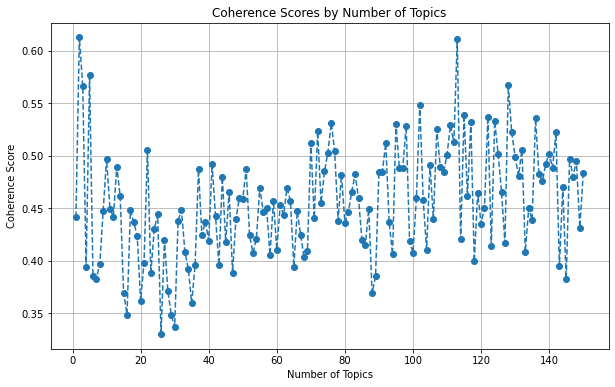

In [114]:
#sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, coherence_values, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

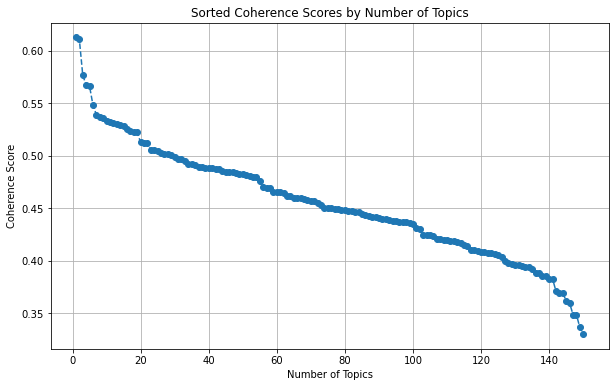

In [115]:
sorted_coherence_values = sorted(coherence_values, reverse=True)

topics_range = range(1, len(sorted_coherence_values) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range, sorted_coherence_values, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [118]:
### so from the coherence graph we can assume that 10 number of topics is good, basically the

In [120]:
df_topic_sents_keywords = format_topics_sentences(ldamodel = lda_model_desc, corpus = lda_corpus_dec, texts = df_mega_2["clean_desc"].tolist())

In [121]:
df_topic_sents_keywords.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"snapdragon, sd, data, eos, outside, software, ...",nontransparent sharing branch predictor select...
1,0,0.1000,"snapdragon, sd, data, eos, outside, software, ...",nontransparent sharing branch predictor within...
2,2,0.7750,"attacker, affected, version, device, interface...",hardware debug modes processor init setting al...
3,0,0.1000,"snapdragon, sd, data, eos, outside, software, ...",sensitive information accessible physical prob...
4,5,0.4182,"file, libreoffice, librelogo, allow, bgp, comm...",panos software provides options exclude specif...


In [124]:
# np.max(doc_lens)

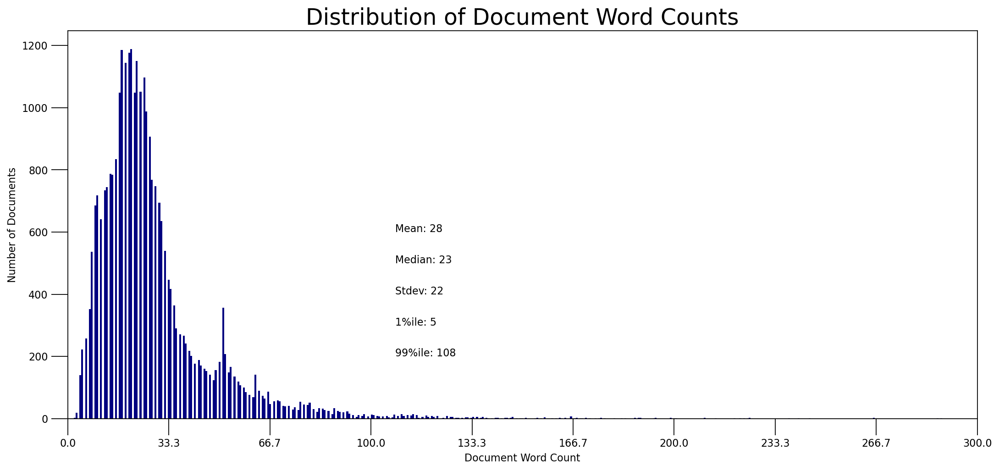

In [796]:
doc_lens = [len(d.split()) for d in df_topic_sents_keywords.Original_Text]

mean_val = round(np.mean(doc_lens))
median_val = round(np.median(doc_lens))
std_val = round(np.std(doc_lens))
quantile_01_val = round(np.quantile(doc_lens, q = 0.01))
quantile_99_val = round(np.quantile(doc_lens, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens, bins = 1000, color = 'navy')


plt.text(quantile_99_val, 600, "Mean: " + str(mean_val))
plt.text(quantile_99_val, 500, "Median: " + str(median_val))
plt.text(quantile_99_val, 400, "Stdev: " + str(std_val))
plt.text(quantile_99_val, 300, "1%ile: " + str(quantile_01_val))
plt.text(quantile_99_val, 200, "99%ile: " + str(quantile_99_val))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts', fontdict = dict(size = 22))
plt.show()

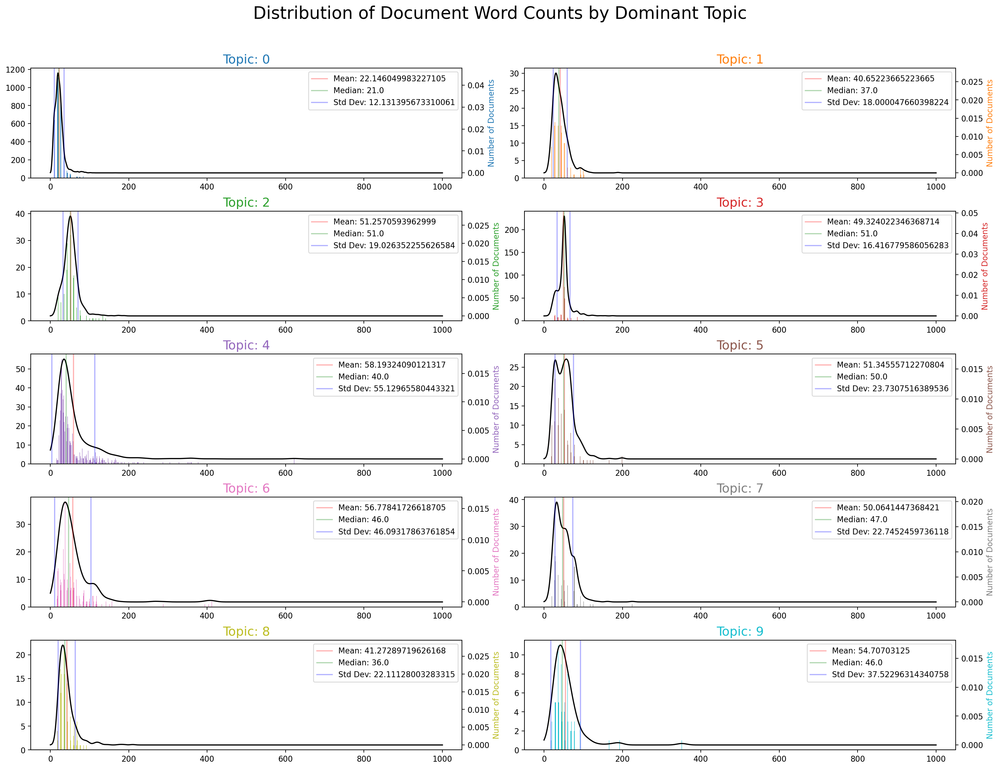

In [802]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

In [127]:
topics = lda_model_desc.show_topics(formatted = False)
data_flat = [w for desc in df_mega_2["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

In [128]:
df.head()

,word,topic_id,importance,word_count
0,snapdragon,0,0.235671,6582
1,sd,0,0.182786,2054
2,data,0,0.090981,9960
3,eos,0,0.045703,399
4,outside,0,0.041828,1127


<ipython-input-805-059246ef7024>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')


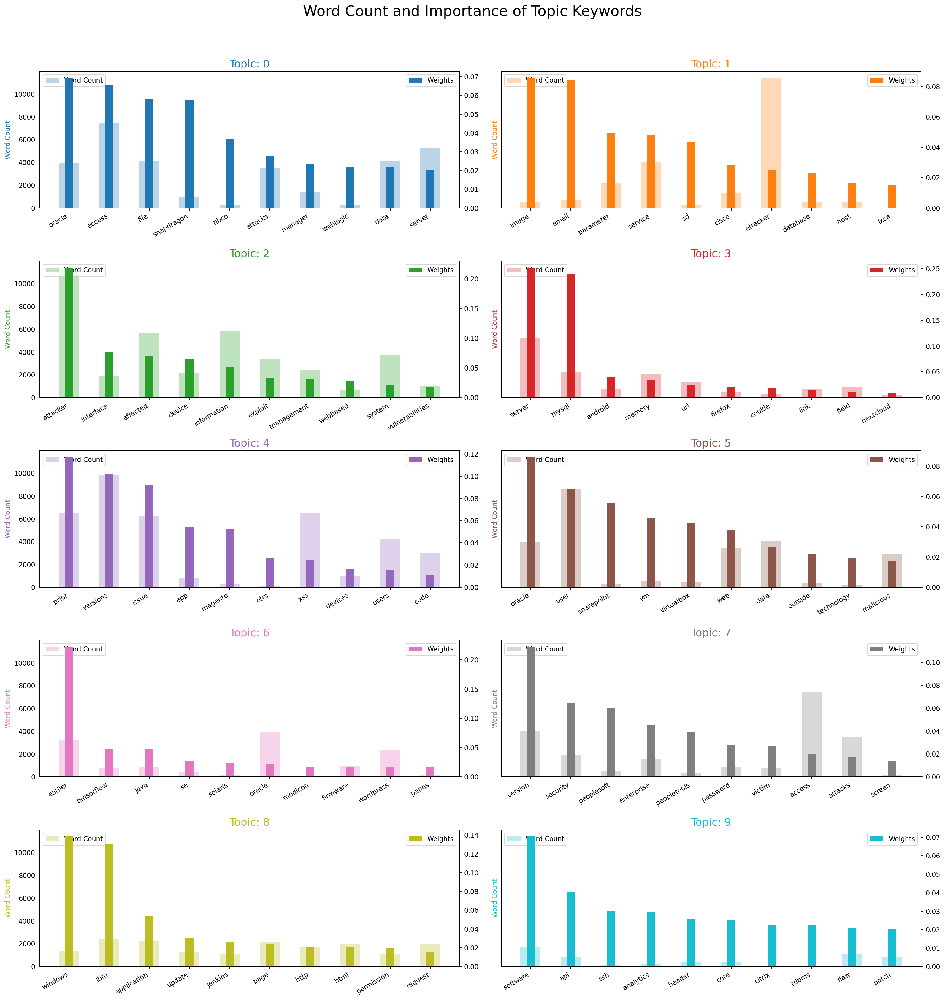

In [805]:
fig, axes = plt.subplots(5, 2, figsize = (20,20), sharey=True, dpi=160) 
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

for i, ax in enumerate(axes.flatten()):
    if i >= len(topics):  #just so it doesnt go beyond
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x= 'word', height = "importance", data = df.loc[df.topic_id == i, :], color = cols[i], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i])
    ax.set_title('Topic: ' + str(i), color = cols[i], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df.loc[df.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize = 22, y = 1.05)    
plt.show()

In [131]:
dominant_topics, topic_percentages = topics_per_document(model = lda_model_desc, corpus = lda_corpus_dec, end = -1)

In [132]:
df_2 = pd.DataFrame(dominant_topics, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df_2.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name = 'count').reset_index()

In [133]:
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name = 'count').reset_index()

In [134]:
topic_top3words = [(i, topic) for i, topics in lda_model_desc.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns = ['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(','.join)
df_top3words.reset_index(level = 0,inplace = True)

In [135]:
df_top3words

,topic_id,words
0,0,"snapdragon,sd,data"
1,1,"prior,user,magento"
2,2,"attacker,affected,version"
3,3,"versions,app,firmware"
4,4,"server,mysql,windows"
5,5,"file,libreoffice,librelogo"
6,6,"oracle,access,enterprise"
7,7,"system,parameter,information"
8,8,"earlier,java,se"
9,9,"tibco,document,ibm"


In [138]:
# labels

In [139]:
labels = []

for x in range(len(df_dominant_topic_in_each_doc.Dominant_Topic.unique())):
    
    topic_label = "Topic " + str(x) 
    
    words = df_top3words.loc[df_top3words.topic_id == x, 'words'].values[0] 
    #words_on_newlines = words.replace(' ', "\n")
    
    label = topic_label + " \n" + words + " \n" #\n not working do something
    
    labels.append(label)

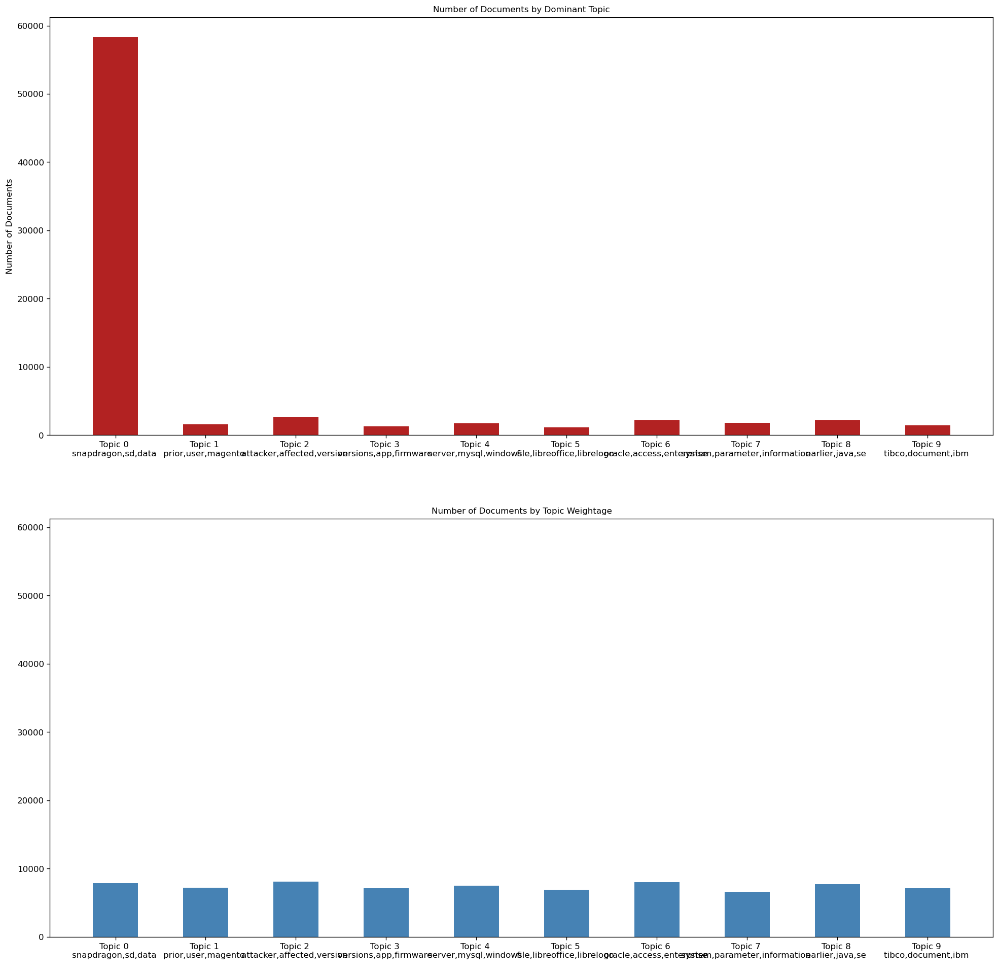

In [140]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (20, 20), dpi = 120, sharey = True) #remove sharey


ax1.bar(x = 'Dominant_Topic', height = 'count', data = df_dominant_topic_in_each_doc, width = .5, color = 'firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))

#labels = ['Topic ' + str(x) + '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0].replace(' ', '\n') for x in range(len(df_dominant_topic_in_each_doc.Dominant_Topic.unique()))]

ax1.set_xticklabels(labels, rotation = 0)
ax1.set_title('Number of Documents by Dominant Topic', fontdict = dict(size = 10))
ax1.set_ylabel('Number of Documents')

ax2.bar(x = 'index', height = 'count', data = df_topic_weightage_by_doc, width = .5, color = 'steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.set_xticklabels(labels, rotation = 0)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [854]:
topic_weights = []

for row_list in lda_model_desc[lda_corpus_dec]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights.append(weights)

In [855]:
arr = pd.DataFrame(topic_weights).fillna(0).values

#kepping only things over 0.35
arr = arr[np.amax(arr, axis = 1) > 0.35]

In [856]:
topic_num = np.argmax(arr, axis = 1) #dominant topic for each document

In [857]:
topic_num

array([2, 2, 2, ..., 1, 9, 8], dtype=int64)

In [858]:
# t-SNE Model
tsne_model = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda = tsne_model.fit_transform(arr)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 16393 samples in 0.057s...
[t-SNE] Computed neighbors for 16393 samples in 1.280s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16393
[t-SNE] Computed conditional probabilities for sample 2000 / 16393
[t-SNE] Computed conditional probabilities for sample 3000 / 16393
[t-SNE] Computed conditional probabilities for sample 4000 / 16393
[t-SNE] Computed conditional probabilities for sample 5000 / 16393
[t-SNE] Computed conditional probabilities for sample 6000 / 16393
[t-SNE] Computed conditional probabilities for sample 7000 / 16393
[t-SNE] Computed conditional probabilities for sample 8000 / 16393
[t-SNE] Computed conditional probabilities for sample 9000 / 16393
[t-SNE] Computed conditional probabilities for sample 10000 / 16393
[t-SNE] Computed conditional probabilities for sample 11000 / 16393
[t-SNE] Computed conditional probabilities for sample 12000 / 16393
[t-SNE] Computed conditional probabilities for sam

In [147]:
def rgba_to_hex(rgba):
    return "#{:02X}{:02X}{:02X}".format(int(rgba[0]*255), int(rgba[1]*255), int(rgba[2]*255))

# mycolors_hex = [rgba_to_hex(color) for color in mycolors]

In [154]:
def get_colormap_colors(n, cmap_name = 'nipy_spectral'):
    colormap = plt.cm.get_cmap(cmap_name, n)
    return [colormap(i) for i in range(colormap.N)]

In [859]:
n_topics = 10 
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda[:, 0],
    y = tsne_lda[:, 1],
    topic = topic_num,
    color = [mycolors_hex[i] for i in topic_num]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num), high = max(topic_num))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

## 2019

In [156]:
desc_2019 = dataframes_by_year[0] #gen 1 cause smaller 

In [157]:
model_desc_2019, model_terms_2019, corpus_dec_2019, id2word_desc_2019 = LDA_gen(desc_2019["clean_description"], num = 15, vectorizer_type = 'tfidf')

In [158]:
model_terms_2019

[(0,
  '0.061*"core" + 0.059*"system" + 0.053*"rdbms" + 0.048*"command" + 0.044*"key" + 0.034*"client"'),
 (1,
  '0.266*"file" + 0.086*"password" + 0.078*"otrs" + 0.029*"may" + 0.023*"vulnerable" + 0.010*"exchange"'),
 (2,
  '0.325*"attacker" + 0.067*"email" + 0.059*"exploit" + 0.056*"vulnerabilities" + 0.047*"commands" + 0.022*"privileges"'),
 (3,
  '0.625*"earlier" + 0.048*"interface" + 0.041*"management" + 0.030*"attacker" + 0.023*"webbased" + 0.023*"code"'),
 (4,
  '0.172*"service" + 0.055*"page" + 0.043*"configuration" + 0.042*"vpn" + 0.036*"files" + 0.022*"cookie"'),
 (5,
  '0.103*"image" + 0.036*"simatic" + 0.032*"via" + 0.030*"versions" + 0.025*"csrf" + 0.019*"container"'),
 (6,
  '0.225*"function" + 0.071*"xml" + 0.059*"session" + 0.044*"patch" + 0.024*"dhcp" + 0.013*"shell"'),
 (7,
  '0.221*"issue" + 0.186*"snapdragon" + 0.030*"iot" + 0.017*"library" + 0.011*"console" + 0.010*"root"'),
 (8,
  '0.305*"sd" + 0.106*"snapdragon" + 0.034*"certificate" + 0.025*"jenkins" + 0.021*"un

In [756]:
log_perplexity = model_desc_2019.log_perplexity(corpus_dec_2019)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -12.634821860040539
Perplexity: 6360.047654577942


In [159]:
def convert_to_gensim_dictionary(id2word_desc):
    
    word2id_desc = {v: k for k, v in id2word_desc.items()}
    gensim_dict = Dictionary()
    gensim_dict.token2id = word2id_desc
    
    return gensim_dict

In [160]:
gensim_dict_2019 = convert_to_gensim_dictionary(id2word_desc_2019)

In [161]:
hdp_2019 = HdpModel(corpus_dec_2019, gensim_dict_2019)

In [162]:
all_topics_2019 = hdp_2019.get_topics()
num_of_topics_2019 = all_topics_2019.shape[0]
print(f"Total number of topics 2019: {num_of_topics_2019}")

# topics_2019 = hdp_2019.print_topics(num_of_topics_2019 = num_of_topics_2019)

Total number of topics 2019: 150


In [163]:
texts_2019 = desc_2019['clean_desc'].apply(lambda x: x.split()).tolist()

In [164]:
coherence_model_hdp_2019 = CoherenceModel(model = hdp_2019, texts = texts_2019, dictionary = gensim_dict_2019, coherence = 'c_v')
coherence_hdp_2019 = coherence_model_hdp_2019.get_coherence()

In [165]:
coherence_hdp_2019

0.6753144010264255

In [166]:
coherence_values_2019 = compute_coherence_for_each_topic(hdp_2019, texts_2019, gensim_dict_2019)

top_topics_2019 = sorted(range(len(coherence_values_2019)), key = lambda i: coherence_values_2019[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores 2019:")
for idx in top_topics_2019:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, coherence_values_2019[idx]))

Top 10 Topics based on Coherence Scores 2019:
Topic 138: Coherence Score: 0.7494
Topic 148: Coherence Score: 0.7456
Topic 90: Coherence Score: 0.7453
Topic 28: Coherence Score: 0.7403
Topic 51: Coherence Score: 0.7365
Topic 122: Coherence Score: 0.7359
Topic 63: Coherence Score: 0.7356
Topic 97: Coherence Score: 0.7313
Topic 6: Coherence Score: 0.7311
Topic 69: Coherence Score: 0.7307


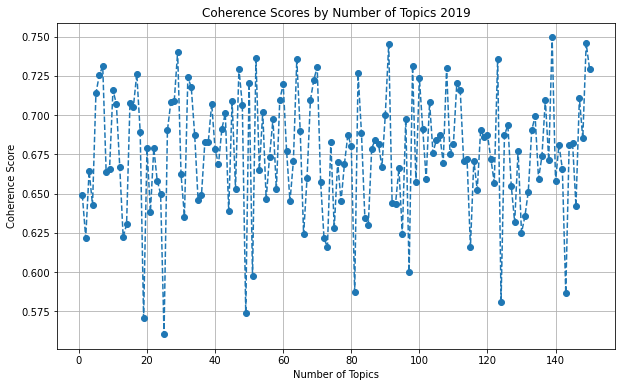

In [167]:
topics_range_2019 = range(1, len(coherence_values_2019) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2019, coherence_values_2019, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics 2019')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

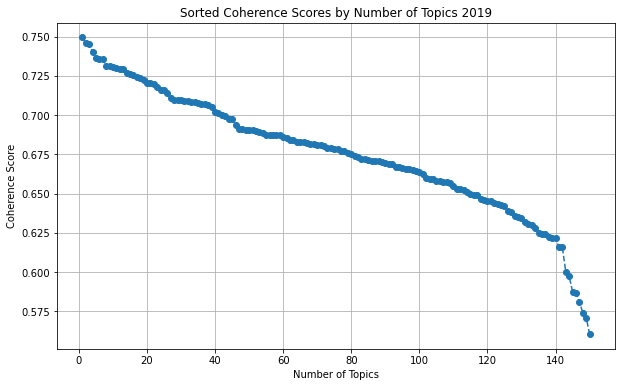

In [168]:
sorted_coherence_values_2019 = sorted(coherence_values_2019, reverse = True)

topics_range = range(1, len(sorted_coherence_values_2019) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2019, sorted_coherence_values_2019, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics 2019')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [819]:
df_topic_sents_keywords_2019 = format_topics_sentences(ldamodel = model_desc_2019, corpus = corpus_dec_2019, texts = desc_2019["clean_desc"].tolist())

In [170]:
df_topic_sents_keywords_2019

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,11,0.6133,"prior, magento, versions, series, control, bui...",receipt malformed packet mx series devices dyn...
1,11,0.6489,"prior, magento, versions, series, control, bui...",ex2300 ex3400 series stateless firewall filter...
2,11,0.4574,"prior, magento, versions, series, control, bui...",specific bgp flowspec configuration enabled up...
3,0,0.0667,"core, system, rdbms, command, key, client, ker...",juniper atp api key device key logged file rea...
4,11,0.6507,"prior, magento, versions, series, control, bui...",ex2300 ex3400 ex4600 qfx3k qfx5k series firewa...
...,...,...,...,...
12799,0,0.0667,"core, system, rdbms, command, key, client, ker...",diagtoolcgi dasan h660rm gpon routers firmware...
12800,0,0.5333,"core, system, rdbms, command, key, client, ker...",dasan h660rm devices firmware 1030022 use hard...
12801,0,0.0667,"core, system, rdbms, command, key, client, ker...",boa server configuration dasan h660rm devices ...
12802,0,0.0667,"core, system, rdbms, command, key, client, ker...",renderer process entertainment system tesla mo...


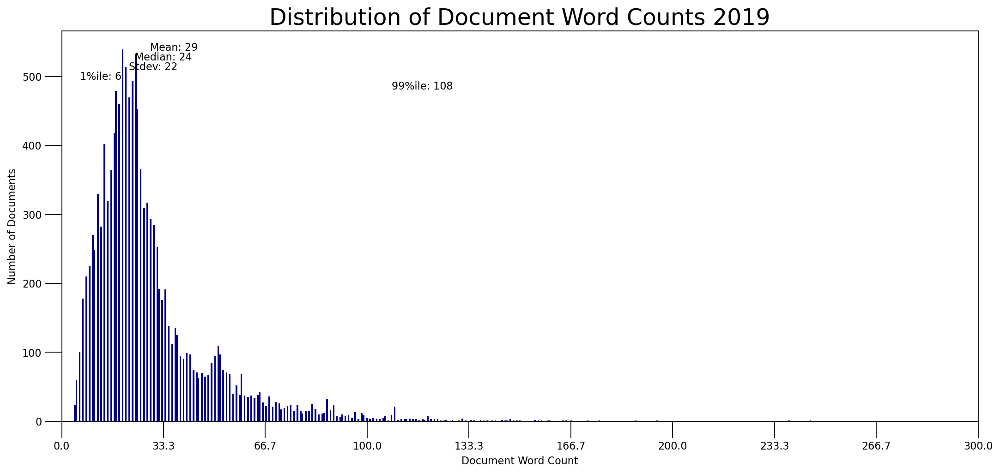

In [171]:
doc_lens_2019 = [len(d.split()) for d in df_topic_sents_keywords_2019.Original_Text]

mean_val_2019 = round(np.mean(doc_lens_2019))
median_val_2019 = round(np.median(doc_lens_2019))
std_val_2019 = round(np.std(doc_lens_2019))
quantile_01_val_2019 = round(np.quantile(doc_lens_2019, q = 0.01))
quantile_99_val_2019 = round(np.quantile(doc_lens_2019, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens_2019, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim()) 

plt.text(mean_val_2019, y_pos, "Mean: " + str(mean_val_2019))
plt.text(median_val_2019, y_pos - spacing, "Median: " + str(median_val_2019))
plt.text(std_val_2019, y_pos - 2 * spacing, "Stdev: " + str(std_val_2019))
plt.text(quantile_01_val_2019, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val_2019))
plt.text(quantile_99_val_2019, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val_2019))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts 2019', fontdict = dict(size = 22))
plt.show()

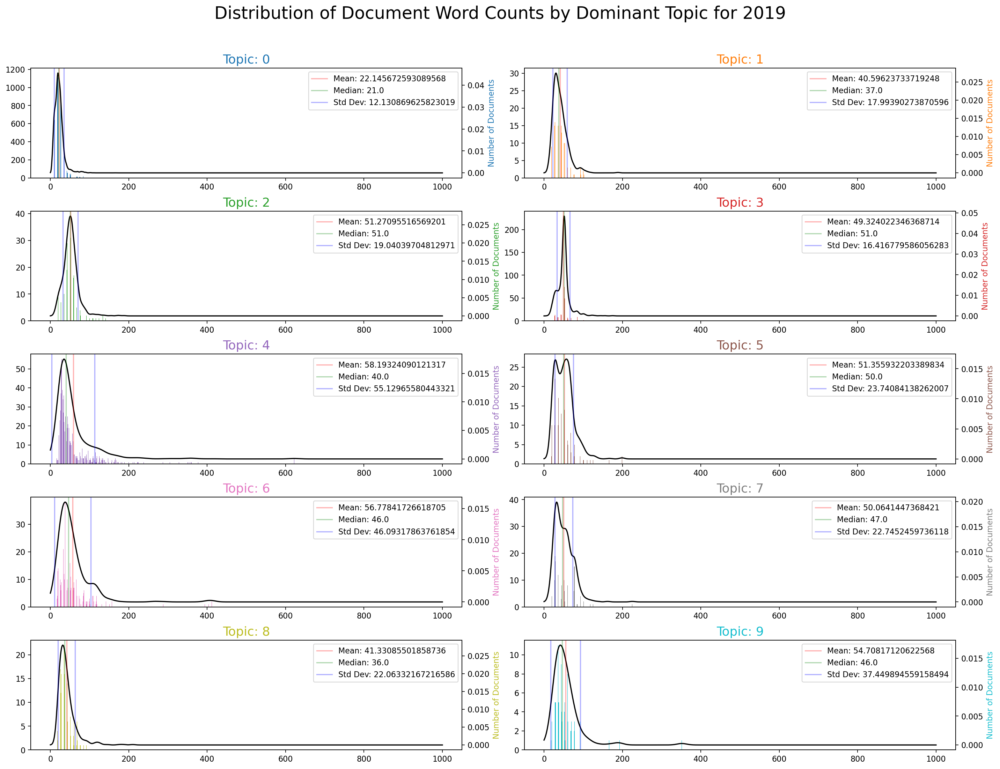

In [820]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for 2019', fontsize=22)
plt.show()

In [174]:
topics_2019 = model_desc_2019.show_topics(num_topics=15,formatted = False)
data_flat_2019 = [w for desc in desc_2019["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat_2019)

out = []
for i, topic in topics_2019:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df_2019 = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

<ipython-input-175-d749d59af6ce>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_2019.loc[df_2019.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


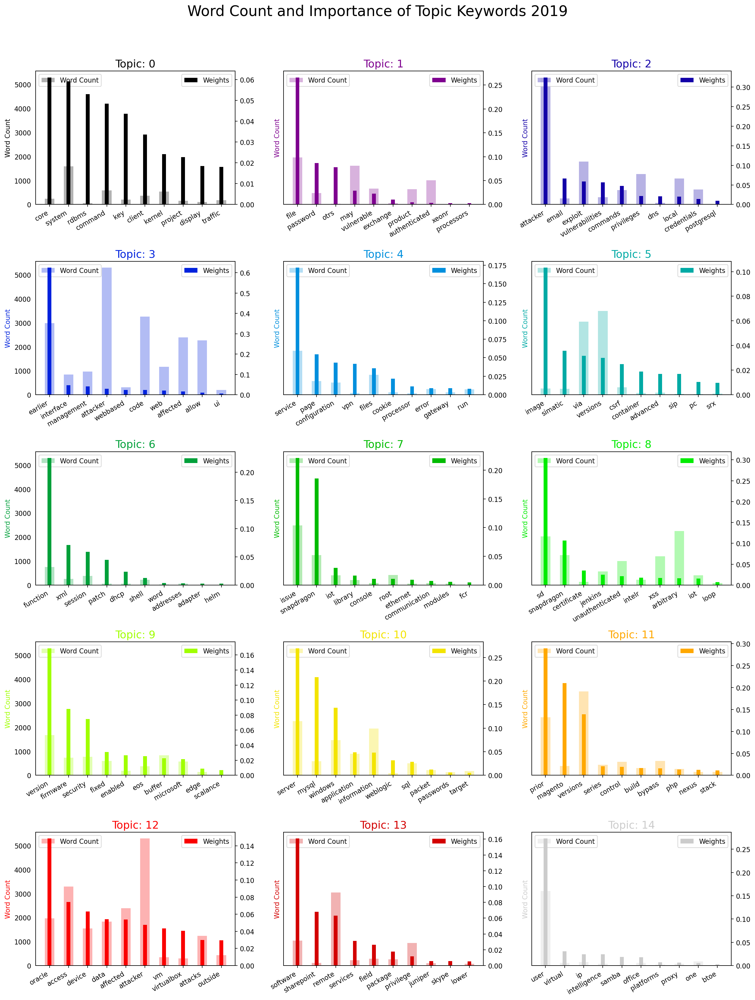

In [175]:
fig, axes = plt.subplots(5, 3, figsize=(16,20), sharey = True, dpi = 160)  
cols = get_colormap_colors(n_topics)
for i, ax in enumerate(axes.flatten()):
    if i >= len(topics_2019):  
        ax.axis('off') 
        continue
    ax.bar(x = 'word', height = "word_count", data = df_2019.loc[df_2019.topic_id == i, :], color = cols[i % len(cols)], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x = 'word', height = "importance", data = df_2019.loc[df_2019.topic_id == i, :], color = cols[i % len(cols)], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i % len(cols)])
    ax.set_title('Topic: ' + str(i), color = cols[i % len(cols)], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df_2019.loc[df_2019.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords 2019', fontsize = 22, y = 1.05)    
plt.show()

In [176]:
dominant_topics_2019, topic_percentages_2019 = topics_per_document(model = model_desc_2019, corpus = corpus_dec_2019, end = -1)

In [177]:
df_2_2019 = pd.DataFrame(dominant_topics_2019, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc_2019 = df_2_2019.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_2019 = dominant_topic_in_each_doc_2019.to_frame(name = 'count').reset_index()

In [178]:
topic_weightage_by_doc_2019 = pd.DataFrame([dict(t) for t in topic_percentages_2019])
df_topic_weightage_by_doc_2019 = topic_weightage_by_doc_2019.sum().to_frame(name = 'count').reset_index()

In [179]:
topic_top3words_2019 = [(i, topic) for i, topics in model_desc_2019.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked_2019 = pd.DataFrame(topic_top3words_2019, columns = ['topic_id', 'words'])
df_top3words_2019 = df_top3words_stacked_2019.groupby('topic_id').agg(','.join)
df_top3words_2019.reset_index(level = 0,inplace = True)

In [180]:
df_top3words_2019

,topic_id,words
0,1,"file,password,otrs"
1,4,"service,page,configuration"
2,5,"image,simatic,via"
3,8,"sd,snapdragon,certificate"
4,9,"version,firmware,security"
5,10,"server,mysql,windows"
6,11,"prior,magento,versions"
7,12,"oracle,access,device"
8,13,"software,sharepoint,remote"
9,14,"user,virtual,ip"


In [860]:
topic_weights_2019 = []

for row_list in model_desc_2019[corpus_dec_2019]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights_2019.append(weights)

In [861]:
arr_2019 = pd.DataFrame(topic_weights_2019).fillna(0).values

arr_2019 = arr_2019[np.amax(arr_2019, axis = 1) > 0.35]

In [183]:
print(arr_2019.dtype)

float32


In [862]:
topic_num_2019 = np.argmax(arr_2019, axis = 1)

In [863]:
# t-SNE Model
tsne_model_2019 = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda_2019 = tsne_model_2019.fit_transform(arr_2019) #so tsne does not work when i go over 15 topics, doesnt matter if i change the parameters

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2568 samples in 0.011s...
[t-SNE] Computed neighbors for 2568 samples in 0.247s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2568
[t-SNE] Computed conditional probabilities for sample 2000 / 2568
[t-SNE] Computed conditional probabilities for sample 2568 / 2568
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.157921
[t-SNE] KL divergence after 1000 iterations: -0.010018


In [864]:
n_topics = 15
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda_2019[:, 0],
    y = tsne_lda_2019[:, 1],
    topic = topic_num_2019,
    color = [mycolors_hex[i] for i in topic_num_2019]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num_2019), high = max(topic_num_2019))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics 2019".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

## 2020

In [187]:
desc_2020 = dataframes_by_year[1]

In [188]:
model_desc_2020, model_terms_2020, corpus_dec_2020, id2word_desc_2020 = LDA_gen(desc_2020["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [189]:
model_terms_2020

[(0,
  '0.094*"oracle" + 0.087*"access" + 0.068*"data" + 0.031*"docker" + 0.019*"token" + 0.017*"request"'),
 (1,
  '0.165*"attacker" + 0.160*"earlier" + 0.076*"issue" + 0.048*"affected" + 0.024*"vulnerabilities" + 0.021*"panos"'),
 (2,
  '0.091*"server" + 0.054*"user" + 0.054*"mysql" + 0.048*"interface" + 0.033*"update" + 0.031*"web"'),
 (3,
  '0.078*"device" + 0.051*"attacks" + 0.037*"java" + 0.034*"linux" + 0.033*"code" + 0.032*"suse"'),
 (4,
  '0.139*"file" + 0.077*"iot" + 0.074*"system" + 0.041*"sharepoint" + 0.038*"execute" + 0.026*"tibco"'),
 (5,
  '0.136*"version" + 0.046*"information" + 0.042*"vm" + 0.039*"virtualbox" + 0.036*"oracle" + 0.028*"prior"'),
 (6,
  '0.144*"ibm" + 0.072*"security" + 0.048*"cookie" + 0.046*"link" + 0.027*"citrix" + 0.027*"sierra"'),
 (7,
  '0.270*"windows" + 0.065*"enterprise" + 0.056*"memory" + 0.026*"password" + 0.020*"peoplesoft" + 0.014*"key"'),
 (8,
  '0.288*"snapdragon" + 0.117*"versions" + 0.064*"prior" + 0.019*"api" + 0.011*"opensuse" + 0.011

In [757]:
log_perplexity = model_desc_2020.log_perplexity(corpus_dec_2020)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.18554607500736
Perplexity: 291.1353220287004


In [190]:
gensim_dict_2020 = convert_to_gensim_dictionary(id2word_desc_2020)

In [191]:
hdp_2020 = HdpModel(corpus_dec_2020, gensim_dict_2020)

In [192]:
all_topics_2020 = hdp_2020.get_topics()
num_of_topics_2020 = all_topics_2020.shape[0]
print(f"Total number of topics 2020: {num_of_topics_2020}")

# topics_2019 = hdp_2019.print_topics(num_of_topics_2019 = num_of_topics_2019)

Total number of topics 2020: 150


In [193]:
texts_2020 = desc_2020['clean_desc'].apply(lambda x: x.split()).tolist()

In [194]:
coherence_model_hdp_2020 = CoherenceModel(model = hdp_2020, texts = texts_2020, dictionary = gensim_dict_2020, coherence = 'c_v')
coherence_hdp_2020 = coherence_model_hdp_2020.get_coherence()

In [195]:
coherence_hdp_2020

0.6888797472405741

In [196]:
coherence_values_2020 = compute_coherence_for_each_topic(hdp_2020, texts_2020, gensim_dict_2020)

top_topics_2020 = sorted(range(len(coherence_values_2020)), key = lambda i: coherence_values_2020[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores 2020:")
for idx in top_topics_2020:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, coherence_values_2020[idx]))

Top 10 Topics based on Coherence Scores 2020:
Topic 93: Coherence Score: 0.7782
Topic 30: Coherence Score: 0.7650
Topic 37: Coherence Score: 0.7617
Topic 22: Coherence Score: 0.7607
Topic 129: Coherence Score: 0.7573
Topic 140: Coherence Score: 0.7562
Topic 122: Coherence Score: 0.7556
Topic 141: Coherence Score: 0.7550
Topic 53: Coherence Score: 0.7535
Topic 68: Coherence Score: 0.7491


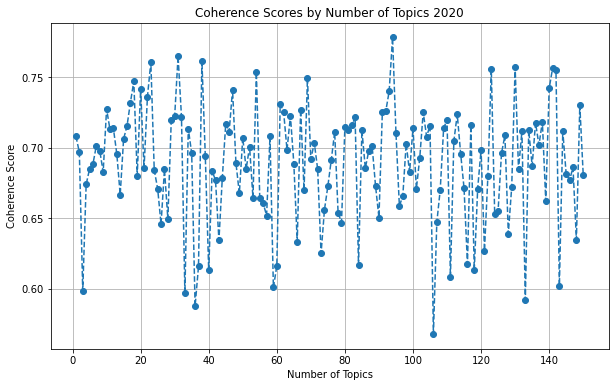

In [197]:
topics_range_2020 = range(1, len(coherence_values_2020) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2020, coherence_values_2020, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics 2020')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

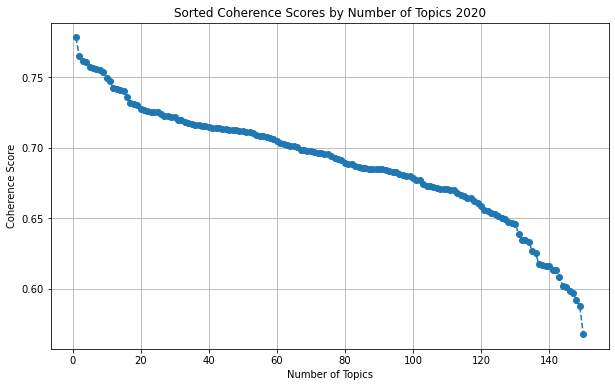

In [198]:
sorted_coherence_values_2020 = sorted(coherence_values_2020, reverse=True)

topics_range_2020 = range(1, len(sorted_coherence_values_2020) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2020, sorted_coherence_values_2020, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics 2020')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [821]:
df_topic_sents_keywords_2020 = format_topics_sentences(ldamodel = model_desc_2020, corpus = corpus_dec_2020, texts = desc_2020["clean_desc"].tolist())

In [200]:
df_topic_sents_keywords_2020

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"oracle, access, data, docker, token, request, ...",getprocessrecordlocked activitymanagerservicej...
1,0,0.1000,"oracle, access, data, docker, token, request, ...",ih264dinitdecoder ih264dapic possible bounds w...
2,0,0.1000,"oracle, access, data, docker, token, request, ...",oncreate installstartjava possible package val...
3,0,0.1000,"oracle, access, data, docker, token, request, ...",generatecrop wallpapermanagerservicejava possi...
4,0,0.1000,"oracle, access, data, docker, token, request, ...",btmreadremoteextfeaturescomplete btmaclcc poss...
...,...,...,...,...
16691,0,0.3425,"oracle, access, data, docker, token, request, ...",dahua devices build time december 2019 use str...
16692,9,0.6272,"devices, firefox, android, xss, allow, ldap, d...",given compromised sandboxed content process du...
16693,1,0.5773,"attacker, earlier, issue, affected, vulnerabil...",vesta control panel vestacp 097 09823 vulnerab...
16694,0,0.1000,"oracle, access, data, docker, token, request, ...",omeservicesgraphsgraphtraversalfindobjectdetai...


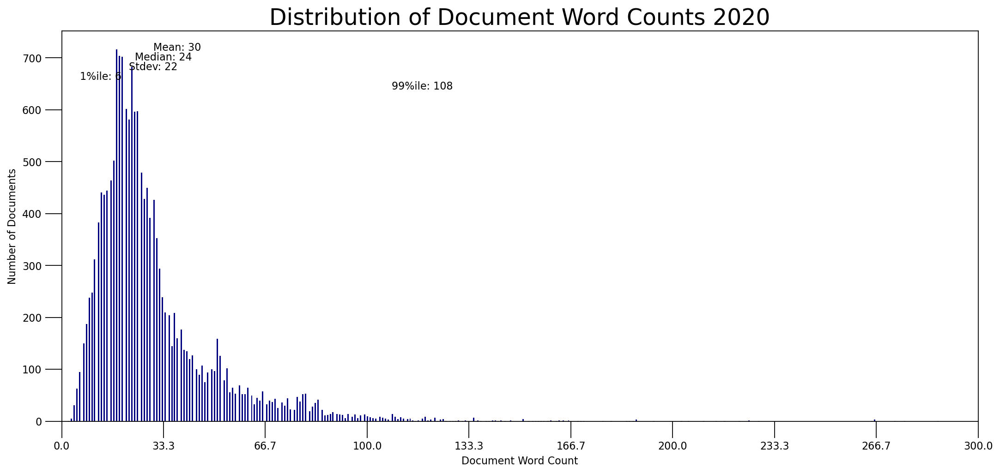

In [201]:
doc_lens_2020 = [len(d.split()) for d in df_topic_sents_keywords_2020.Original_Text]

mean_val_2020 = round(np.mean(doc_lens_2020))
median_val_2020 = round(np.median(doc_lens_2020))
std_val_2020 = round(np.std(doc_lens_2020))
quantile_01_val_2020 = round(np.quantile(doc_lens_2020, q = 0.01))
quantile_99_val_2020 = round(np.quantile(doc_lens_2020, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens_2020, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim()) 
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val_2020, y_pos, "Mean: " + str(mean_val_2020))
plt.text(median_val_2020, y_pos - spacing, "Median: " + str(median_val_2020))
plt.text(std_val_2020, y_pos - 2 * spacing, "Stdev: " + str(std_val_2020))
plt.text(quantile_01_val_2020, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val_2020))
plt.text(quantile_99_val_2020, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val_2020))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts 2020', fontdict = dict(size = 22))
plt.show()


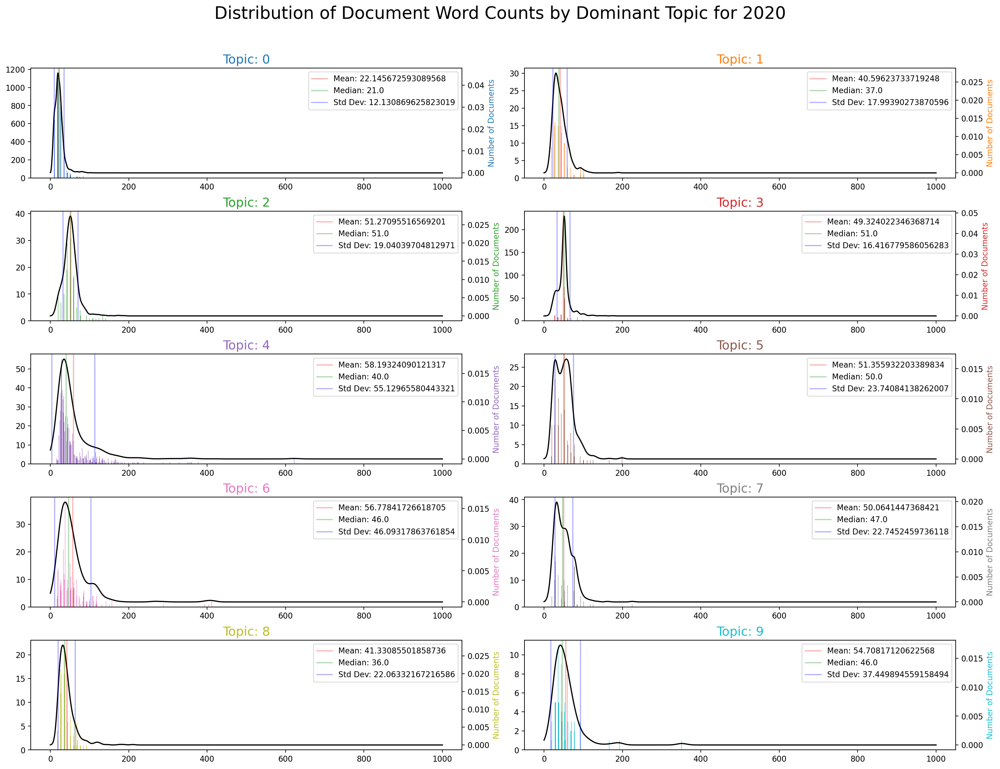

In [822]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for 2020', fontsize=22)
plt.show()

In [203]:
topics_2020 = model_desc_2020.show_topics(num_topics=10,formatted = False)
data_flat_2020 = [w for desc in desc_2020["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat_2020)

out = []
for i, topic in topics_2020:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df_2020 = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

<ipython-input-204-f9275a6f4728>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_2020.loc[df_2020.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


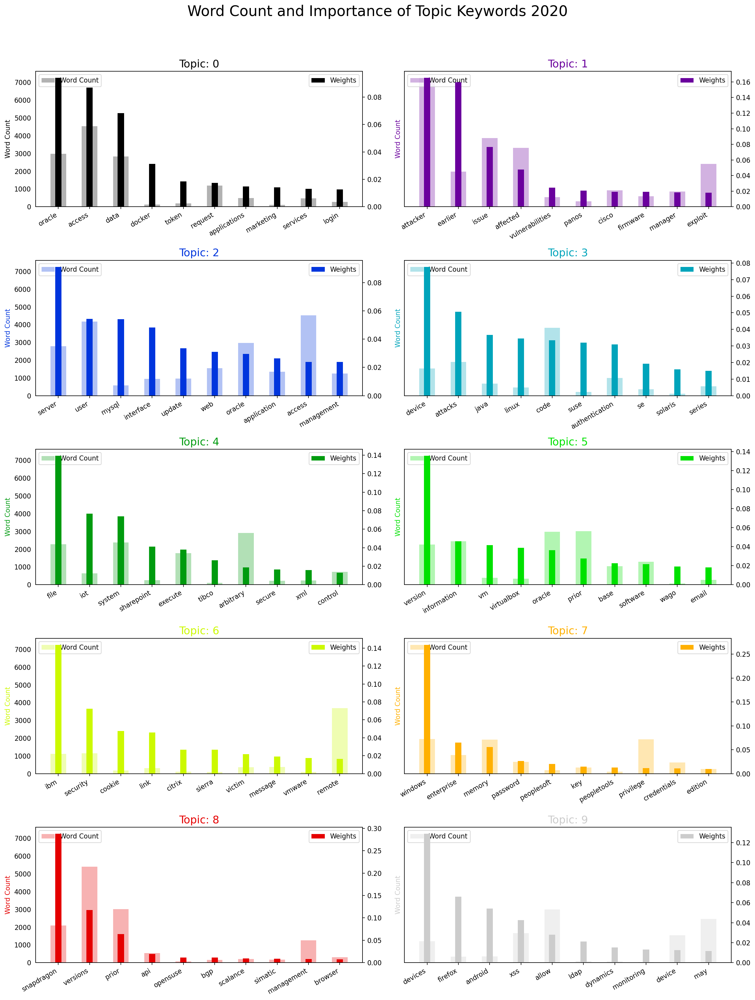

In [204]:
fig, axes = plt.subplots(5, 2, figsize = (16,20), sharey = True, dpi = 160)  
cols = get_colormap_colors(n_topics)
for i, ax in enumerate(axes.flatten()):
    if i >= len(topics_2020):  
        ax.axis('off')  
        continue
    ax.bar(x = 'word', height = "word_count", data = df_2020.loc[df_2020.topic_id == i, :], color = cols[i % len(cols)], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x = 'word', height = "importance", data = df_2020.loc[df_2020.topic_id == i, :], color = cols[i % len(cols)], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i % len(cols)])
    ax.set_title('Topic: ' + str(i), color = cols[i % len(cols)], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df_2020.loc[df_2020.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords 2020', fontsize = 22, y = 1.05)    
plt.show()

In [205]:
dominant_topics_2020, topic_percentages_2020 = topics_per_document(model = model_desc_2020, corpus = corpus_dec_2020, end = -1)

In [206]:
df_2_2020 = pd.DataFrame(dominant_topics_2020, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc_2020 = df_2_2020.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_2020 = dominant_topic_in_each_doc_2020.to_frame(name = 'count').reset_index()

In [207]:
topic_weightage_by_doc_2020 = pd.DataFrame([dict(t) for t in topic_percentages_2020])
df_topic_weightage_by_doc_2020 = topic_weightage_by_doc_2020.sum().to_frame(name = 'count').reset_index()

In [208]:
topic_top3words_2020 = [(i, topic) for i, topics in model_desc_2020.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked_2020 = pd.DataFrame(topic_top3words_2020, columns = ['topic_id', 'words'])
df_top3words_2020 = df_top3words_stacked_2020.groupby('topic_id').agg(','.join)
df_top3words_2020.reset_index(level = 0,inplace = True)

In [209]:
df_top3words_2020

,topic_id,words
0,0,"oracle,access,data"
1,1,"attacker,earlier,issue"
2,2,"server,user,mysql"
3,3,"device,attacks,java"
4,4,"file,iot,system"
5,5,"version,information,vm"
6,6,"ibm,security,cookie"
7,7,"windows,enterprise,memory"
8,8,"snapdragon,versions,prior"
9,9,"devices,firefox,android"


In [865]:
topic_weights_2020 = []

for row_list in model_desc_2020[corpus_dec_2020]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights_2020.append(weights)

In [866]:
arr_2020 = pd.DataFrame(topic_weights_2020).fillna(0).values

arr_2020 = arr_2020[np.amax(arr_2020, axis = 1) > 0.35]

In [867]:
topic_num_2020 = np.argmax(arr_2020, axis = 1)

In [868]:
topic_num_2020

array([9, 2, 9, ..., 2, 9, 1], dtype=int64)

In [869]:
# t-SNE Model
tsne_model_2020 = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda_2020 = tsne_model_2020.fit_transform(arr_2020)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4025 samples in 0.016s...
[t-SNE] Computed neighbors for 4025 samples in 0.363s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4025
[t-SNE] Computed conditional probabilities for sample 2000 / 4025
[t-SNE] Computed conditional probabilities for sample 3000 / 4025
[t-SNE] Computed conditional probabilities for sample 4000 / 4025
[t-SNE] Computed conditional probabilities for sample 4025 / 4025
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.719891
[t-SNE] KL divergence after 1000 iterations: 0.267493


In [870]:
n_topics = 10
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]

source = ColumnDataSource(data = dict(
    x = tsne_lda_2020[:, 0],
    y = tsne_lda_2020[:, 1],
    topic = topic_num_2020,
    color = [mycolors_hex[i] for i in topic_num_2020]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num_2020), high = max(topic_num_2020))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics 2020".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

## 2021

In [216]:
desc_2021 = dataframes_by_year[2]

In [217]:
model_desc_2021, model_terms_2021, corpus_dec_2021, id2word_desc_2021 = LDA_gen(desc_2021["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [218]:
model_terms_2021

[(0,
  '0.047*"http" + 0.037*"software" + 0.036*"xss" + 0.033*"plugin" + 0.022*"outside" + 0.019*"technology"'),
 (1,
  '0.158*"file" + 0.040*"oracle" + 0.026*"vm" + 0.023*"virtualbox" + 0.021*"java" + 0.019*"services"'),
 (2,
  '0.115*"user" + 0.024*"memory" + 0.024*"tibco" + 0.022*"files" + 0.021*"authentication" + 0.021*"xml"'),
 (3,
  '0.113*"attacker" + 0.058*"device" + 0.040*"vulnerabilities" + 0.038*"affected" + 0.030*"request" + 0.026*"exploit"'),
 (4,
  '0.138*"versions" + 0.065*"prior" + 0.033*"aruba" + 0.021*"flaw" + 0.021*"service" + 0.015*"instant"'),
 (5,
  '0.304*"snapdragon" + 0.117*"server" + 0.071*"mysql" + 0.039*"iot" + 0.036*"application" + 0.015*"hpe"'),
 (6,
  '0.083*"access" + 0.043*"data" + 0.038*"oracle" + 0.035*"password" + 0.026*"document" + 0.026*"code"'),
 (7,
  '0.103*"version" + 0.096*"ibm" + 0.039*"users" + 0.029*"sql" + 0.019*"cookie" + 0.017*"apache"'),
 (8,
  '0.212*"tensorflow" + 0.142*"earlier" + 0.024*"policy" + 0.022*"information" + 0.019*"clearpa

In [758]:
log_perplexity = model_desc_2021.log_perplexity(corpus_dec_2021)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.305752846098262
Perplexity: 316.4322528675833


In [219]:
gensim_dict_2021 = convert_to_gensim_dictionary(id2word_desc_2021)

In [220]:
hdp_2021 = HdpModel(corpus_dec_2021, gensim_dict_2021)

In [221]:
all_topics_2021 = hdp_2021.get_topics()
num_of_topics_2021 = all_topics_2021.shape[0]
print(f"Total number of topics 2021: {num_of_topics_2021}")

# topics_2019 = hdp_2019.print_topics(num_of_topics_2019 = num_of_topics_2019)

Total number of topics 2021: 150


In [222]:
texts_2021 = desc_2021['clean_desc'].apply(lambda x: x.split()).tolist()

In [223]:
coherence_model_hdp_2021 = CoherenceModel(model = hdp_2021, texts = texts_2021, dictionary = gensim_dict_2021, coherence = 'c_v')
coherence_hdp_2021 = coherence_model_hdp_2021.get_coherence()

In [224]:
coherence_hdp_2021

0.6844054910006732

In [225]:
coherence_values_2021 = compute_coherence_for_each_topic(hdp_2021, texts_2021, gensim_dict_2021)

top_topics_2021 = sorted(range(len(coherence_values_2021)), key = lambda i: coherence_values_2021[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores 2021:")
for idx in top_topics_2021:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, coherence_values_2021[idx]))

Top 10 Topics based on Coherence Scores 2021:
Topic 149: Coherence Score: 0.7614
Topic 86: Coherence Score: 0.7544
Topic 134: Coherence Score: 0.7539
Topic 29: Coherence Score: 0.7495
Topic 6: Coherence Score: 0.7422
Topic 83: Coherence Score: 0.7412
Topic 42: Coherence Score: 0.7410
Topic 107: Coherence Score: 0.7404
Topic 52: Coherence Score: 0.7396
Topic 55: Coherence Score: 0.7365


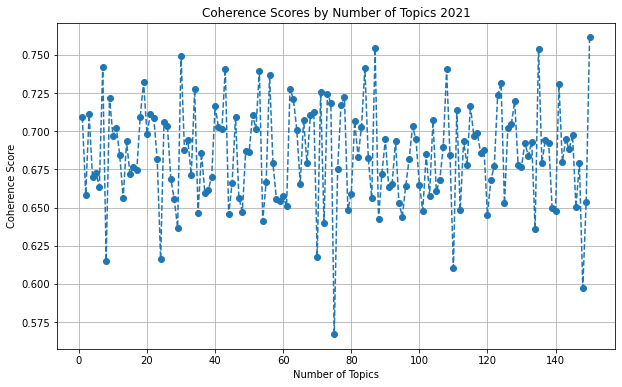

In [226]:
topics_range_2021 = range(1, len(coherence_values_2021) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2021, coherence_values_2021, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics 2021')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

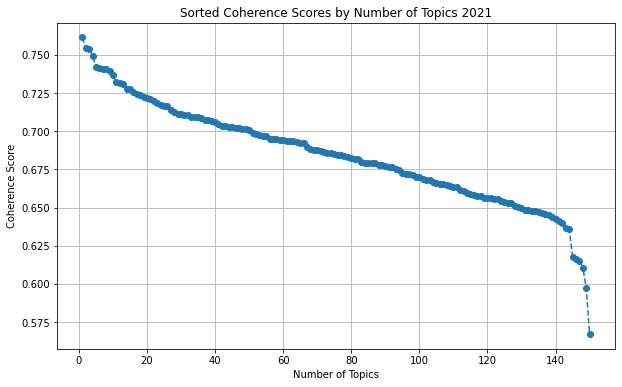

In [227]:
sorted_coherence_values_2021 = sorted(coherence_values_2021, reverse=True)

topics_range_2021 = range(1, len(sorted_coherence_values_2021) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2021, sorted_coherence_values_2021, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics 2021')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [823]:
df_topic_sents_keywords_2021 = format_topics_sentences(ldamodel = model_desc_2021, corpus = corpus_dec_2021, texts = desc_2021["clean_desc"].tolist())

In [229]:
df_topic_sents_keywords_2021

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"http, software, xss, plugin, outside, technolo...",observable timing discrepancy intelr ipp versi...
1,0,0.1000,"http, software, xss, plugin, outside, technolo...",improper conditions check intelr ethernet cont...
2,0,0.1000,"http, software, xss, plugin, outside, technolo...",improper conditions check intelr ethernet cont...
3,0,0.1000,"http, software, xss, plugin, outside, technolo...",improper buffer restrictions firmware intelr e...
4,0,0.1000,"http, software, xss, plugin, outside, technolo...",uncaught exception firmware intelr ethernet ad...
...,...,...,...,...
19971,0,0.1000,"http, software, xss, plugin, outside, technolo...",issue addressed improved entitlements issue fi...
19972,0,0.1000,"http, software, xss, plugin, outside, technolo...",issue discovered bluetoothd bluez 548 lies han...
19973,8,0.4138,"tensorflow, earlier, policy, information, clea...",heapbased buffer overflow discovered bluetooth...
19974,1,0.5500,"file, oracle, vm, virtualbox, java, services, ...",issue discovered cms made simple 228 possible ...


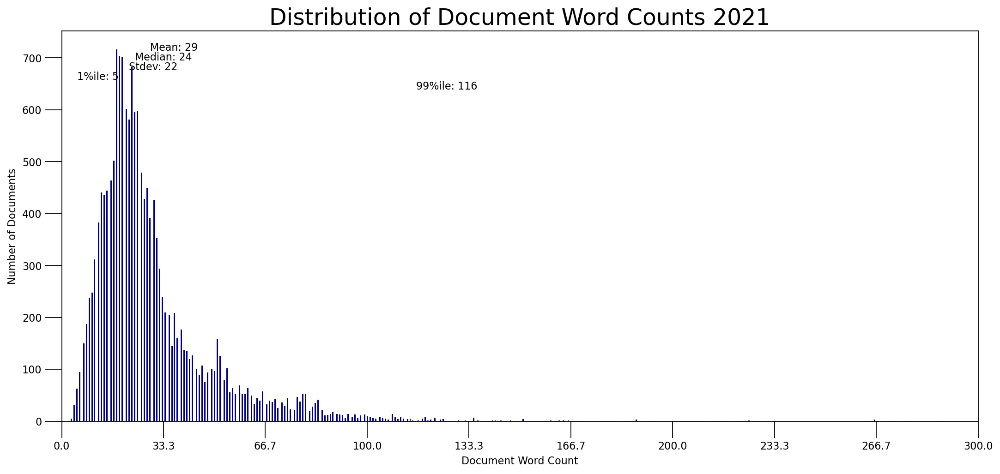

In [230]:
doc_lens_2021 = [len(d.split()) for d in df_topic_sents_keywords_2021.Original_Text]

mean_val_2021 = round(np.mean(doc_lens_2021))
median_val_2021 = round(np.median(doc_lens_2021))
std_val_2021 = round(np.std(doc_lens_2021))
quantile_01_val_2021 = round(np.quantile(doc_lens_2021, q = 0.01))
quantile_99_val_2021 = round(np.quantile(doc_lens_2021, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens_2020, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim()) 

plt.text(mean_val_2021, y_pos, "Mean: " + str(mean_val_2021))
plt.text(median_val_2021, y_pos - spacing, "Median: " + str(median_val_2021))
plt.text(std_val_2021, y_pos - 2 * spacing, "Stdev: " + str(std_val_2021))
plt.text(quantile_01_val_2021, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val_2021))
plt.text(quantile_99_val_2021, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val_2021))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts 2021', fontdict = dict(size = 22))
plt.show()

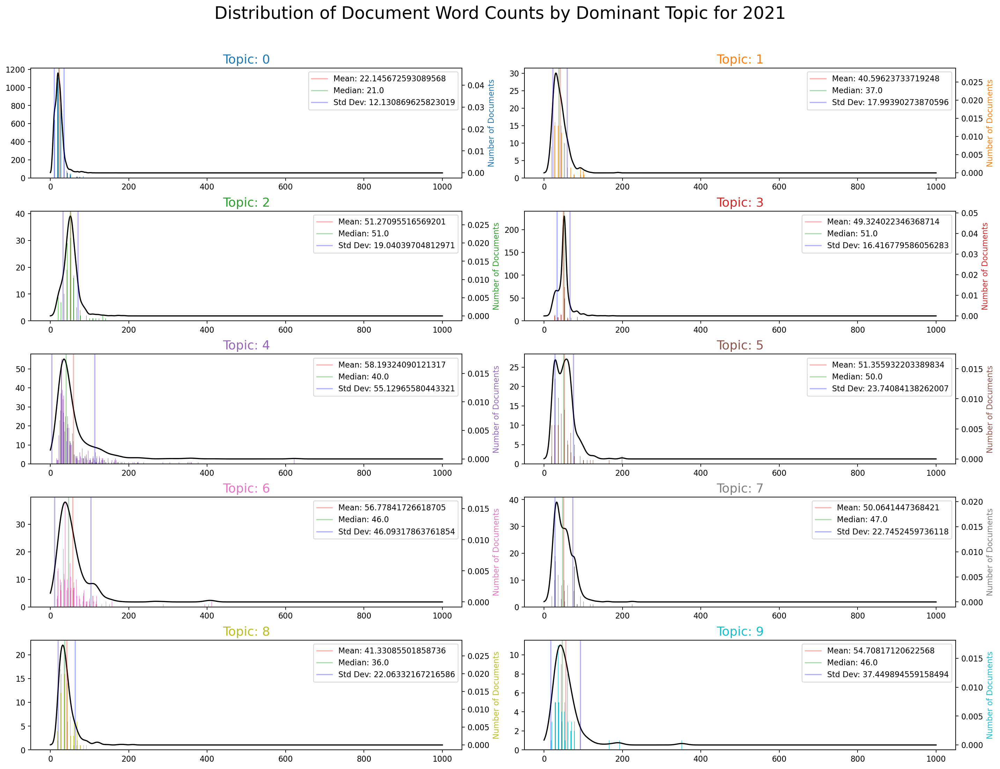

In [824]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for 2021', fontsize=22)
plt.show()

In [232]:
topics_2021 = model_desc_2021.show_topics(num_topics=10,formatted = False)
data_flat_2021 = [w for desc in desc_2021["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat_2021)

out = []
for i, topic in topics_2021:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df_2021 = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

<ipython-input-233-bc5919d276f2>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_2021.loc[df_2021.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


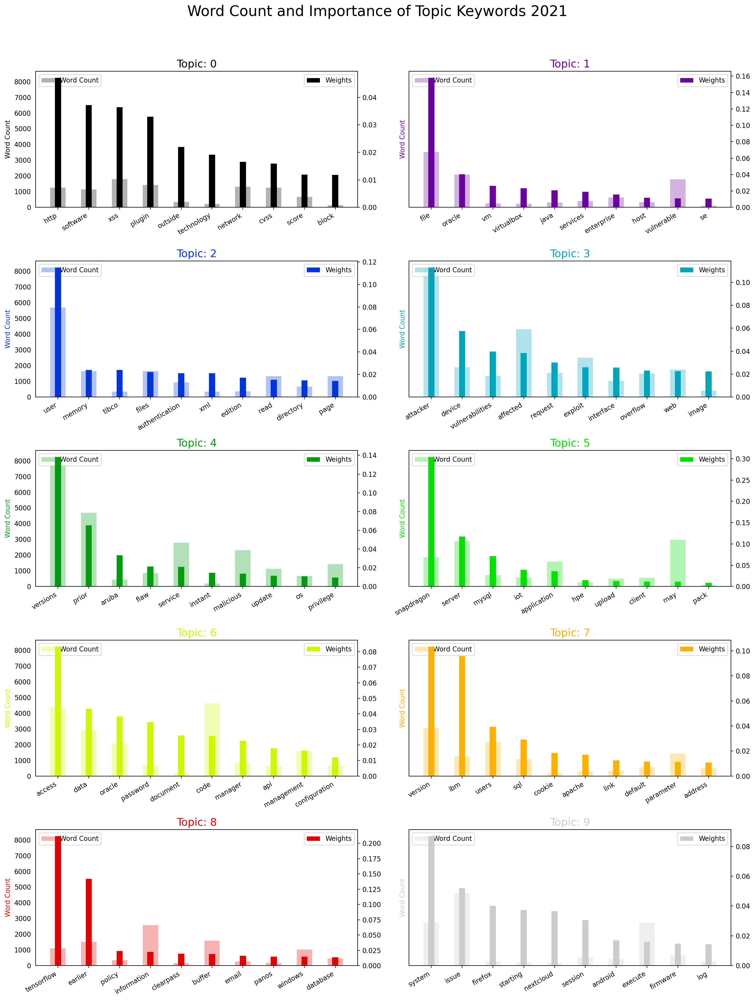

In [233]:
fig, axes = plt.subplots(5, 2, figsize = (16,20), sharey = True, dpi = 160)  
cols = get_colormap_colors(n_topics)
for i, ax in enumerate(axes.flatten()):
    if i >= len(topics_2021):  
        ax.axis('off') 
        continue
    ax.bar(x = 'word', height = "word_count", data = df_2021.loc[df_2021.topic_id == i, :], color = cols[i % len(cols)], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x = 'word', height = "importance", data = df_2021.loc[df_2021.topic_id == i, :], color = cols[i % len(cols)], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i % len(cols)])
    ax.set_title('Topic: ' + str(i), color = cols[i % len(cols)], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df_2021.loc[df_2021.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords 2021', fontsize = 22, y = 1.05)    
plt.show()

In [234]:
dominant_topics_2021, topic_percentages_2021 = topics_per_document(model = model_desc_2021, corpus = corpus_dec_2021, end = -1)

In [235]:
df_2_2021 = pd.DataFrame(dominant_topics_2021, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc_2021 = df_2_2021.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_2021 = dominant_topic_in_each_doc_2021.to_frame(name = 'count').reset_index()

In [236]:
topic_weightage_by_doc_2021 = pd.DataFrame([dict(t) for t in topic_percentages_2021])
df_topic_weightage_by_doc_2021 = topic_weightage_by_doc_2021.sum().to_frame(name = 'count').reset_index()

In [237]:
topic_top3words_2021 = [(i, topic) for i, topics in model_desc_2021.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked_2021 = pd.DataFrame(topic_top3words_2021, columns = ['topic_id', 'words'])
df_top3words_2021 = df_top3words_stacked_2021.groupby('topic_id').agg(','.join)
df_top3words_2021.reset_index(level = 0,inplace = True)

In [238]:
df_top3words_2021

,topic_id,words
0,0,"http,software,xss"
1,1,"file,oracle,vm"
2,2,"user,memory,tibco"
3,3,"attacker,device,vulnerabilities"
4,4,"versions,prior,aruba"
5,5,"snapdragon,server,mysql"
6,6,"access,data,oracle"
7,7,"version,ibm,users"
8,8,"tensorflow,earlier,policy"
9,9,"system,issue,firefox"


In [871]:
topic_weights_2021 = []

for row_list in model_desc_2021[corpus_dec_2021]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights_2021.append(weights)

In [872]:
arr_2021 = pd.DataFrame(topic_weights_2021).fillna(0).values

arr_2021 = arr_2021[np.amax(arr_2021, axis = 1) > 0.35]

In [873]:
topic_num_2021 = np.argmax(arr_2021, axis = 1)

In [874]:
# t-SNE Model
tsne_model_2021 = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda_2021 = tsne_model_2021.fit_transform(arr_2021)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4297 samples in 0.016s...
[t-SNE] Computed neighbors for 4297 samples in 0.383s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4297
[t-SNE] Computed conditional probabilities for sample 2000 / 4297
[t-SNE] Computed conditional probabilities for sample 3000 / 4297
[t-SNE] Computed conditional probabilities for sample 4000 / 4297
[t-SNE] Computed conditional probabilities for sample 4297 / 4297
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.039154
[t-SNE] KL divergence after 1000 iterations: 0.230406


In [875]:
n_topics = 10
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]

source = ColumnDataSource(data = dict(
    x = tsne_lda_2021[:, 0],
    y = tsne_lda_2021[:, 1],
    topic = topic_num_2021,
    color = [mycolors_hex[i] for i in topic_num_2021]
))

hover = HoverTool(tooltips = [("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette =  mycolors_hex, low = min(topic_num_2021), high = max(topic_num_2021))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics 2021".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

## 2022

In [244]:
desc_2022 = dataframes_by_year[3]

In [245]:
model_desc_2022, model_terms_2022, corpus_dec_2022, id2word_desc_2022 = LDA_gen(desc_2022["clean_description"], num = 10, vectorizer_type = 'tfidf')

In [246]:
model_terms_2022

[(0,
  '0.034*"flaw" + 0.034*"function" + 0.014*"blue" + 0.014*"prism" + 0.013*"airflow" + 0.010*"provider"'),
 (1,
  '0.049*"issue" + 0.041*"authentication" + 0.039*"key" + 0.038*"system" + 0.022*"message" + 0.022*"later"'),
 (2,
  '0.124*"versions" + 0.106*"prior" + 0.087*"tensorflow" + 0.030*"code" + 0.021*"local" + 0.018*"netbackup"'),
 (3,
  '0.054*"sql" + 0.046*"memory" + 0.033*"firefox" + 0.028*"files" + 0.023*"request" + 0.022*"directory"'),
 (4,
  '0.061*"service" + 0.030*"may" + 0.021*"denial" + 0.020*"build" + 0.020*"pack" + 0.019*"xwiki"'),
 (5,
  '0.048*"attacker" + 0.033*"web" + 0.029*"information" + 0.024*"apache" + 0.024*"interface" + 0.023*"password"'),
 (6,
  '0.241*"snapdragon" + 0.122*"file" + 0.030*"jenkins" + 0.029*"buffer" + 0.024*"kernel" + 0.022*"firmware"'),
 (7,
  '0.090*"versions" + 0.081*"version" + 0.059*"user" + 0.044*"users" + 0.035*"access" + 0.027*"ibm"'),
 (8,
  '0.140*"earlier" + 0.065*"server" + 0.037*"oracle" + 0.032*"mysql" + 0.030*"data" + 0.022*

In [759]:
log_perplexity = model_desc_2022.log_perplexity(corpus_dec_2022)

perplexity = np.exp2(-log_perplexity)

print(f'Log Perplexity: {log_perplexity}')
print(f'Perplexity: {perplexity}')

Log Perplexity: -8.853711527689693
Perplexity: 462.62888245914723


In [247]:
gensim_dict_2022 = convert_to_gensim_dictionary(id2word_desc_2022)

In [248]:
hdp_2022 = HdpModel(corpus_dec_2022, gensim_dict_2022)

In [249]:
all_topics_2022 = hdp_2022.get_topics()
num_of_topics_2022 = all_topics_2022.shape[0]
print(f"Total number of topics 2022: {num_of_topics_2022}")

# topics_2019 = hdp_2019.print_topics(num_of_topics_2019 = num_of_topics_2019)

Total number of topics 2022: 150


In [250]:
texts_2022 = desc_2022['clean_desc'].apply(lambda x: x.split()).tolist()

In [251]:
coherence_model_hdp_2022 = CoherenceModel(model = hdp_2022, texts = texts_2022, dictionary = gensim_dict_2022, coherence = 'c_v')
coherence_hdp_2022 = coherence_model_hdp_2022.get_coherence()

In [252]:
coherence_hdp_2022

0.6658947899501471

In [253]:
coherence_values_2022 = compute_coherence_for_each_topic(hdp_2022, texts_2022, gensim_dict_2022)

top_topics_2022 = sorted(range(len(coherence_values_2022)), key = lambda i: coherence_values_2022[i], reverse = True)[:10]

print("Top 10 Topics based on Coherence Scores 2022:")
for idx in top_topics_2022:
    print("Topic {}: Coherence Score: {:.4f}".format(idx, coherence_values_2022[idx]))

Top 10 Topics based on Coherence Scores 2022:
Topic 110: Coherence Score: 0.7552
Topic 22: Coherence Score: 0.7492
Topic 37: Coherence Score: 0.7384
Topic 50: Coherence Score: 0.7324
Topic 115: Coherence Score: 0.7259
Topic 113: Coherence Score: 0.7234
Topic 28: Coherence Score: 0.7230
Topic 138: Coherence Score: 0.7197
Topic 100: Coherence Score: 0.7192
Topic 125: Coherence Score: 0.7185


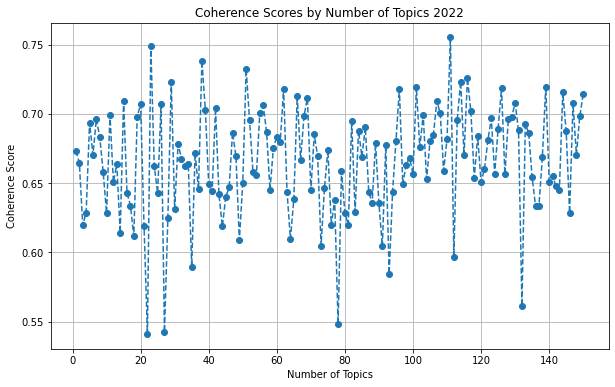

In [254]:
topics_range_2022 = range(1, len(coherence_values_2022) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2022, coherence_values_2022, marker = 'o', linestyle = '--')
plt.title('Coherence Scores by Number of Topics 2022')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

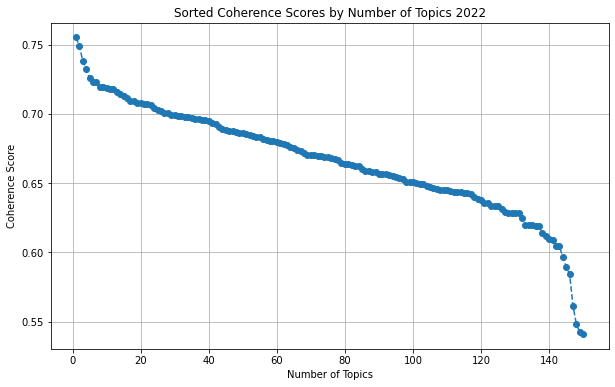

In [255]:
sorted_coherence_values_2022 = sorted(coherence_values_2022, reverse=True)

topics_range_2022 = range(1, len(sorted_coherence_values_2022) + 1)

plt.figure(figsize = (10,6))
plt.plot(topics_range_2022, sorted_coherence_values_2022, marker = 'o', linestyle = '--')
plt.title('Sorted Coherence Scores by Number of Topics 2022')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.grid(True)
plt.show()

In [825]:
df_topic_sents_keywords_2022 = format_topics_sentences(ldamodel = model_desc_2022, corpus = corpus_dec_2022, texts = desc_2022["clean_desc"].tolist())

In [257]:
df_topic_sents_keywords_2022

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Original_Text
0,0,0.1000,"flaw, function, blue, prism, airflow, provider...",nontransparent sharing branch predictor select...
1,0,0.1000,"flaw, function, blue, prism, airflow, provider...",nontransparent sharing branch predictor within...
2,3,0.5500,"sql, memory, firefox, files, request, director...",hardware debug modes processor init setting al...
3,0,0.1000,"flaw, function, blue, prism, airflow, provider...",sensitive information accessible physical prob...
4,7,0.5340,"versions, version, user, users, access, ibm, p...",panos software provides options exclude specif...
...,...,...,...,...
24784,0,0.1000,"flaw, function, blue, prism, airflow, provider...",pilz pmc programming tool 3x 3517 based codesy...
24785,2,0.6708,"versions, prior, tensorflow, code, local, netb...",authentication logic wyze cam pan v2 cam v2 ca...
24786,0,0.1000,"flaw, function, blue, prism, airflow, provider...",issue discovered illumos nexenta nexentastor 4...
24787,0,0.1000,"flaw, function, blue, prism, airflow, provider...",phonesystem terminal 3cx phone system debian b...


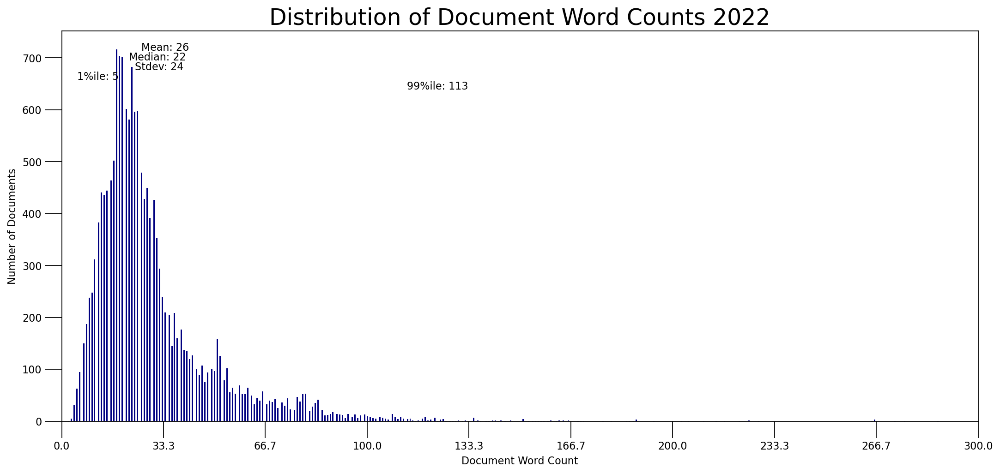

In [258]:
doc_lens_2022 = [len(d.split()) for d in df_topic_sents_keywords_2022.Original_Text]

mean_val_2022 = round(np.mean(doc_lens_2022))
median_val_2022 = round(np.median(doc_lens_2022))
std_val_2022 = round(np.std(doc_lens_2022))
quantile_01_val_2022 = round(np.quantile(doc_lens_2022, q = 0.01))
quantile_99_val_2022 = round(np.quantile(doc_lens_2022, q = 0.99))

plt.figure(figsize = (16,7), dpi = 160)
plt.hist(doc_lens_2020, bins = 1000, color = 'navy')

y_pos = max(plt.gca().get_ylim()) - 0.05 * max(plt.gca().get_ylim())  
spacing = 0.025 * max(plt.gca().get_ylim())  

plt.text(mean_val_2022, y_pos, "Mean: " + str(mean_val_2022))
plt.text(median_val_2022, y_pos - spacing, "Median: " + str(median_val_2022))
plt.text(std_val_2022, y_pos - 2 * spacing, "Stdev: " + str(std_val_2022))
plt.text(quantile_01_val_2022, y_pos - 3 * spacing, "1%ile: " + str(quantile_01_val_2022))
plt.text(quantile_99_val_2022, y_pos - 4 * spacing, "99%ile: " + str(quantile_99_val_2022))

plt.gca().set(xlim = (0, 300), ylabel = 'Number of Documents', xlabel = 'Document Word Count')
plt.tick_params(size = 16)
plt.xticks(np.linspace(0,300,10))
plt.title('Distribution of Document Word Counts 2022', fontdict = dict(size = 22))
plt.show()

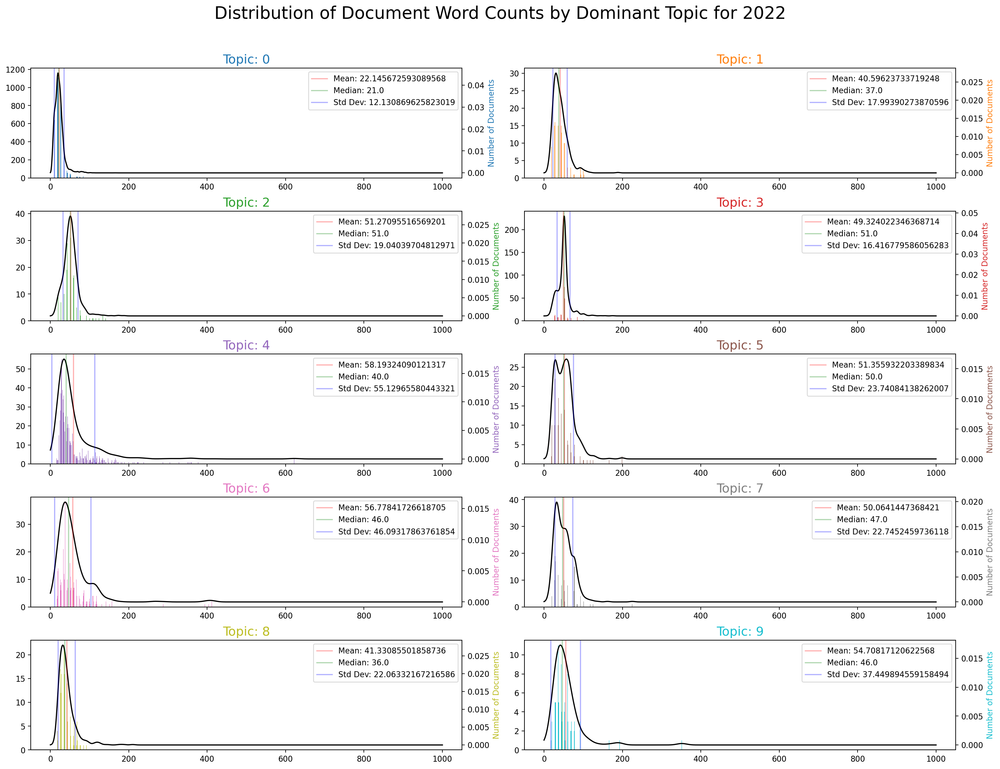

In [826]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
n_topics = 10

plt.figure(figsize=(18, 14), dpi=160)

for i in range(n_topics):
    plt.subplot(5, 2, i + 1)
    df_dominant_topic_sub = df_topic_sents_keywords.loc[df_topic_sents_keywords.Dominant_Topic == i, :]
    doc_lens_2 = [len(d.split()) for d in df_dominant_topic_sub.Original_Text]
    doc_lens_np = np.array(doc_lens_2)

    # Calculate statistics
    mean_val = np.mean(doc_lens_np)
    median_val = np.median(doc_lens_np)
    std_val = np.std(doc_lens_np)

    plt.hist(doc_lens_np, bins=1000, color=cols[i])
    plt.gca().twinx()
    density = gaussian_kde(doc_lens_np)
    xs = np.linspace(0, 1000, 1000)
    plt.plot(xs, density(xs), color='black')

    # Plot statistics
    plt.axvline(mean_val, color='red', linestyle='-', label=f'Mean: {mean_val}', alpha = 0.3)
    plt.axvline(median_val, color='green', linestyle='-', label=f'Median: {median_val}', alpha = 0.3)
    plt.axvline(mean_val + std_val, color='blue', linestyle='-', label=f'Std Dev: {std_val}', alpha = 0.3)
    plt.axvline(mean_val - std_val, color='blue', linestyle='-', alpha = 0.3)

    plt.xlabel('Document Word Count')
    plt.ylabel('Number of Documents', color=cols[i])
    plt.title(f'Topic: {i}', fontdict=dict(size=16, color=cols[i]))
    plt.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle('Distribution of Document Word Counts by Dominant Topic for 2022', fontsize=22)
plt.show()

In [260]:
topics_2022 = model_desc_2022.show_topics(num_topics=10,formatted = False)
data_flat_2022 = [w for desc in desc_2022["clean_desc"].dropna() for w in str(desc).split()]
counter = Counter(data_flat_2022)

out = []
for i, topic in topics_2022:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df_2022 = pd.DataFrame(out, columns = ['word', 'topic_id', 'importance', 'word_count'])

<ipython-input-261-ba9d91a43895>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_2022.loc[df_2022.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


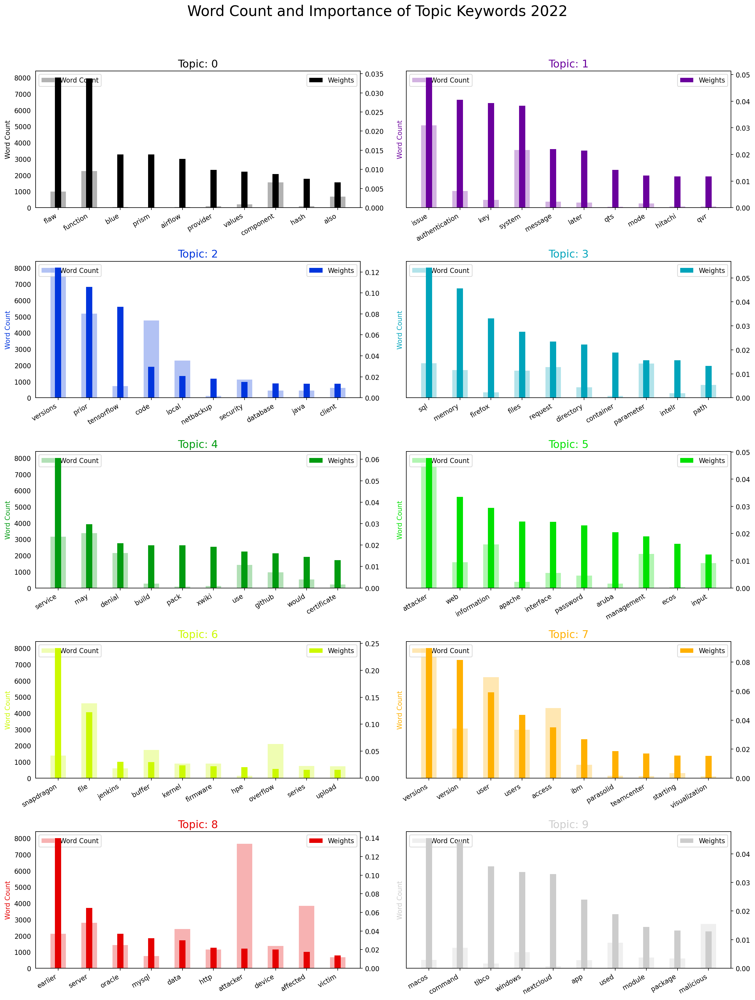

In [261]:
fig, axes = plt.subplots(5, 2, figsize = (16,20), sharey = True, dpi = 160)  
cols = get_colormap_colors(n_topics)
for i, ax in enumerate(axes.flatten()):
    if i >= len(topics_2022):  
        ax.axis('off') 
        continue
    ax.bar(x = 'word', height = "word_count", data = df_2022.loc[df_2022.topic_id == i, :], color = cols[i % len(cols)], width = 0.5, alpha = 0.3, label = 'Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x = 'word', height = "importance", data = df_2022.loc[df_2022.topic_id == i, :], color = cols[i % len(cols)], width = 0.2, label = 'Weights')
    ax.set_ylabel('Word Count', color = cols[i % len(cols)])
    ax.set_title('Topic: ' + str(i), color = cols[i % len(cols)], fontsize = 16)
    ax.tick_params(axis = 'y', left = False)
    ax.set_xticklabels(df_2022.loc[df_2022.topic_id == i, 'word'], rotation = 30, horizontalalignment = 'right')
    ax.legend(loc = 'upper left'); ax_twin.legend(loc = 'upper right')

fig.tight_layout(w_pad = 2)    
fig.suptitle('Word Count and Importance of Topic Keywords 2022', fontsize = 22, y = 1.05)    
plt.show()

In [262]:
dominant_topics_2022, topic_percentages_2022 = topics_per_document(model = model_desc_2022, corpus = corpus_dec_2022, end = -1)

In [263]:
df_2_2022 = pd.DataFrame(dominant_topics_2022, columns = ['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc_2022 = df_2_2022.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_2022 = dominant_topic_in_each_doc_2022.to_frame(name = 'count').reset_index()

In [264]:
topic_weightage_by_doc_2022 = pd.DataFrame([dict(t) for t in topic_percentages_2022])
df_topic_weightage_by_doc_2022 = topic_weightage_by_doc_2022.sum().to_frame(name = 'count').reset_index()

In [265]:
topic_top3words_2022 = [(i, topic) for i, topics in model_desc_2022.show_topics(formatted = False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked_2022 = pd.DataFrame(topic_top3words_2022, columns = ['topic_id', 'words'])
df_top3words_2022 = df_top3words_stacked_2022.groupby('topic_id').agg(','.join)
df_top3words_2022.reset_index(level = 0,inplace = True)

In [266]:
df_top3words_2022

,topic_id,words
0,0,"flaw,function,blue"
1,1,"issue,authentication,key"
2,2,"versions,prior,tensorflow"
3,3,"sql,memory,firefox"
4,4,"service,may,denial"
5,5,"attacker,web,information"
6,6,"snapdragon,file,jenkins"
7,7,"versions,version,user"
8,8,"earlier,server,oracle"
9,9,"macos,command,tibco"


In [876]:
topic_weights_2022 = []

for row_list in model_desc_2022[corpus_dec_2022]:
    weights = []
    
    for item in row_list:
        _, weight = item  
        weights.append(weight)
    
    topic_weights_2022.append(weights)

In [877]:
arr_2022 = pd.DataFrame(topic_weights_2022).fillna(0).values

arr_2022 = arr_2022[np.amax(arr_2022, axis = 1) > 0.35]

In [878]:
topic_num_2022 = np.argmax(arr_2022, axis = 1)

In [879]:
# t-SNE Model
tsne_model_2022 = TSNE(n_components = 2, verbose = 1, random_state = 6, angle = .99, init = 'pca')
tsne_lda_2022 = tsne_model_2022.fit_transform(arr_2022)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4182 samples in 0.008s...
[t-SNE] Computed neighbors for 4182 samples in 0.396s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4182
[t-SNE] Computed conditional probabilities for sample 2000 / 4182
[t-SNE] Computed conditional probabilities for sample 3000 / 4182
[t-SNE] Computed conditional probabilities for sample 4000 / 4182
[t-SNE] Computed conditional probabilities for sample 4182 / 4182
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.292763
[t-SNE] KL divergence after 1000 iterations: 0.246972


In [880]:
n_topics = 10
mycolors = get_colormap_colors(n_topics)
mycolors_hex = [rgba_to_hex(color) for color in mycolors]
source = ColumnDataSource(data = dict(
    x = tsne_lda_2022[:, 0],
    y = tsne_lda_2022[:, 1],
    topic = topic_num_2022,
    color = [mycolors_hex[i] for i in topic_num_2022]
))

hover = HoverTool(tooltips=[("Topic", "@topic")])

mapper = linear_cmap(field_name = 'topic', palette = mycolors_hex, low = min(topic_num_2022), high = max(topic_num_2022))

p = figure(width = 900, height = 700, title = "t-SNE Clustering of {} LDA Topics 2022".format(n_topics))
p.scatter(x = 'x', y = 'y', source = source, size = 8, color = 'color', legend_field = 'topic', fill_alpha = 0.6)
p.add_tools(hover)

output_notebook()
show(p)

Loading BokehJS ...

In [352]:
X_train, X_test, y_train, y_test = train_test_split(df_mega_2["clean_description"], df_mega_2["label"], test_size = 0.3, random_state = 6, stratify = df_mega_2["label"])

In [483]:
print(X_train.shape)

(59412,)


In [273]:
def get_topic_distribution_for_descriptions(lda_model, descriptions):
    
    vectorizer_desc = CountVectorizer()
    
    dtm_desc = vectorizer_desc.fit_transform(descriptions)
    
    corpus_desc = Sparse2Corpus(dtm_desc.T)
    
    topic_distributions = [lda_model[d] for d in corpus_desc]
    
    dense_topic_distributions = np.zeros((len(descriptions), lda_model.num_topics))
    
    for i, doc_topics in enumerate(topic_distributions):
        for topic, prob in doc_topics:
            dense_topic_distributions[i, topic] = prob

    return dense_topic_distributions

In [275]:
class LDATransformer(BaseEstimator, TransformerMixin):
    def __init__(self, lda_model = None, num_topics = 10):
        self.num_topics = num_topics
        self.lda_model = lda_model
        self.vectorizer = CountVectorizer()

    def fit(self, X, y = None):
        if not self.lda_model:
            
            dtm_desc = self.vectorizer.fit_transform(X)
            
            id2word_desc = {v: k for k, v in self.vectorizer.vocabulary_.items()}
            
            corpus_desc = Sparse2Corpus(dtm_desc.T)
            
            self.lda_model = LdaModel(corpus = corpus_desc, num_topics = self.num_topics, id2word = id2word_desc, passes = 15)
        return self

    def transform(self, X):
        if self.lda_model is None:
            raise ValueError("LDA model not trained!")
        return get_topic_distribution_for_descriptions(self.lda_model, X)

In [478]:
X = df_mega_2["clean_description"]
y = df_mega_2["label"]

### Dummy Classifier

In [376]:
dummy = DummyClassifier(strategy = "most_frequent")

In [378]:
dummy.fit(X_train, y_train)
y_pred_dum = dummy.predict(X_test)

In [476]:
print("Accuracy :", accuracy_score(y_test, y_pred))

Accuracy : 0.45425166633003433


In [379]:
print(classification_report(y_test, y_pred_dum))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2241
           1       0.42      1.00      0.59      6218
           2       0.00      0.00      0.00       310
           3       0.00      0.00      0.00      6084

    accuracy                           0.42     14853
   macro avg       0.10      0.25      0.15     14853
weighted avg       0.18      0.42      0.25     14853



C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Logistic Regression

In [881]:
combined_features = FeatureUnion([
    ('tfidf', TfidfVectorizer()), 
    ('lda', LDATransformer(lda_model = lda_model_desc))
])

pipeline_lr = Pipeline([
    ('features', combined_features), 
    ('clf', LogisticRegression(max_iter = 1000, multi_class = 'multinomial', solver = 'lbfgs'))
])

## tried k fold sampling

In [882]:
skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 6)

In [883]:
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    pipeline_lr.fit(X_train, y_train)

    y_pred = pipeline_lr.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    pres = precision_score(y_test, y_pred, average = 'weighted')
    recall = recall_score(y_test, y_pred, average = 'weighted')
    f1_score = f1_metric(y_test, y_pred, average = 'weighted')
    print("Accuracy Score for this fold:", accuracy)
    print("Prescision Score for this fold:", pres)
    print("Recall Score for this fold:", recall)
    print("F1 Score for this fold:", f1_score)
    print("Next fold")

Accuracy Score for this fold: 0.45425166633003433
Prescision Score for this fold: 0.49769180536494334
Recall Score for this fold: 0.45425166633003433
F1 Score for this fold: 0.3588787744130632
Next fold
Accuracy Score for this fold: 0.45472295159227094
Prescision Score for this fold: 0.5113854858768332
Recall Score for this fold: 0.45472295159227094
F1 Score for this fold: 0.356291825889596
Next fold
Accuracy Score for this fold: 0.45290513700935836
Prescision Score for this fold: 0.5211640097214759
Recall Score for this fold: 0.45290513700935836
F1 Score for this fold: 0.35429099516282275
Next fold
Accuracy Score for this fold: 0.4582239278260284
Prescision Score for this fold: 0.5273669483495551
Recall Score for this fold: 0.4582239278260284
F1 Score for this fold: 0.3629874863869436
Next fold
Accuracy Score for this fold: 0.4539823604658991
Prescision Score for this fold: 0.5018799372884079
Recall Score for this fold: 0.4539823604658991
F1 Score for this fold: 0.3579126423879637
Nex

In [884]:
pipeline_lr.fit(X_train, y_train)
y_pred = pipeline_lr.predict(X_test)

In [885]:
accuracy = accuracy_score(y_test, y_pred)
pres = precision_score(y_test, y_pred, average = 'weighted')
recall = recall_score(y_test, y_pred, average = 'weighted')
f1_score = f1_metric(y_test, y_pred, average = 'weighted')

print("Accuracy :", accuracy)
print("Prescision :", pres)
print("Recall :", recall)
print("F1_Score :", f1_score)

Accuracy : 0.45431899279606813
Prescision : 0.5022978824933066
Recall : 0.45431899279606813
F1_Score : 0.3583295676065244


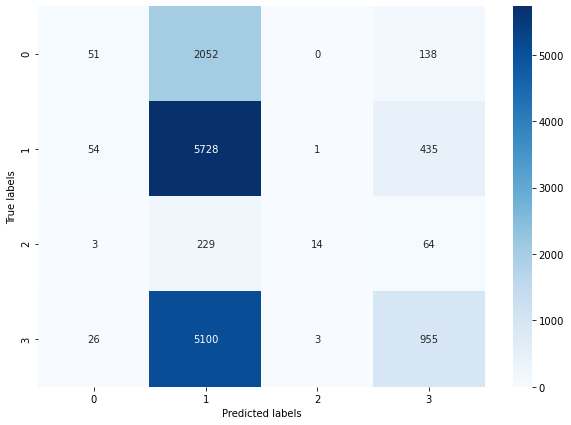

In [886]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (10, 7))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

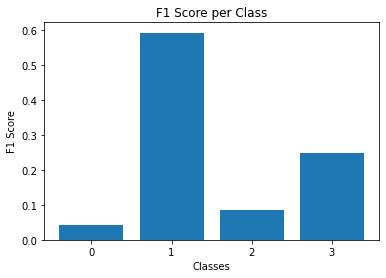

In [887]:
f1_scores = [f1_metric(y_test, y_pred, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [888]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.38      0.02      0.04      2241
           1       0.44      0.92      0.59      6218
           2       0.78      0.05      0.09       310
           3       0.60      0.16      0.25      6084

    accuracy                           0.45     14853
   macro avg       0.55      0.29      0.24     14853
weighted avg       0.50      0.45      0.36     14853



### Logistic Regression L1

In [889]:
pipeline_lr1 = Pipeline([
    ('features', combined_features), 
    ('clf', LogisticRegression(max_iter = 1000, multi_class = 'multinomial', penalty = 'l1', solver = 'saga', random_state = 6))
])


In [890]:
pipeline_lr1.fit(X_train, y_train)
y_pred_lr1 = pipeline_lr1.predict(X_test)

In [891]:
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    pipeline_lr1.fit(X_train, y_train)

    y_pred = pipeline_lr1.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    pres = precision_score(y_test, y_pred, average = 'weighted')
    recall = recall_score(y_test, y_pred, average = 'weighted')
    f1_score = f1_metric(y_test, y_pred, average = 'weighted')
    print("Accuracy Score for this fold:", accuracy)
    print("Prescision Score for this fold:", pres)
    print("Recall Score for this fold:", recall)
    print("F1 Score for this fold:", f1_score)
    print("Next fold")

Accuracy Score for this fold: 0.4519625664848852
Prescision Score for this fold: 0.49797509555476577
Recall Score for this fold: 0.4519625664848852
F1 Score for this fold: 0.35417695523099624
Next fold
Accuracy Score for this fold: 0.4525685046791894
Prescision Score for this fold: 0.5100935374254622
Recall Score for this fold: 0.4525685046791894
F1 Score for this fold: 0.35139102876596096
Next fold
Accuracy Score for this fold: 0.44825961085302635
Prescision Score for this fold: 0.5049555879365571
Recall Score for this fold: 0.44825961085302635
F1 Score for this fold: 0.34853905821912146
Next fold
Accuracy Score for this fold: 0.4550595839224399
Prescision Score for this fold: 0.5215538596087684
Recall Score for this fold: 0.4550595839224399
F1 Score for this fold: 0.3584170823682797
Next fold
Accuracy Score for this fold: 0.45303978994142596
Prescision Score for this fold: 0.5080329191113269
Recall Score for this fold: 0.45303978994142596
F1 Score for this fold: 0.3536842307522462
Ne

In [892]:
accuracy_lr1 = accuracy_score(y_test, y_pred_lr1)
pres_lr1 = precision_score(y_test, y_pred_lr1, average = 'weighted')
recall_lr1 = recall_score(y_test, y_pred_lr1, average = 'weighted')
f1_score_lr1 = f1_metric(y_test, y_pred_lr1, average = 'weighted')

print("Accuracy :", accuracy_lr1)
print("Prescision :", pres_lr1)
print("Recall :", recall_lr1)
print("F1_Score :", f1_score_lr1)

Accuracy : 0.452703157611257
Prescision : 0.5082004179638828
Recall : 0.452703157611257
F1_Score : 0.35305832834240364


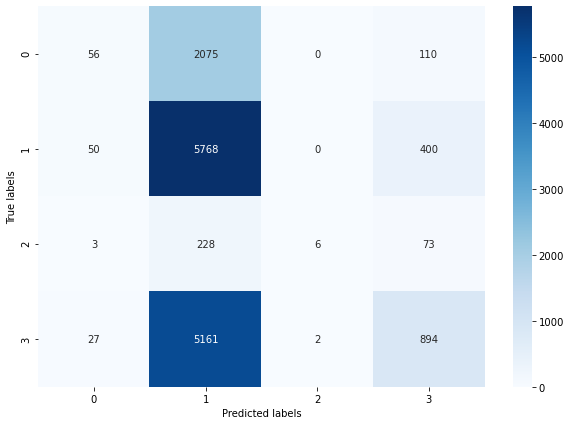

In [893]:
cm_l1 = confusion_matrix(y_test, y_pred_lr1)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_l1, annot = True, cmap = 'Blues', fmt = 'g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

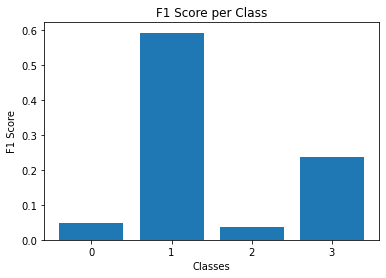

In [894]:
f1_scores_l1 = [f1_metric(y_test, y_pred_lr1, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_l1)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [895]:
print(classification_report(y_test, y_pred_lr1))

              precision    recall  f1-score   support

           0       0.41      0.02      0.05      2241
           1       0.44      0.93      0.59      6218
           2       0.75      0.02      0.04       310
           3       0.61      0.15      0.24      6084

    accuracy                           0.45     14853
   macro avg       0.55      0.28      0.23     14853
weighted avg       0.51      0.45      0.35     14853



### Logistic Regression L2

In [896]:
pipeline_lr2 = Pipeline([
    ('features', combined_features), 
    ('clf', LogisticRegression(max_iter = 1000, multi_class = 'multinomial', penalty = 'l2', solver = 'lbfgs', random_state = 6))
])

In [897]:
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    pipeline_lr2.fit(X_train, y_train)

    y_pred = pipeline_lr2.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    pres = precision_score(y_test, y_pred, average = 'weighted')
    recall = recall_score(y_test, y_pred, average = 'weighted')
    f1_score = f1_metric(y_test, y_pred, average = 'weighted')
    print("Accuracy Score for this fold:", accuracy)
    print("Prescision Score for this fold:", pres)
    print("Recall Score for this fold:", recall)
    print("F1 Score for this fold:", f1_score)
    print("Next fold")

Accuracy Score for this fold: 0.4537803810677978
Prescision Score for this fold: 0.4966197264480346
Recall Score for this fold: 0.4537803810677978
F1 Score for this fold: 0.3582590081266082
Next fold
Accuracy Score for this fold: 0.45479027805830474
Prescision Score for this fold: 0.5132818173478655
Recall Score for this fold: 0.45479027805830474
F1 Score for this fold: 0.35644795789986733
Next fold
Accuracy Score for this fold: 0.45283781054332456
Prescision Score for this fold: 0.5210142640276221
Recall Score for this fold: 0.45283781054332456
F1 Score for this fold: 0.3542107074326866
Next fold
Accuracy Score for this fold: 0.4581566013599946
Prescision Score for this fold: 0.5274825228711132
Recall Score for this fold: 0.4581566013599946
F1 Score for this fold: 0.36295082310855425
Next fold
Accuracy Score for this fold: 0.45418433986400053
Prescision Score for this fold: 0.501801394105016
Recall Score for this fold: 0.45418433986400053
F1 Score for this fold: 0.3580243271836661
Nex

In [898]:
pipeline_lr2.fit(X_train, y_train)
y_pred_lr2 = pipeline_lr2.predict(X_test)

In [899]:
accuracy_lr2 = accuracy_score(y_test, y_pred_lr2)
pres_lr2 = precision_score(y_test, y_pred_lr2, average = 'weighted')
recall_lr2 = recall_score(y_test, y_pred_lr2, average = 'weighted')
f1_score_lr2 = f1_metric(y_test, y_pred_lr2, average = 'weighted')

print("Accuracy :", accuracy_lr2)
print("Prescision :", pres_lr2)
print("Recall :", recall_lr2)
print("F1_Score :", f1_score_lr2)

Accuracy : 0.4540496869319329
Prescision : 0.5016647002214975
Recall : 0.4540496869319329
F1_Score : 0.358092023698918


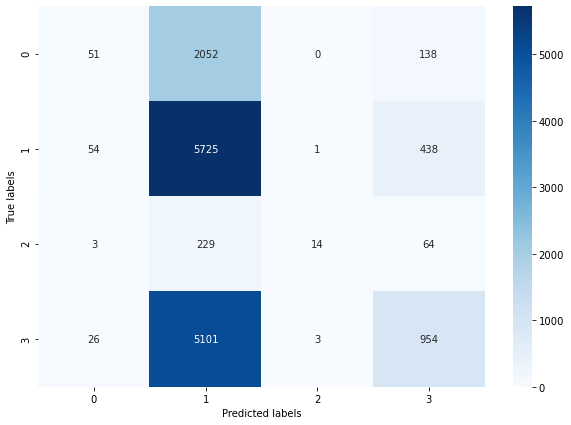

In [900]:
cm_l2 = confusion_matrix(y_test, y_pred_lr2)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_l2, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

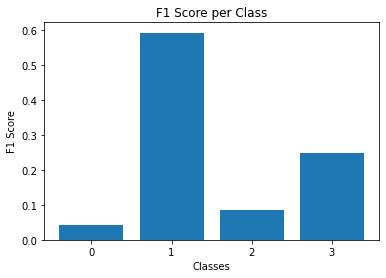

In [901]:
f1_scores_l2 = [f1_metric(y_test, y_pred_lr2, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_l2)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [902]:
print(classification_report(y_test, y_pred_lr2))

              precision    recall  f1-score   support

           0       0.38      0.02      0.04      2241
           1       0.44      0.92      0.59      6218
           2       0.78      0.05      0.09       310
           3       0.60      0.16      0.25      6084

    accuracy                           0.45     14853
   macro avg       0.55      0.29      0.24     14853
weighted avg       0.50      0.45      0.36     14853



### Logistic Regression L1-2

In [903]:
pipeline_lr12 = Pipeline([
    ('features', combined_features), 
    ('clf', LogisticRegression(max_iter = 1000, penalty = 'elasticnet', solver = 'saga', l1_ratio = 0.5, random_state = 6))
])

In [904]:
pipeline_lr12.fit(X_train, y_train)
y_pred_lr12 = pipeline_lr12.predict(X_test)

In [905]:
accuracy_lr12 = accuracy_score(y_test, y_pred_lr12)
pres_lr12 = precision_score(y_test, y_pred_lr12, average = 'weighted')
recall_lr12 = recall_score(y_test, y_pred_lr12, average = 'weighted')
f1_score_lr12 = f1_metric(y_test, y_pred_lr12, average = 'weighted')

print("Accuracy :", accuracy_lr12)
print("Prescision :", pres_lr12)
print("Recall :", recall_lr12)
print("F1_Score :", f1_score_lr12)

Accuracy : 0.4536457281357302
Prescision : 0.5037824140034205
Recall : 0.4536457281357302
F1_Score : 0.35607445535426396


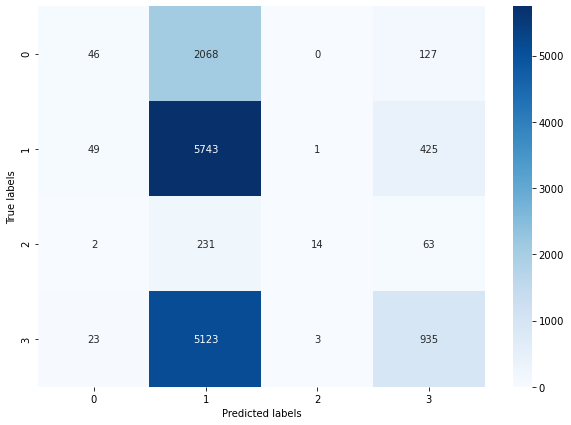

In [906]:
cm_l12 = confusion_matrix(y_test, y_pred_lr12)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_l12, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

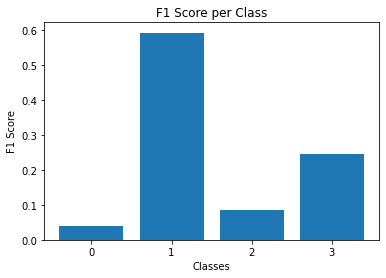

In [907]:
f1_scores_l12 = [f1_metric(y_test, y_pred_lr12, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_l12)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [908]:
print(classification_report(y_test, y_pred_lr2))

              precision    recall  f1-score   support

           0       0.38      0.02      0.04      2241
           1       0.44      0.92      0.59      6218
           2       0.78      0.05      0.09       310
           3       0.60      0.16      0.25      6084

    accuracy                           0.45     14853
   macro avg       0.55      0.29      0.24     14853
weighted avg       0.50      0.45      0.36     14853



### Descision Tree

In [909]:
pipeline_dt = Pipeline([
    ('features', combined_features), 
    ('clf', DecisionTreeClassifier(random_state = 6))
])

In [910]:
pipeline_dt.fit(X_train, y_train)
y_pred_dt = pipeline_dt.predict(X_test)

In [911]:
accuracy_dt = accuracy_score(y_test, y_pred_dt)
pres_dt = precision_score(y_test, y_pred_dt, average = 'weighted')
recall_dt = recall_score(y_test, y_pred_dt, average = 'weighted')
f1_score_dt = f1_metric(y_test, y_pred_dt, average = 'weighted')

print("Accuracy :", accuracy_dt)
print("Prescision :", pres_dt)
print("Recall :", recall_dt)
print("F1_Score :", f1_score_dt)

Accuracy : 0.4299468120918333
Prescision : 0.43683449314291833
Recall : 0.4299468120918333
F1_Score : 0.32608542677384633


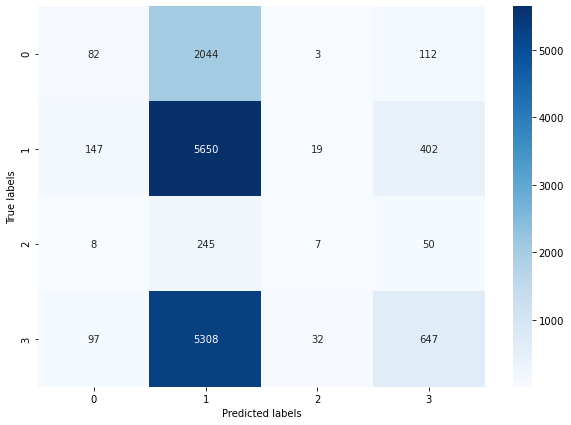

In [912]:
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_dt, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

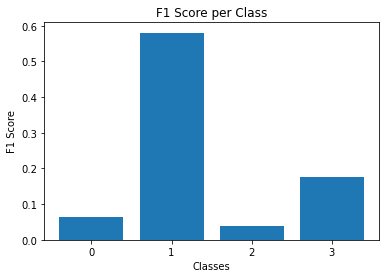

In [913]:
f1_scores_dt = [f1_metric(y_test, y_pred_dt, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_dt)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [914]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.25      0.04      0.06      2241
           1       0.43      0.91      0.58      6218
           2       0.11      0.02      0.04       310
           3       0.53      0.11      0.18      6084

    accuracy                           0.43     14853
   macro avg       0.33      0.27      0.21     14853
weighted avg       0.44      0.43      0.33     14853



### Random Forest

In [915]:
pipeline_rf = Pipeline([
    ('features', combined_features), 
    ('clf', RandomForestClassifier(n_estimators = 100, random_state = 6))
])

In [916]:
pipeline_rf.fit(X_train, y_train)
y_pred_rf = pipeline_rf.predict(X_test)

In [917]:
accuracy_rf = accuracy_score(y_test, y_pred_rf)
pres_rf = precision_score(y_test, y_pred_rf, average = 'weighted')
recall_rf = recall_score(y_test, y_pred_rf, average = 'weighted')
f1_score_rf = f1_metric(y_test, y_pred_rf, average = 'weighted')

print("Accuracy :", accuracy_rf)
print("Prescision :", pres_rf)
print("Recall :", recall_rf)
print("F1_Score :", f1_score_rf)

Accuracy : 0.4424022083080859
Prescision : 0.4648653023866855
Recall : 0.4424022083080859
F1_Score : 0.3429019252305943


C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


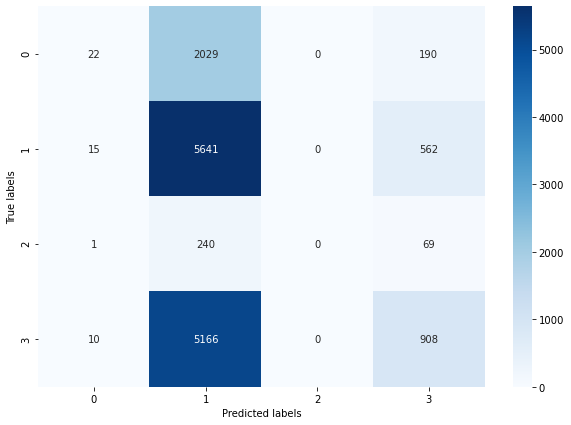

In [918]:
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_rf, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

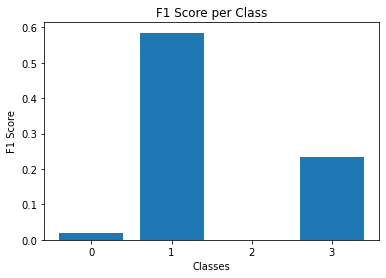

In [919]:
f1_scores_rf = [f1_metric(y_test, y_pred_rf, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_rf)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [920]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.46      0.01      0.02      2241
           1       0.43      0.91      0.58      6218
           2       0.00      0.00      0.00       310
           3       0.53      0.15      0.23      6084

    accuracy                           0.44     14853
   macro avg       0.35      0.27      0.21     14853
weighted avg       0.46      0.44      0.34     14853



C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Support Vector Machines

In [921]:
pipeline_svm = Pipeline([
    ('features', combined_features), 
    ('clf', SVC(kernel = 'linear', C = 1, probability = True, random_state = 6))
])

In [922]:
pipeline_svm.fit(X_train, y_train)
y_pred_svm = pipeline_svm.predict(X_test)

In [923]:
accuracy_svm = accuracy_score(y_test, y_pred_svm)
pres_svm = precision_score(y_test, y_pred_svm, average = 'weighted')
recall_svm = recall_score(y_test, y_pred_svm, average = 'weighted')
f1_score_svm = f1_metric(y_test, y_pred_svm, average = 'weighted')

print("Accuracy :", accuracy_svm)
print("Prescision :", pres_svm)
print("Recall :", recall_svm)
print("F1_Score :", f1_score_svm)

Accuracy : 0.45438631926210193
Prescision : 0.5165199308844407
Recall : 0.45438631926210193
F1_Score : 0.35551100751987635


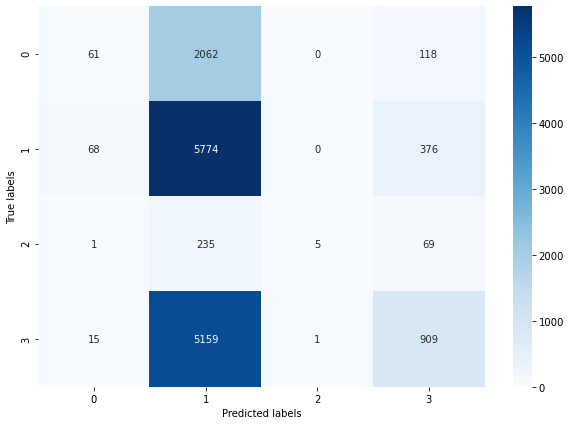

In [924]:
cm_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize = (10, 7))
sns.heatmap(cm_svm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

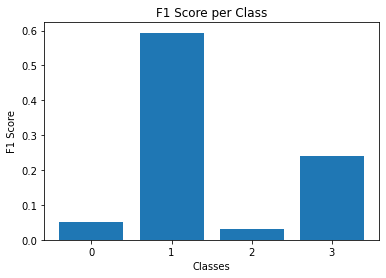

In [925]:
f1_scores_svm = [f1_metric(y_test, y_pred_svm, labels = [i], average='weighted') for i in range(4)]

plt.bar(range(4), f1_scores_svm)
plt.xticks(range(4))
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score per Class')
plt.show()

In [926]:
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.42      0.03      0.05      2241
           1       0.44      0.93      0.59      6218
           2       0.83      0.02      0.03       310
           3       0.62      0.15      0.24      6084

    accuracy                           0.45     14853
   macro avg       0.58      0.28      0.23     14853
weighted avg       0.52      0.45      0.36     14853



### LSTM LDA

In [380]:
document_topic_dists = [lda_model_desc.get_document_topics(doc_bow) for doc_bow in lda_corpus_dec]

In [381]:
document_topic_matrix = np.zeros((len(document_topic_dists), 10))

In [382]:
for idx, doc_topics in enumerate(document_topic_dists):
    for topic_id, proportion in doc_topics:
        document_topic_matrix[idx, topic_id] = proportion

In [383]:
print(document_topic_matrix.shape)

(74265, 10)


In [386]:
document_topic_dists_tensor = torch.tensor(document_topic_matrix, dtype=torch.float32)

In [387]:
def tokens_to_ids(tokens):
    token_ids = [] 

    for token in tokens:

        if token in vocab:
            token_ids.append(vocab[token])
        else:
            token_ids.append(vocab["<UNK>"])
            
    return token_ids

In [388]:
word_freq = Counter()

for z in df_mega_2["tokens"]:
    for y in z:
        word_freq[y] += 1

In [389]:
vocab = {}
for idx, (word, freq) in enumerate(word_freq.items()):
    if freq >= 3:
        vocab[word] = idx

vocab["<PAD>"] = 0
vocab["<UNK>"] = len(vocab)

In [409]:
len(vocab)

4827

In [390]:
df_mega_2["token_ids"] = df_mega_2["tokens"].apply(tokens_to_ids)

In [391]:
MAX_SEQ_LEN = 100

def pad_sequence(seq, maxlen = MAX_SEQ_LEN):
    return seq[:maxlen] + [vocab["<PAD>"]] * (maxlen - len(seq))

In [392]:
df_mega_2["token_ids_padded"] = df_mega_2["token_ids"].apply(pad_sequence)

In [418]:
max_token_id = df_mega_2["token_ids_padded"].apply(max).max()
min_token_id = df_mega_2["token_ids_padded"].apply(min).min()
print(f'Max token ID: {max_token_id}')
print(f'Min token ID: {min_token_id}')

Max token ID: 4824
Min token ID: 0


In [393]:
class TextDataset(Dataset):
    def __init__(self, token_ids, labels, lda_topic_dists):
        self.token_ids = token_ids
        self.labels = labels
        self.lda_topic_dists = lda_topic_dists

    def __len__(self):
        return len(self.token_ids)

    def __getitem__(self, idx):
        token_tensor = torch.tensor(self.token_ids[idx], dtype=torch.long)
        label_tensor = torch.tensor(self.labels[idx], dtype=torch.long) 
        lda_tensor = torch.tensor(self.lda_topic_dists[idx], dtype=torch.float)
        return token_tensor, label_tensor, lda_tensor

In [398]:
sss = StratifiedShuffleSplit(n_splits = 1, test_size = 0.2, random_state = 6)

for temp_train_idx, test_idx in sss.split(df_mega_2["token_ids_padded"].tolist(), df_mega_2["label"].tolist()):
    
    temp_train_texts = [df_mega_2["token_ids_padded"].tolist()[i] for i in temp_train_idx]
    
    temp_train_labels = [df_mega_2["label"].tolist()[i] for i in temp_train_idx]
    
    temp_train_lda_dists = [document_topic_dists_tensor.numpy()[i] for i in temp_train_idx]

    test_texts = [df_mega_2["token_ids_padded"].tolist()[i] for i in test_idx]
    test_labels = [df_mega_2["label"].tolist()[i] for i in test_idx]
    test_lda_dists = [document_topic_dists_tensor.numpy()[i] for i in test_idx]

In [399]:
sss1 = StratifiedShuffleSplit(n_splits = 1, test_size = 0.25, random_state = 6)  

for train_idx, val_idx in sss1.split(temp_train_texts, temp_train_labels):
    train_texts = [temp_train_texts[i] for i in train_idx]
    train_labels = [temp_train_labels[i] for i in train_idx]
    train_lda_dists = [temp_train_lda_dists[i] for i in train_idx]

    val_texts = [temp_train_texts[i] for i in val_idx]
    val_labels = [temp_train_labels[i] for i in val_idx]
    val_lda_dists = [temp_train_lda_dists[i] for i in val_idx]

In [400]:
train_dataset = TextDataset(train_texts, train_labels, train_lda_dists)
val_dataset = TextDataset(val_texts, val_labels, val_lda_dists)
test_dataset = TextDataset(test_texts, test_labels, test_lda_dists)

In [401]:
train_dataloader = DataLoader(train_dataset, batch_size = 64, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = 64, shuffle = False) 
test_dataloader = DataLoader(test_dataset, batch_size = 64, shuffle = False)

In [422]:
class LDA_LSTM_Model(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, vocab_size, num_topics, output_dim_keywords):
        super(LDA_LSTM_Model, self).__init__()
        
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim)
        
        # Compute combined_size
        lstm_output_size = hidden_dim
        lda_topic_dist_size = num_topics  
        combined_size = lstm_output_size + lda_topic_dist_size
        
        self.fc1 = nn.Linear(combined_size, 4)  
        self.fc2 = nn.Linear(combined_size, output_dim_keywords) 
        
    def forward(self, text, lda_topic_dist):
        embedded = self.embedding(text)
        lstm_out, _ = self.lstm(embedded)
        lstm_out = lstm_out[:, -1, :]  
        #print("LSTM Output Size:", lstm_out.shape)
        #print("lda_topic_dist shape",lda_topic_dist.shape)
        combined_out = torch.cat((lstm_out, lda_topic_dist), dim=1)
        #print("combined_out shape:", combined_out.shape)
        severity = self.fc1(combined_out)
        keywords = F.softmax(self.fc2(combined_out), dim = 1)

        return severity, keywords

In [423]:
num_embeddings = max_token_id + 1

In [430]:
lstm_model = LDA_LSTM_Model(embedding_dim = num_embeddings, hidden_dim = 120, vocab_size = 5000, num_topics = 10, output_dim_keywords = 1000)

In [460]:
lstm_criterion = nn.CrossEntropyLoss()
lstm_optimizer = torch.optim.Adam(lstm_model.parameters(), lr = 0.001625, betas=(0.9, 0.999))

In [461]:
ROOT = r"C:/Users/Dell/Documents/Jupyter/Dissertation/"
results_path_lstm = ROOT + "resultl"

In [462]:
def train_model(load, model, optimizer, criterion):
    model.train()
    total_loss, correct, total = 0, 0, 0
    
    for data in load:
        inputs, labels, lda_dists = data
        
        optimizer.zero_grad()
        
        severity_output, keywords_output = model(inputs, lda_dists)
        
        loss = criterion(severity_output, labels) 
        
        loss.backward()
        
        optimizer.step()
        
        pred = severity_output.data.max(1)[1]
        
        correct += pred.eq(labels.data).sum()
        
        total += severity_output.size(0)
        
        total_loss += loss.data.item()

    avg_loss = total_loss / len(load)
    
    acc = correct / total
    
    return avg_loss, acc

In [463]:
def validate_model(load, model, criterion):
    model.eval()
    val_loss, correct, total = 0, 0, 0
    
    with torch.no_grad():
        for inputs, labels, lda_dists in load:
            
            severity_output, keywords_output = model(inputs, lda_dists)
            
            loss = criterion(severity_output, labels)
            
            pred = severity_output.data.max(1)[1]
            
            correct += pred.eq(labels.data).sum()
            
            total += labels.size(0)
            
            val_loss += loss.data.item()

    avg_val_loss = val_loss / len(load)
    
    val_acc = correct / total

    return avg_val_loss, val_acc

In [464]:
train_loss = []
train_acc = []
val_loss = []
val_acc = []
epochs = 10
for epoch in range(epochs):
    tloss, tacc = train_model(train_dataloader, lstm_model, lstm_optimizer, lstm_criterion)
    vloss, vacc = validate_model(val_dataloader, lstm_model, lstm_criterion)
    
    print(f"Epoch {epoch} Training loss: {tloss} Training accuracy: {tacc: .1%} Validation loss: {vloss} Validation accuracy: {vacc: .1%}")
    
    train_loss.append(tloss)
    train_acc.append(tacc)
    val_loss.append(vloss)
    val_acc.append(vacc)
    
torch.save(lstm_model.state_dict(), results_path_lstm)


Epoch 0 Training loss: 1.0952443235915907 Training accuracy:  42.2% Validation loss: 1.0951604303372264 Validation accuracy:  42.1%
Epoch 1 Training loss: 1.0942822454478511 Training accuracy:  42.8% Validation loss: 1.0962057991089227 Validation accuracy:  42.1%
Epoch 2 Training loss: 1.0938115066059009 Training accuracy:  42.7% Validation loss: 1.0991600347690829 Validation accuracy:  42.8%
Epoch 3 Training loss: 1.0932502696982758 Training accuracy:  42.5% Validation loss: 1.0961016043061351 Validation accuracy:  42.1%
Epoch 4 Training loss: 1.0936712281433718 Training accuracy:  42.5% Validation loss: 1.0941753929776694 Validation accuracy:  42.9%
Epoch 5 Training loss: 1.0933288283635416 Training accuracy:  42.4% Validation loss: 1.0930192439852866 Validation accuracy:  43.0%
Epoch 6 Training loss: 1.0934088169416705 Training accuracy:  42.6% Validation loss: 1.0997565621470178 Validation accuracy:  42.2%
Epoch 7 Training loss: 1.0928412607444753 Training accuracy:  42.5% Validati

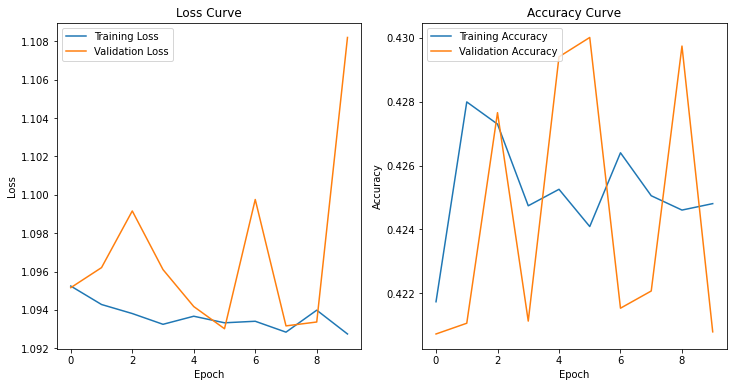

In [465]:
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_loss, label = 'Training Loss')
plt.plot(val_loss, label = 'Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_acc, label = 'Training Accuracy')
plt.plot(val_acc, label = 'Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve')
plt.legend()

plt.show()

In [466]:
model_load = LDA_LSTM_Model(embedding_dim = num_embeddings, hidden_dim = 120, vocab_size = 5000, num_topics = 10, output_dim_keywords = 1000)
model_load.load_state_dict(torch.load(results_path_lstm))
model_load.eval()

LDA_LSTM_Model(
  (embedding): Embedding(5000, 4825)
  (lstm): LSTM(4825, 120)
  (fc1): Linear(in_features=130, out_features=4, bias=True)
  (fc2): Linear(in_features=130, out_features=1000, bias=True)
)

In [467]:
all_predictions = []
all_labels = []
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels, lda_dists in test_dataloader:
        severity_output, keywords_output = model_load(inputs, lda_dists)
        
        # Get the predicted class (For the severity output)
        _, predicted = torch.max(severity_output, 1)
        all_predictions.extend(predicted.tolist())
        
        # If you have labels and you want to compute accuracy
        all_labels.extend(labels.tolist())
        correct += predicted.eq(labels).sum().item()
        total += labels.size(0)


accuracy = correct / total
print(f"Test Accuracy: {accuracy:.2%}")

Test Accuracy: 42.21%


In [468]:
df_result = pd.DataFrame({'True_Labels': all_labels, 'Predictions': all_predictions})

In [469]:
print(confusion_matrix(all_labels, all_predictions))

[[   0  140    0 2101]
 [   2  388    0 5828]
 [   0   17    0  293]
 [   2  201    0 5881]]


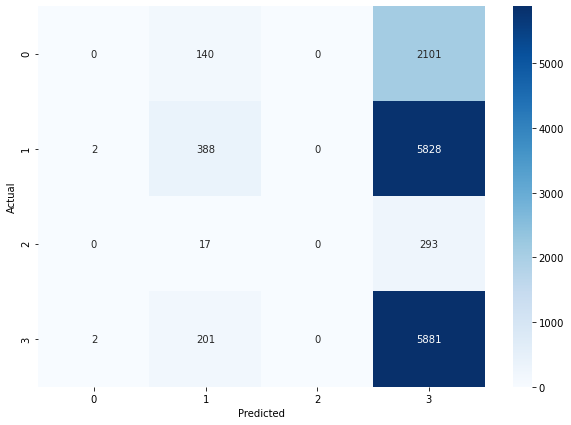

In [470]:
matrix = confusion_matrix(all_labels, all_predictions)

plt.figure(figsize = (10,7))
sns.heatmap(matrix, annot = True, cmap = 'Blues', fmt = 'g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [471]:
print(classification_report(all_labels, all_predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2241
           1       0.52      0.06      0.11      6218
           2       0.00      0.00      0.00       310
           3       0.42      0.97      0.58      6084

    accuracy                           0.42     14853
   macro avg       0.23      0.26      0.17     14853
weighted avg       0.39      0.42      0.29     14853



C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\V\Files\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [474]:
n_classes = 4

all_labels_bin = label_binarize(all_labels, classes = range(n_classes))
all_predictions_bin = label_binarize(all_predictions, classes = range(n_classes))

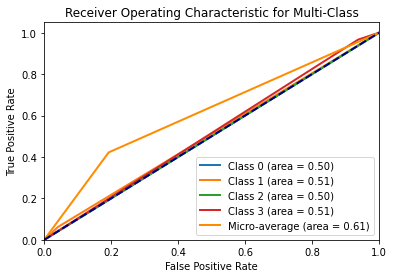

In [475]:
plt.figure()
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(all_labels_bin[:, i], all_predictions_bin[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw = 2, label = f'Class {i} (area = {roc_auc:.2f})')
    
fpr, tpr, _ = roc_curve(all_labels_bin.ravel(), all_predictions_bin.ravel())
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, color = 'darkorange', lw = 2, label = f'Micro-average (area = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw = 2, linestyle = '--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Multi-Class')
plt.legend(loc = "lower right")
plt.show()

In [766]:
all_keyword_predictions = []

with torch.no_grad():
    for inputs, labels, lda_dists in test_dataloader:
        severity_output, keywords_output = model_load(inputs, lda_dists)
        
        
        _, predicted_severity = torch.max(severity_output, 1)
        all_predictions.extend(predicted_severity.tolist())
        
        
        _, predicted_keywords = torch.max(keywords_output, 1)
        all_keyword_predictions.extend(predicted_keywords.tolist())
        
        
        all_labels.extend(labels.tolist())
        correct += predicted_severity.eq(labels).sum().item()
        total += labels.size(0)

accuracy = correct / total
print(f"Test Accuracy: {accuracy:.2%}")

Test Accuracy: 42.22%


In [768]:
id_to_token = {v: k for k, v in vocab.items()}

In [769]:
actual_tokens = []

for token_id in all_keyword_predictions:
    token = id_to_token.get(token_id, "<UNK>")  
    actual_tokens.append(token)

In [772]:
unique_values_list = []
unique = set()

for item in actual_tokens:
    if item not in unique:
        unique_values_list.append(item)
        unique.add(item)

print("Unique Values in Order:", unique_values_list)

Unique Values in Order: ['cloud', 'wildcard', 'control', 'add', 'try', 'popup', 'signaling', 'traffic', 'malicious', 'create', 'vcenter', 'expired', 'victims', 'backports', 'neighbor', 'packets']


In [770]:
print("Predicted Tokens:", actual_tokens)

Predicted Tokens: ['cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'wildcard', 'cloud', 'wildcard', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud', 'cloud

In [780]:
predictions_dict = {}
actual_tokens = []

with torch.no_grad():
    for inputs, labels, lda_dists in test_dataloader:
        severity_output, keywords_output = model_load(inputs, lda_dists)
        
        _, predicted_severity = torch.max(severity_output, 1)
        
        _, predicted_keywords = torch.max(keywords_output, 1)
        
        for i in range(len(predicted_severity)):
            sample_id = i 
            
            keyword_token = id_to_token.get(predicted_keywords[i].item(), "<UNK>")
            actual_tokens.append(keyword_token)
            
            predictions_dict[sample_id] = {
                'severity': predicted_severity[i].item(),
                'keywords': keyword_token  
            }

In [928]:
predictions_dict

{0: {'severity': 3, 'keywords': 'cloud'},
 1: {'severity': 3, 'keywords': 'cloud'},
 2: {'severity': 3, 'keywords': 'cloud'},
 3: {'severity': 3, 'keywords': 'cloud'},
 4: {'severity': 3, 'keywords': 'cloud'},
 5: {'severity': 3, 'keywords': 'cloud'},
 6: {'severity': 3, 'keywords': 'cloud'},
 7: {'severity': 3, 'keywords': 'cloud'},
 8: {'severity': 3, 'keywords': 'cloud'},
 9: {'severity': 3, 'keywords': 'cloud'},
 10: {'severity': 3, 'keywords': 'cloud'},
 11: {'severity': 3, 'keywords': 'cloud'},
 12: {'severity': 3, 'keywords': 'cloud'},
 13: {'severity': 3, 'keywords': 'cloud'},
 14: {'severity': 3, 'keywords': 'cloud'},
 15: {'severity': 3, 'keywords': 'cloud'},
 16: {'severity': 3, 'keywords': 'cloud'},
 17: {'severity': 3, 'keywords': 'cloud'},
 18: {'severity': 3, 'keywords': 'cloud'},
 19: {'severity': 3, 'keywords': 'cloud'},
 20: {'severity': 3, 'keywords': 'cloud'},
 21: {'severity': 3, 'keywords': 'cloud'},
 22: {'severity': 3, 'keywords': 'cloud'},
 23: {'severity': 3, 

In [776]:
predictions_dict = {}

with torch.no_grad():
    for inputs, labels, lda_dists in test_dataloader:
        severity_output, keywords_output = model_load(inputs, lda_dists)
        
        
        _, predicted_severity = torch.max(severity_output, 1)
        
       
        topk_values, topk_indices = torch.topk(keywords_output, k=5, dim=1)
        
        for i in range(len(predicted_severity)):
            sample_id = i  
            unique_keywords = list(set(topk_indices[i].tolist()))  
            predictions_dict[sample_id] = {
                'severity': predicted_severity[i].item(),
                'keywords': unique_keywords
            }

In [778]:
# predictions_df = pd.DataFrame(columns=['Sample_ID', 'Predicted_Severity', 'Predicted_Keywords'])

# with torch.no_grad():
#     for inputs, labels, lda_dists in test_dataloader:
#         severity_output, keywords_output = model_load(inputs, lda_dists)
        
#         
#         _, predicted_severity = torch.max(severity_output, 1)
        
#         
#         _, predicted_keywords = torch.max(keywords_output, 1)
        
#         for i in range(len(predicted_severity)):
#             sample_id = i  # Replace with actual sample ID if available
#             new_row = {'Sample_ID': sample_id, 'Predicted_Severity': predicted_severity[i].item(), 'Predicted_Keywords': predicted_keywords[i].item()}
#             predictions_df = predictions_df.append(new_row, ignore_index=True)
